In [1]:
# Importar todos los paquetes necesarios
import numpy as np # Para datos numéricos en forma de matriz
import pandas as pd # Para datos en forma de tabla
import matplotlib.pyplot as plt # Para fines de visualización (gráficos).
import matplotlib.pylab as pl # Para fines de visualización (gráficos).
import requests
import yfinance as yf # Para descargar datos de precios de acciones
import random # Para generar números aleatorios
import pandas_datareader as pdr # Para descargar datos financieros

import csv # Para leer archivos
from datetime import datetime, timedelta #Para ajustar las fechas

from matplotlib.collections import LineCollection # Para fines de visualización (gráficos).
from sklearn import cluster, covariance, manifold # Para análisis gráfico

from scipy.stats import norm # Scipy.stats contiene funciones estadísticas y probabilísticas, como la función de densidad de probabilidad y la función de distribución acumulada de la distribución normal (norm)
from scipy.optimize import minimize #La función "minimize" se utiliza para minimizar una función de una o varias variables, utilizando diversos métodos de optimización. Busca los valores de entrada de una función que minimicen su valor de salida

# Ignorar las advertencias que puedan aparecer
import warnings
warnings.filterwarnings('ignore')

# Cargar automáticamente los módulos que se han actualizado desde la última carga
%load_ext autoreload
%autoreload 2

# Mostrar gráficos generados en la notebook
%matplotlib inline

In [2]:
# Importa la función definida por el usuario desde el archivo de Python.
from Graphical_Analysis_functions import *

[*********************100%***********************]  50 of 50 completed


In [3]:
# Verificar que estamos considerando todas las empresas del S&P 500:
len(sp500_table)

503

# Análisis Gráfico  
A continuación, se presenta un algoritmo de análisis gráfico que será aplicado al rendimiento semanal de 10 submuestras de 30 acciones cada una, seleccionadas de manera aleatoria. El algoritmo utiliza varias técnicas de aprendizaje no supervisado y las combina para visualizar los resultados.

El algoritmo toma los retornos semanales de las acciones como entrada, y los alimenta en tres técnicas de aprendizaje no supervisado en orden. Las tres técnicas son:

- ***Sparse Inverse Covariance Estimation*** se utiliza en los datos de rendimiento y produce una matriz dispersa cuyos elementos representan la correlación condicional entre cualquier par de retornos de acciones.
    - Proporciona información sobre qué acciones están correlacionadas condicionalmente con las demás, y podemos utilizar esta información para construir la red gráfica.
        - El estimador que utilizamos en este ejemplo de análisis gráfico se llama **Graphical Lasso**, que utiliza una penalización l1 para imponer la dispersión en la matriz de precisión.
- ***Affinity Propagation*** es un método de agrupamiento que organiza los retornos en grupos. No impone grupos de tamaño igual, y puede elegir automáticamente el número de grupos a partir de los datos.
    - Los retornos de las acciones que se agrupan juntos se pueden considerar que tienen un impacto similar a nivel del mercado de valores completo.
- ***Manifold Learning*** es un método de incrustación no lineal que proyecta un gráfico de alta dimensionalidad en un plano 2D. El gráfico 2D se construye combinando los resultados de las técnicas anteriores de la siguiente manera:
    - Cada nodo corresponde a una acción, con el color definido por la etiqueta de clúster de Propagación de Afinidad.
    - Cada arco une dos acciones.
        - la **fuerza** del borde está definida por la matriz de covarianza inversa dispersa (es decir, la matriz de precisión). Cuanto mayor sea el valor, más correlacionadas estarán condicionalmente las dos acciones.
    - La incrustación 2D de Maniford se utiliza para colocar los nodos en el plano.
        - El método de aprendizaje de Manifold que utilizamos en este ejemplo de análisis gráfico se llama **Multidimensional scaling (MDS)**, que busca una representación de baja dimensionalidad de los datos en la que las distancias respeten bien las distancias en el espacio de alta dimensionalidad original.

# Submuestra Aleatoria 1.-
------------

A continuación se muestra la información resumida de la primera submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [4]:
# Submuestra 1
Submuestra1 = firms_info 
Submuestra1

,Name,Sector
Ticker,,
AMD,AMD,Information Technology
ANSS,Ansys,Information Technology
AON,Aon,Financials
APA,APA Corporation,Energy
AJG,Arthur J. Gallagher & Co.,Financials
CPB,Campbell Soup Company,Consumer Staples
CE,Celanese,Materials
CTAS,Cintas,Industrials
DHI,D.R. Horton,Consumer Discretionary


De igual forma, se presenta la información de los sectores que contemplan la submuestra 1, los retornos semanales de la muestra de acciones y la serie de tiempo de la tasa libre de riesgo. Cabe mencionar que lo descrito solo se mostrará como ejemplo para la submuestra 1. A diferencia de la variable "data", "TBill" es una serie de tiempo que no tendrá ninguna modificación a lo largo del anáslisis.

In [5]:
# Sectores de la muestra 1
Sectors = firms_info.Sector.unique()
print(Sectors)

['Information Technology' 'Financials' 'Energy' 'Consumer Staples'
 'Materials' 'Industrials' 'Consumer Discretionary'
 'Communication Services' 'Health Care' 'Utilities' 'Real Estate']


In [6]:
# Retornos semanales de la muestra 1 de 30 acciones
data

,AJG,AMD,ANSS,AON,APA,BEN,CE,CPB,CTAS,DHI,...,STLD,SYF,TSCO,TTWO,TXT,URI,VICI,WBD,WDC,WYNN
Date,,,,,,,,,,,,,,,,,,,,,
2013-03-10,0.011218,0.066667,0.032500,-0.004629,0.040148,0.031687,0.035683,-0.009337,0.015106,0.035714,...,0.064753,NaN,0.009838,0.028686,0.061452,0.052834,NaN,0.030560,-0.003138,0.006864
2013-03-17,0.022703,0.015625,0.004766,-0.005148,0.000397,0.020839,-0.005284,0.005558,0.008343,0.011218,...,-0.030094,NaN,-0.035243,0.016861,0.022049,-0.038504,NaN,-0.007445,0.052455,0.022326
2013-03-24,0.021696,-0.023077,-0.008612,0.006177,-0.015988,-0.008406,-0.081810,0.041817,-0.029741,0.015612,...,0.005171,NaN,0.010890,-0.011480,-0.009662,0.021636,NaN,0.023409,-0.044457,0.017588
2013-03-31,0.020000,0.003937,0.025053,0.020409,0.036122,0.016585,0.019440,0.046366,0.017055,-0.016990,...,0.028373,NaN,0.019782,0.041935,-0.030569,0.021178,NaN,-0.004929,0.054786,0.025229
2013-04-07,-0.008715,-0.101961,-0.060673,-0.020000,-0.038362,-0.018169,-0.029285,-0.013007,-0.006118,-0.050206,...,-0.076826,NaN,0.018247,-0.045201,-0.041932,-0.056758,NaN,-0.002286,-0.009744,-0.056887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-05,-0.001651,0.141777,0.032100,-0.015991,-0.080691,0.083008,0.041079,-0.004889,0.011778,0.030564,...,0.077777,0.005852,0.012806,-0.043752,0.029884,0.048331,0.010838,0.034205,-0.038248,-0.000291
2023-02-12,0.008114,-0.053549,-0.029757,0.013327,0.036156,-0.070634,-0.044400,0.010810,0.000994,-0.006350,...,-0.045717,-0.017004,0.019426,0.016654,-0.008866,-0.010883,-0.000869,-0.077821,-0.005549,0.055167
2023-02-19,-0.033118,-0.036573,0.013931,-0.023756,-0.125574,0.013260,-0.002415,0.017888,0.005381,-0.042702,...,0.021664,-0.017847,0.025751,0.012691,0.013960,0.028084,-0.017111,0.085091,-0.033248,0.003406


In [7]:
# Conjunto de datos de información de la tasa libre de riesgo (TBill)   
TBill

,T-Bill
DATE,
2013-03-10,0.000019
2013-03-17,0.000019
2013-03-24,0.000013
2013-03-31,0.000015
2013-04-07,0.000013
...,...
2023-02-05,0.000858
2023-02-12,0.000867
2023-02-19,0.000880


Especificaciones para el análisis Gráfico:
- Ingrese fechas específicas en "**start_date**" y "**end_date**" para especificar la fecha de inicio y la fecha de finalización.
- De manera predeterminada ( i.e. **Sectors_chosen** = [] ), TODOS los sectores se incluirán en el análisis gráfico.
    - Si se ingresan ciertos sectores en la opción "**Sectors_chosen**", entonces solo esos sectores se examinarán en el análisis gráfico de la red.
- De manera predeterminada  ( i.e. **drop_firm** = [] ), TODAS las empresas de los sectores dados (especificados en "Sectors_chosen") se incluirán en el análisis gráfico.
    - si se ingresan ciertas empresas en la opción "**drop_firm**", entonces solo esas empresas NO se examinarán en el análisis gráfico de la red.
- De manera predeterminada(i.e. **display_SumStat** = True, **display_IndRet** = True), las estadísticas resumidas y el rendimiento individual de la empresa (retornos acumulativos de la empresa individual) serán mostrados.

In [8]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = [] # De manera predeterminada se incluyen todos los sectores

# La lista de empresas que se desea eliminar:
drop_firm = [] # De manera predeterminada no se elimina ninguna empresa

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
DOW
KEYS
PAYC
SYF
VICI

Number of firms examined: 45
Cluster 1: AJG, AON, CTAS, FDS, FISV
Cluster 2: AMD
Cluster 3: ANSS, MTD, PTC, SNPS
Cluster 4: CPB, HRL, K
Cluster 5: DHI, LEN
Cluster 6: APA, BEN, CE, ECL, EMN, LYB, NTAP, ODFL, PPG, URI, WDC, WYNN
Cluster 7: GILD
Cluster 8: KDP
Cluster 9: DISH, KEY, LYV, PNC, SPG, TXT, WBD
Cluster 10: MNST
Cluster 11: NUE, STLD
Cluster 12: LH, PPL, SRE
Cluster 13: ORLY, TSCO
Cluster 14: TTWO


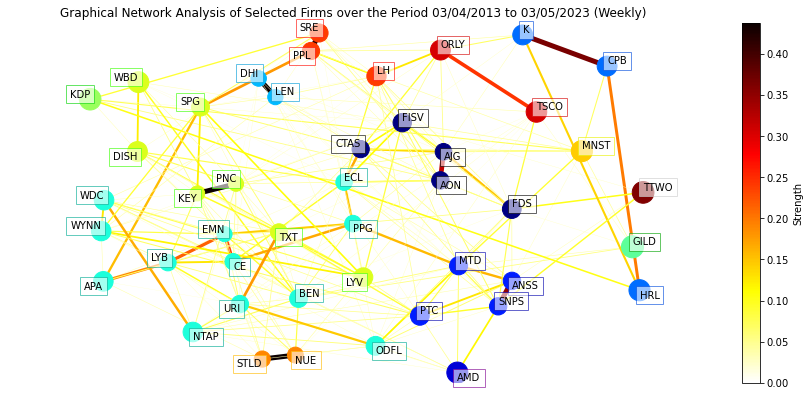

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


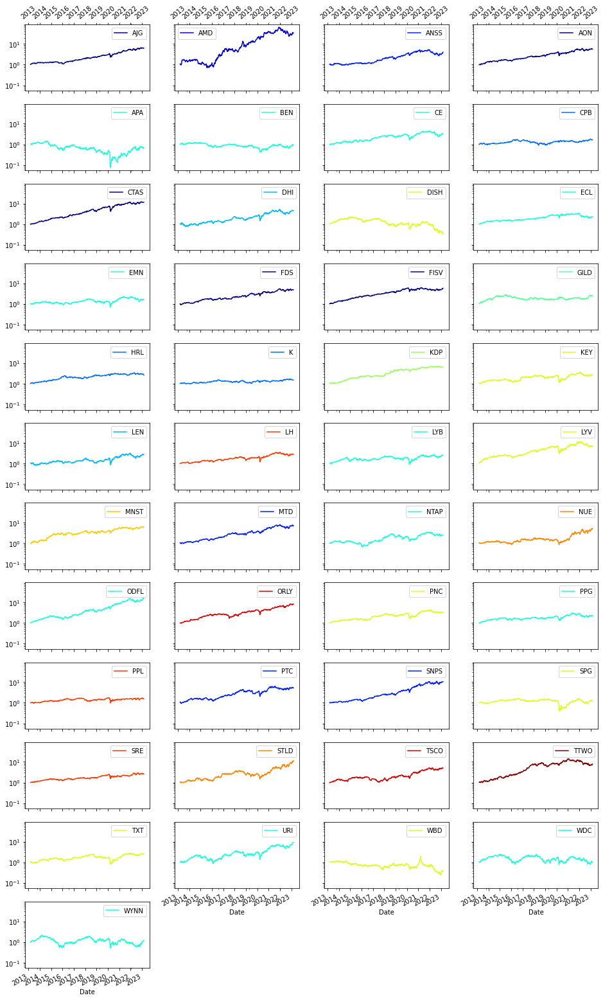

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
AJG,Financials,523.34,0.39,20.00,20.65,0.92,-34.15
AMD,Information Technology,3296.67,0.98,42.08,56.96,0.72,-64.00
ANSS,Information Technology,301.88,0.34,14.86,26.77,0.52,-50.03
AON,Financials,457.77,0.38,18.68,23.52,0.75,-36.56
APA,Energy,-32.24,0.26,-3.80,57.32,-0.08,-94.60
BEN,Financials,-10.25,0.07,-1.07,29.87,-0.06,-66.30
CE,Materials,231.62,0.31,12.68,29.75,0.39,-48.87
CPB,Consumer Staples,66.99,0.15,5.24,23.74,0.18,-47.93
CTAS,Industrials,1048.26,0.53,27.53,24.86,1.07,-45.42
DHI,Consumer Discretionary,342.66,0.40,15.97,34.39,0.44,-49.29


In [9]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

Podemos usar el siguiente código para enfocarnos en un sector particular (o sectores) del grafo de red.
En este ejemplo, el enfoque está en el sector Financiero considerando la cantidad de empresas pertenecientes al sector que forman parte de la Submuestra 1.

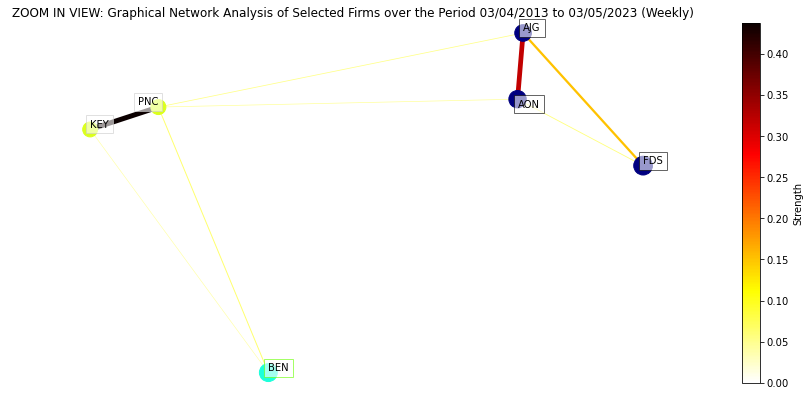

In [10]:
Sectors_list = ['Financials']
graphicalAnalysis_plot_ZOOM_bySector(Sectors_list, con_fig)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 1:
- **Cluster 1:** AJG, AON, CTAS, FDS, FISV
- **Cluster 2:** AMD
- **Cluster 3:** ANSS, MTD, PTC, SNPS
- **Cluster 4:** CPB, HRL, K
- **Cluster 5:** DHI, LEN
- **Cluster 6:** APA, BEN, CE, ECL, EMN, LYB, NTAP, ODFL, PPG, URI, WDC, WYNN
- **Cluster 7:** GILD
- **Cluster 8:** KDP
- **Cluster 9:** DISH, KEY, LYV, PNC, SPG, TXT, WBD
- **Cluster 10:** MNST
- **Cluster 11:** NUE, STLD
- **Cluster 12:** LH, PPL, SRE
- **Cluster 13:** ORLY, TSCO
- **Cluster 14:** TTWO


Podemos enfocarnos en los clusters 1, 6 y 9, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['AJG', 'AON', 'CTAS', 'FDS', 'FISV']


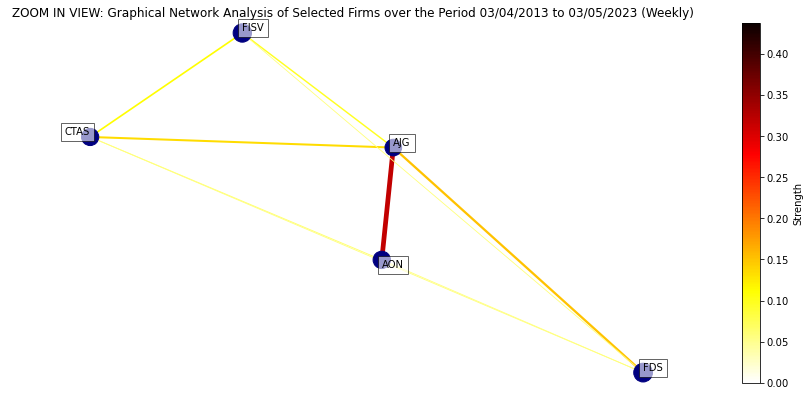

In [16]:
# Cluster 1
firms_list = ['AJG', 'AON', 'CTAS', 'FDS', 'FISV']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['APA', 'BEN', 'CE', 'ECL', 'EMN', 'LYB', 'NTAP', 'ODFL', 'PPG', 'URI', 'WDC', 'WYNN']


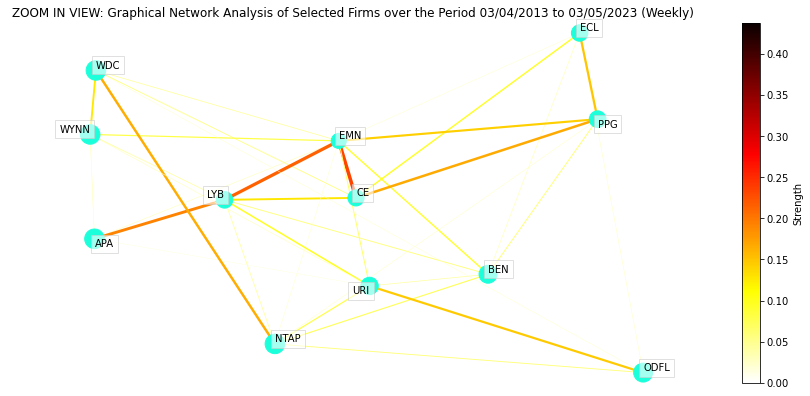

In [17]:
# Cluster 6
firms_list = ['APA', 'BEN', 'CE', 'ECL', 'EMN', 'LYB', 'NTAP', 'ODFL', 'PPG', 'URI', 'WDC', 'WYNN']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['DISH', 'KEY', 'LYV', 'PNC', 'SPG', 'TXT', 'WBD']


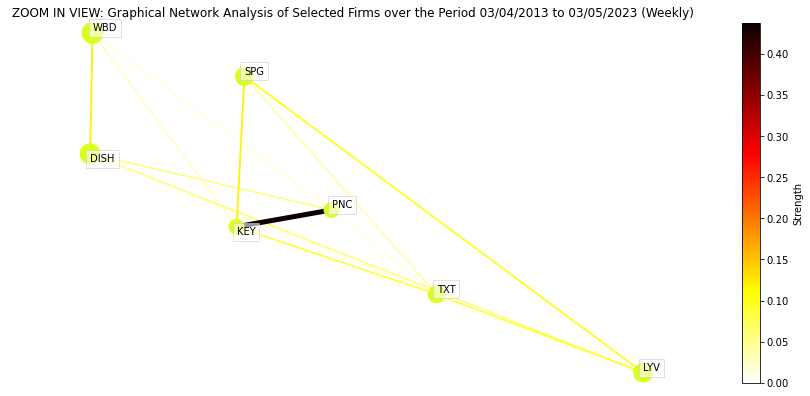

In [18]:
# Cluster 9
firms_list = ['DISH', 'KEY', 'LYV', 'PNC', 'SPG', 'TXT', 'WBD']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [19]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 1
sortDataBySharpeRatio(data[['AJG', 'AON', 'CTAS', 'FDS', 'FISV']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['CTAS', 'AJG', 'FISV', 'AON', 'FDS']

In [20]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 3
sortDataBySharpeRatio(data[['ANSS','MTD','PTC','SNPS']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['SNPS', 'MTD', 'PTC', 'ANSS']

In [21]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 4
sortDataBySharpeRatio(data[['CPB','HRL','K']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['HRL', 'CPB', 'K']

In [22]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 5
sortDataBySharpeRatio(data[['DHI','LEN']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['DHI', 'LEN']

In [23]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 6
sortDataBySharpeRatio(data[['APA', 'BEN', 'CE', 'ECL', 'EMN', 'LYB', 'NTAP', 'ODFL', 'PPG', 'URI', 'WDC', 'WYNN']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['ODFL',
 'URI',
 'CE',
 'ECL',
 'PPG',
 'NTAP',
 'LYB',
 'EMN',
 'WYNN',
 'WDC',
 'BEN',
 'APA']

In [24]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 9
sortDataBySharpeRatio(data[['DISH', 'KEY', 'LYV', 'PNC', 'SPG', 'TXT', 'WBD']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['LYV', 'PNC', 'TXT', 'KEY', 'SPG', 'WBD', 'DISH']

In [25]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 11
sortDataBySharpeRatio(data[['NUE','STLD']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['STLD', 'NUE']

In [26]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 12
sortDataBySharpeRatio(data[['LH','PPL','SRE']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['SRE', 'LH', 'PPL']

In [27]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 13
sortDataBySharpeRatio(data[['ORLY','TSCO']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['ORLY', 'TSCO']

# Portafolio 1.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 1,25.66,16.77,-0.23,6.14,0.03,0.05,1.46,-24.96


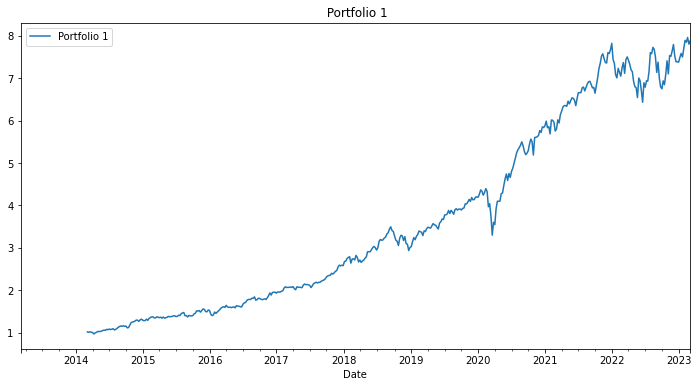

In [28]:
# vector de retornos esperados
er_p1 = annualize_rets(data[['CTAS','AMD','SNPS','HRL','DHI','ODFL','GILD','KDP','LYV','MNST','STLD','SRE','ORLY','TTWO']], 52)
# matriz de covarianza
cov_p1 = data[['CTAS','AMD','SNPS','HRL','DHI','ODFL','GILD','KDP','LYV','MNST','STLD','SRE','ORLY','TTWO']].cov()

weight_p1 = lambda x: weight_msr(er=er_p1, cov=cov_p1, rf=TBill['T-Bill'])
p1 = backtest_ws(data[['CTAS','AMD','SNPS','HRL','DHI','ODFL','GILD','KDP','LYV','MNST','STLD','SRE','ORLY','TTWO']], estimation_window=52, weighting=weight_p1)
btr = pd.DataFrame({"Portfolio 1": p1})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 1")
summary_stats(btr.dropna())

In [29]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p1, cov=cov_p1, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio1 = pd.Series((weights_str), index = data[['CTAS','AMD','SNPS','HRL','DHI','ODFL','GILD','KDP','LYV','MNST','STLD','SRE','ORLY','TTWO']].columns)
Portfolio1

CTAS    15.00
AMD      1.97
SNPS    11.99
HRL     11.27
DHI      0.00
ODFL    15.00
GILD     0.00
KDP     15.00
LYV      0.00
MNST     1.99
STLD     3.66
SRE      0.00
ORLY    12.14
TTWO    11.98
dtype: object

# Portafolio 2.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 2,24.69,18.26,-0.15,4.97,0.04,0.06,1.29,-21.65


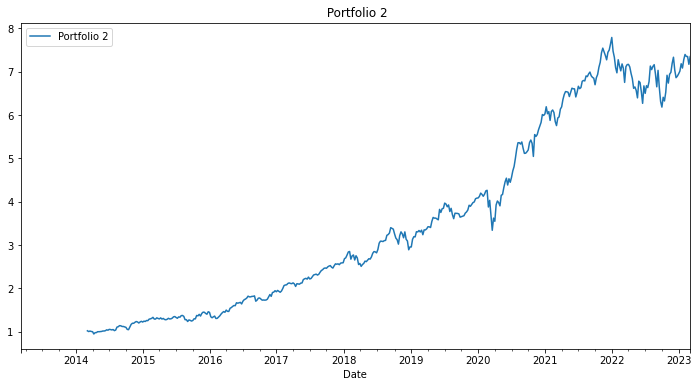

In [30]:
# vector de retornos esperados
er_p2 = annualize_rets(data[['AJG','AMD','MTD','CPB','LEN','URI','GILD','KDP','PNC','MNST','NUE','LH','TSCO','TTWO']], 52)
# matriz de covarianza
cov_p2 = data[['AJG','AMD','MTD','CPB','LEN','URI','GILD','KDP','PNC','MNST','NUE','LH','TSCO','TTWO']].cov()

weight_p2 = lambda x: weight_msr(er=er_p2, cov=cov_p2, rf=TBill['T-Bill'])
p2 = backtest_ws(data[['AJG','AMD','MTD','CPB','LEN','URI','GILD','KDP','PNC','MNST','NUE','LH','TSCO','TTWO']], estimation_window=52, weighting=weight_p2)
btr = pd.DataFrame({"Portfolio 2": p2})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 2")
summary_stats(btr.dropna())

In [31]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p2, cov=cov_p2, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio2 = pd.Series((weights_str), index = data[['AJG','AMD','MTD','CPB','LEN','URI','GILD','KDP','PNC','MNST','NUE','LH','TSCO','TTWO']].columns)
Portfolio2

AJG     15.00
AMD      9.93
MTD     15.00
CPB      1.58
LEN      0.00
URI      0.00
GILD     1.96
KDP     15.00
PNC      0.00
MNST    14.92
NUE      2.39
LH       0.00
TSCO     9.21
TTWO    15.00
dtype: object

# Portafolio 3.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 3,26.4,18.79,-0.28,6.28,0.04,0.06,1.34,-27.89


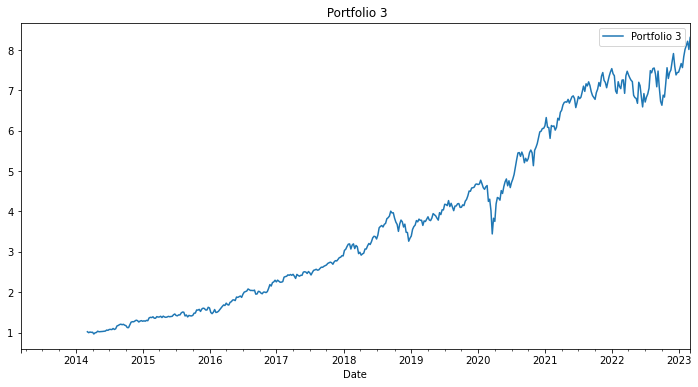

In [32]:
# vector de retornos esperados
er_p3 = annualize_rets(data[['FISV','AMD','PTC','K','DHI','CE','GILD','KDP','TXT','MNST','STLD','PPL','ORLY','TTWO']], 52)
# matriz de covarianza
cov_p3 = data[['FISV','AMD','PTC','K','DHI','CE','GILD','KDP','TXT','MNST','STLD','PPL','ORLY','TTWO']].cov()

weight_p3 = lambda x: weight_msr(er=er_p3, cov=cov_p3, rf=TBill['T-Bill'])
p3 = backtest_ws(data[['FISV','AMD','PTC','K','DHI','CE','GILD','KDP','TXT','MNST','STLD','PPL','ORLY','TTWO']], estimation_window=52, weighting=weight_p3)
btr = pd.DataFrame({"Portfolio 3": p3})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 3")
summary_stats(btr.dropna())

In [33]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p3, cov=cov_p3, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio3 = pd.Series((weights_str), index = data[['FISV','AMD','PTC','K','DHI','CE','GILD','KDP','TXT','MNST','STLD','PPL','ORLY','TTWO']].columns)
Portfolio3

FISV    15.00
AMD      9.32
PTC      0.00
K        0.00
DHI      0.00
CE       0.00
GILD     1.70
KDP     15.00
TXT      0.00
MNST    14.96
STLD    14.01
PPL      0.00
ORLY    15.00
TTWO    15.00
dtype: object

Almacenamos la serie de tiempo que contiene los rendimientos semanales de los activos en la variable "data_m1" por si deseamos acceder a esa información en el tiempo, considerando que se creará una nueva muestra de datos

In [34]:
data_m1 = data

# Submuestra Aleatoria 2.-
------------

A continuación se muestra la información resumida de la segunda submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [35]:
# SUBMUESTREO ALEATORIO 2
# Seleccionar una submuestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker') 

In [36]:
# Submuestra 2
Submuestra2 = firms_info 
Submuestra2

,Name,Sector
Ticker,,
AAL,American Airlines Group,Industrials
AWK,American Water Works,Utilities
APH,Amphenol,Information Technology
ADI,Analog Devices,Information Technology
ANSS,Ansys,Information Technology
APTV,Aptiv,Consumer Discretionary
BA,Boeing,Industrials
BKNG,Booking Holdings,Consumer Discretionary
KMX,CarMax,Consumer Discretionary


In [37]:
# Sectores de la SUBmuestra 2
Sectors = firms_info.Sector.unique()
print(Sectors)

['Industrials' 'Utilities' 'Information Technology'
 'Consumer Discretionary' 'Health Care' 'Real Estate' 'Energy' 'Materials'
 'Financials' 'Communication Services' 'Consumer Staples']


In [38]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed


In [39]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
ETSY
KHC
LW
OTIS

Number of firms examined: 46
Cluster 1: AWK, CCI, IRM, PNW, RSG
Cluster 2: CRL, IDXX, ILMN
Cluster 3: DPZ
Cluster 4: DVA
Cluster 5: MKC, SJM
Cluster 6: MOH
Cluster 7: DVN, MPC, MRO, OKE
Cluster 8: ICE, NDAQ, ORLY
Cluster 9: AAL, BA, FMC, HII, RTX, SYY, TRV, USB
Cluster 10: ADI, ANSS, APH, APTV, BKNG, CAT, CTSH, EBAY, GRMN, IPG, IVZ, KMX, MAS, MTD, NDSN, TEL, V, WY


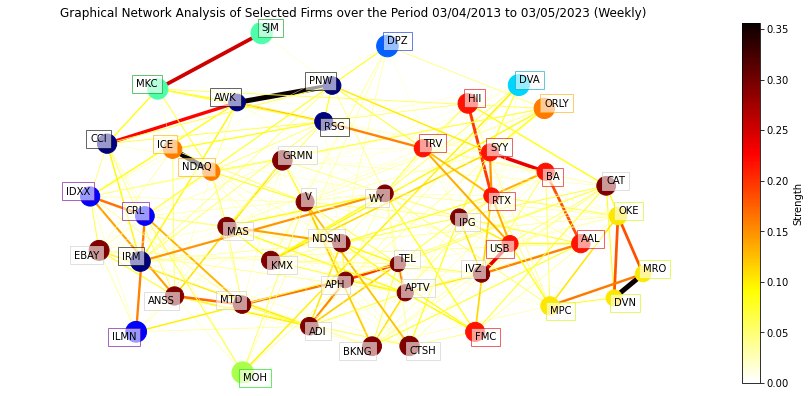

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


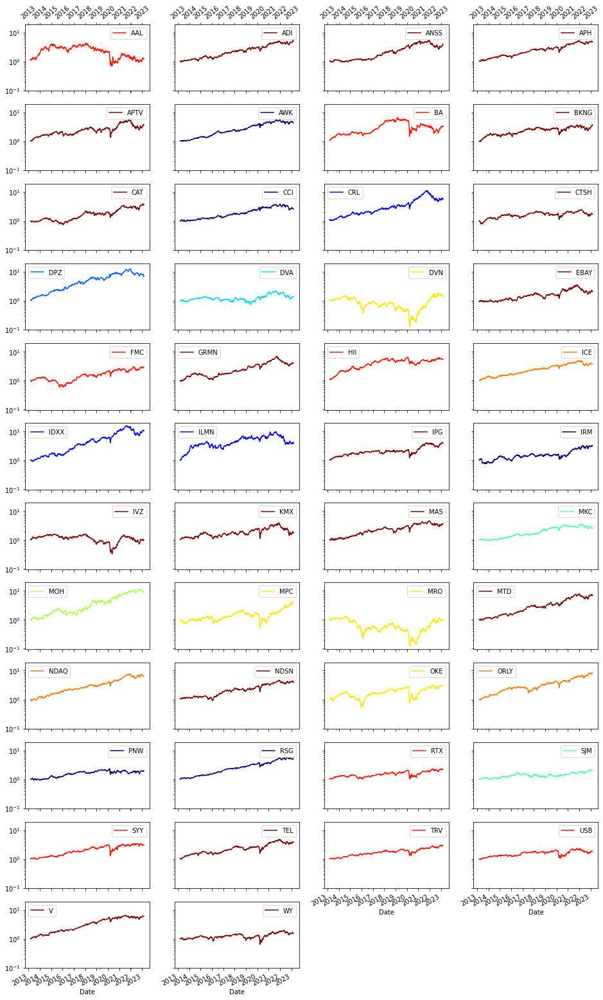

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
AAL,NaN,24.85,0.31,2.24,53.84,0.03,-84.14
ADI,NaN,416.25,0.38,17.76,26.39,0.64,-30.32
ANSS,Information Technology,301.88,0.34,14.86,26.77,0.52,-50.03
APH,NaN,383.65,0.35,17.00,23.22,0.69,-37.29
APTV,NaN,268.45,0.38,13.87,37.09,0.35,-57.30
AWK,NaN,324.03,0.33,15.48,22.55,0.64,-31.67
BA,NaN,230.86,0.42,12.66,45.47,0.26,-77.92
BKNG,NaN,267.00,0.35,13.83,32.02,0.40,-45.88
CAT,NaN,277.12,0.33,14.14,28.51,0.46,-42.59
CCI,NaN,154.00,0.23,9.73,23.35,0.38,-39.23


In [40]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 2:
- **Cluster 1:** AWK, CCI, IRM, PNW, RSG
- **Cluster 2:** CRL, IDXX, ILMN
- **Cluster 3:** DPZ
- **Cluster 4:** DVA
- **Cluster 5:** MKC, SJM
- **Cluster 6:** MOH
- **Cluster 7:** DVN, MPC, MRO, OKE
- **Cluster 8:** ICE, NDAQ, ORLY
- **Cluster 9:** AAL, BA, FMC, HII, RTX, SYY, TRV, USB
- **Cluster 10:** ADI, ANSS, APH, APTV, BKNG, CAT, CTSH, EBAY, GRMN, IPG, IVZ, KMX, MAS, MTD, NDSN, TEL, V, WY
  
Podemos enfocarnos en los clusters 1, 9 y 10, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['AWK', 'CCI', 'IRM', 'PNW', 'RSG']


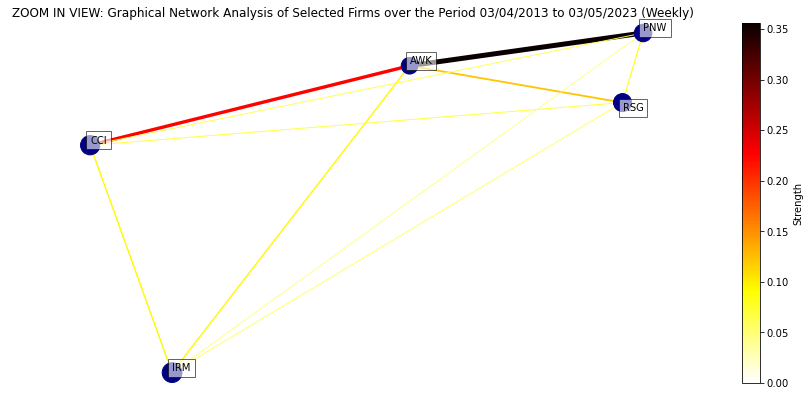

In [41]:
# Cluster 1
firms_list = ['AWK', 'CCI', 'IRM', 'PNW', 'RSG']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['AAL', 'BA', 'FMC', 'HII', 'RTX', 'SYY', 'TRV', 'USB']


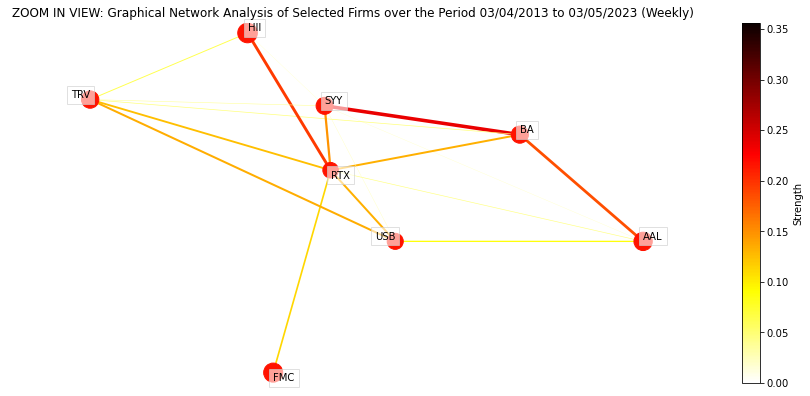

In [42]:
# Cluster 9
firms_list = ['AAL', 'BA', 'FMC', 'HII', 'RTX', 'SYY', 'TRV', 'USB']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['ADI', 'ANSS', 'APH', 'APTV', 'BKNG', 'CAT', 'CTSH', 'EBAY', 'GRMN', 'IPG', 'IVZ', 'KMX', 'MAS', 'MTD', 'NDSN', 'TEL', 'V', 'WY']


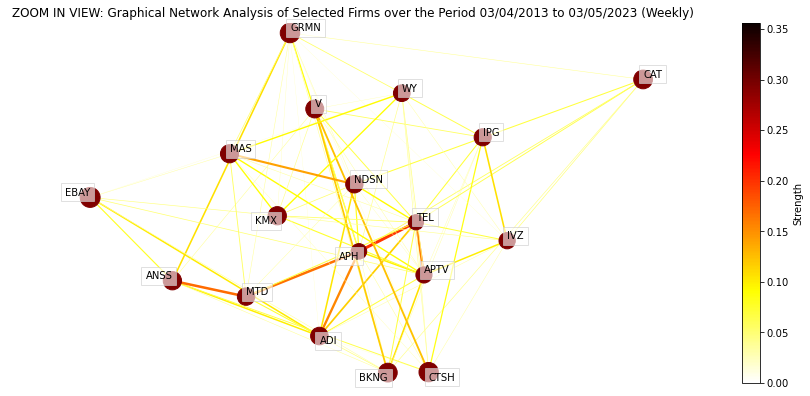

In [43]:
# Cluster 10
firms_list = ['ADI', 'ANSS', 'APH', 'APTV', 'BKNG', 'CAT', 'CTSH', 'EBAY', 'GRMN', 'IPG', 'IVZ', 'KMX', 'MAS', 'MTD', 'NDSN', 'TEL', 'V', 'WY']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [44]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 1
sortDataBySharpeRatio(data[['AWK', 'CCI', 'IRM', 'PNW', 'RSG']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['RSG', 'AWK', 'CCI', 'IRM', 'PNW']

In [45]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 2
sortDataBySharpeRatio(data[['CRL','IDXX','ILMN']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['IDXX', 'CRL', 'ILMN']

In [46]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 5
sortDataBySharpeRatio(data[['MKC','SJM']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['MKC', 'SJM']

In [47]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 7
sortDataBySharpeRatio(data[['DVN','MPC','MRO','OKE']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['MPC', 'OKE', 'DVN', 'MRO']

In [48]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 8
sortDataBySharpeRatio(data[['ICE','NDAQ','ORLY']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['NDAQ', 'ORLY', 'ICE']

In [49]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 9
sortDataBySharpeRatio(data[['AAL', 'BA', 'FMC', 'HII', 'RTX', 'SYY', 'TRV', 'USB']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['HII', 'TRV', 'FMC', 'SYY', 'RTX', 'BA', 'USB', 'AAL']

In [50]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 10
sortDataBySharpeRatio(data[['ADI', 'ANSS', 'APH', 'APTV', 'BKNG', 'CAT', 'CTSH', 'EBAY', 'GRMN', 'IPG', 'IVZ', 'KMX', 'MAS', 'MTD', 'NDSN', 'TEL', 'V', 'WY']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['V',
 'MTD',
 'APH',
 'ADI',
 'GRMN',
 'ANSS',
 'TEL',
 'NDSN',
 'CAT',
 'IPG',
 'MAS',
 'BKNG',
 'APTV',
 'EBAY',
 'CTSH',
 'KMX',
 'WY',
 'IVZ']

# Portafolio 4.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 4,19.49,17.95,-0.53,11.42,0.04,0.06,1.02,-31.85


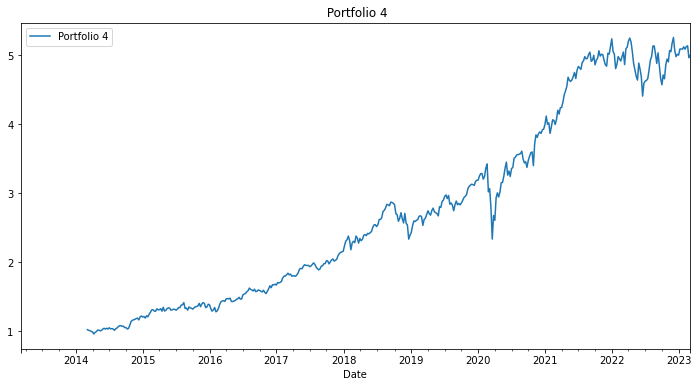

In [51]:
# vector de retornos esperados
er_p4 = annualize_rets(data[['RSG','IDXX','DPZ','DVA','MKC','MOH','MPC','NDAQ','HII','V']], 52)
# matriz de covarianza
cov_p4 = data[['RSG','IDXX','DPZ','DVA','MKC','MOH','MPC','NDAQ','HII','V']].cov()

weight_p4 = lambda x: weight_msr(er=er_p4, cov=cov_p4, rf=TBill['T-Bill'])
p4 = backtest_ws(data[['RSG','IDXX','DPZ','DVA','MKC','MOH','MPC','NDAQ','HII','V']], estimation_window=52, weighting=weight_p4)
btr = pd.DataFrame({"Portfolio 4": p4})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 4")
summary_stats(btr.dropna())

In [52]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p4, cov=cov_p4, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio4 = pd.Series((weights_str), index = data[['RSG','IDXX','DPZ','DVA','MKC','MOH','MPC','NDAQ','HII','V']].columns)
Portfolio4

RSG     10.00
IDXX    10.00
DPZ     10.00
DVA     10.00
MKC     10.00
MOH     10.00
MPC     10.00
NDAQ    10.00
HII     10.00
V       10.00
dtype: object

# Portafolio 5.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 5,17.93,18.25,-0.53,10.38,0.04,0.06,0.92,-30.49


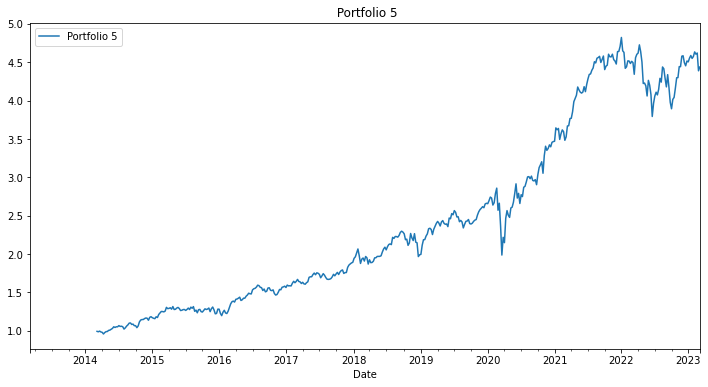

In [53]:
# vector de retornos esperados
er_p5 = annualize_rets(data[['AWK','CRL','DPZ','DVA','SJM','MOH','OKE','ORLY','TRV','MTD']], 52)
# matriz de covarianza
cov_p5 = data[['AWK','CRL','DPZ','DVA','SJM','MOH','OKE','ORLY','TRV','MTD']].cov()

weight_p5 = lambda x: weight_msr(er=er_p5, cov=cov_p5, rf=TBill['T-Bill'])
p5 = backtest_ws(data[['AWK','CRL','DPZ','DVA','SJM','MOH','OKE','ORLY','TRV','MTD']], estimation_window=52, weighting=weight_p5)
btr = pd.DataFrame({"Portfolio 5": p5})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 5")
summary_stats(btr.dropna())

In [54]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p5, cov=cov_p5, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio5 = pd.Series((weights_str), index = data[['AWK','CRL','DPZ','DVA','SJM','MOH','OKE','ORLY','TRV','MTD']].columns)
Portfolio5

AWK     10.00
CRL     10.00
DPZ     10.00
DVA     10.00
SJM     10.00
MOH     10.00
OKE     10.00
ORLY    10.00
TRV     10.00
MTD     10.00
dtype: object

# Portafolio 6.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 6,14.47,18.47,-0.65,8.41,0.04,0.06,0.73,-30.5


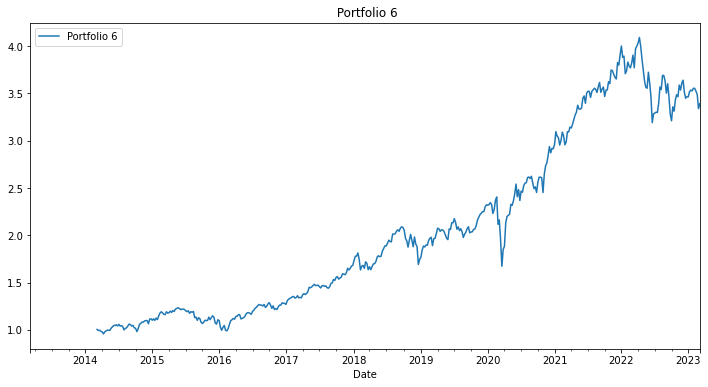

In [55]:
# vector de retornos esperados
er_p6 = annualize_rets(data[['CCI','ILMN','DPZ','DVA','MKC','MOH','DVN','ICE','FMC','APH']], 52)
# matriz de covarianza
cov_p6 = data[['CCI','ILMN','DPZ','DVA','MKC','MOH','DVN','ICE','FMC','APH']].cov()

weight_p6 = lambda x: weight_msr(er=er_p6, cov=cov_p6, rf=TBill['T-Bill'])
p6 = backtest_ws(data[['CCI','ILMN','DPZ','DVA','MKC','MOH','DVN','ICE','FMC','APH']], estimation_window=52, weighting=weight_p6)
btr = pd.DataFrame({"Portfolio 6": p6})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 6")
summary_stats(btr.dropna())

In [56]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p6, cov=cov_p6, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio6 = pd.Series((weights_str), index = data[['CCI','ILMN','DPZ','DVA','MKC','MOH','DVN','ICE','FMC','APH']].columns)
Portfolio6

CCI     10.00
ILMN    10.00
DPZ     10.00
DVA     10.00
MKC     10.00
MOH     10.00
DVN     10.00
ICE     10.00
FMC     10.00
APH     10.00
dtype: object

In [57]:
data_m2 = data

# Subuestra Aleatoria 3.-
------------

A continuación se muestra la información resumida de la tercera submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [60]:
# SUBMUESTREO ALEATORIO 3
# Seleccionar una muestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker')

In [61]:
# Submuestra 3
Submuestra3 = firms_info 
Submuestra3

,Name,Sector
Ticker,,
AKAM,Akamai,Information Technology
ALK,Alaska Air Group,Industrials
GOOGL,Alphabet Inc. (Class A),Communication Services
ANSS,Ansys,Information Technology
AZO,AutoZone,Consumer Discretionary
CDNS,Cadence Design Systems,Information Technology
CPT,Camden Property Trust,Real Estate
COF,Capital One,Financials
CAH,Cardinal Health,Health Care


In [62]:
# Sectores de la submuestra 3
Sectors = firms_info.Sector.unique()
print(Sectors)

['Information Technology' 'Industrials' 'Communication Services'
 'Consumer Discretionary' 'Real Estate' 'Financials' 'Health Care'
 'Consumer Staples' 'Materials' 'Energy']


In [63]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed


In [64]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
CDW
CFG
HPE
OTIS

Number of firms examined: 46
Cluster 1: CBOE
Cluster 2: CHD, HRL
Cluster 3: DPZ
Cluster 4: ALK, CBRE, COF, CPT, FITB, HBAN, HCA, HIG, HST, MCD, NUE, PFG, PNC, RJF, ROST, TT, WAB, WDC, WYNN, ZION
Cluster 5: DHI, FAST, MAS, MHK
Cluster 6: AZO, ORLY
Cluster 7: AKAM, ANSS, CDNS, COST, CSGP, GOOGL, IDXX, KLAC, MSCI, SNPS, TMO
Cluster 8: OXY, TRGP
Cluster 9: CAH, LH, UNH


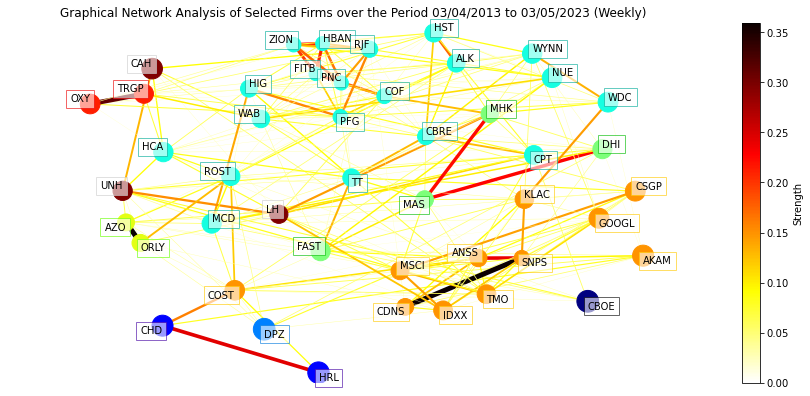

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


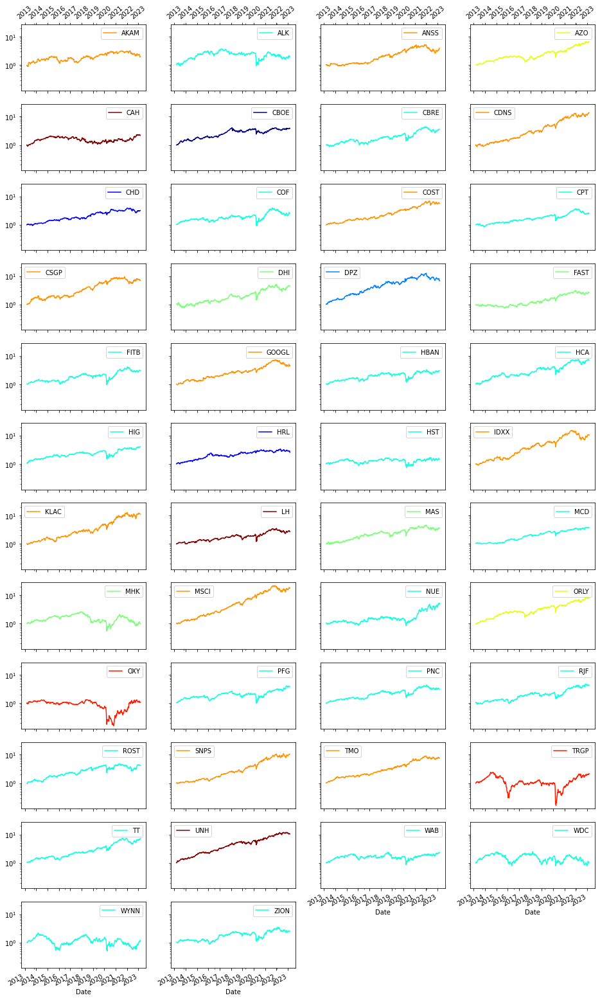

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
AKAM,NaN,102.27,0.23,7.27,31.10,0.20,-44.59
ALK,NaN,97.57,0.28,7.02,39.13,0.16,-74.73
ANSS,Information Technology,301.88,0.34,14.86,26.77,0.52,-50.03
AZO,NaN,556.06,0.42,20.61,25.52,0.77,-41.06
CAH,NaN,117.26,0.22,8.04,27.92,0.26,-48.68
CBOE,NaN,282.58,0.31,14.30,24.05,0.55,-41.19
CBRE,NaN,249.55,0.33,13.28,30.65,0.40,-46.49
CDNS,NaN,1273.17,0.58,29.82,27.88,1.03,-30.07
CHD,NaN,217.10,0.26,12.18,19.81,0.57,-31.57
COF,NaN,147.92,0.30,9.47,36.27,0.24,-59.34


In [65]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 3:
- **Cluster 1:** CBOE
- **Cluster 2:** CHD, HRL
- **Cluster 3:** DPZ
- **Cluster 4:** ALK, CBRE, COF, CPT, FITB, HBAN, HCA, HIG, HST, MCD, NUE, PFG, PNC, RJF, ROST, TT, WAB, WDC, WYNN, ZION
- **Cluster 5:** DHI, FAST, MAS, MHK
- **Cluster 6:** AZO, ORLY
- **Cluster 7:** AKAM, ANSS, CDNS, COST, CSGP, GOOGL, IDXX, KLAC, MSCI, SNPS, TMO
- **Cluster 8:** OXY, TRGP
- **Cluster 9:** CAH, LH, UNH
    
Podemos enfocarnos en los clusters 4 y 7, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['ALK', 'CBRE', 'COF', 'CPT', 'FITB', 'HBAN', 'HCA', 'HIG', 'HST', 'MCD', 'NUE', 'PFG', 'PNC', 'RJF', 'ROST', 'TT', 'WAB', 'WDC', 'WYNN', 'ZION']


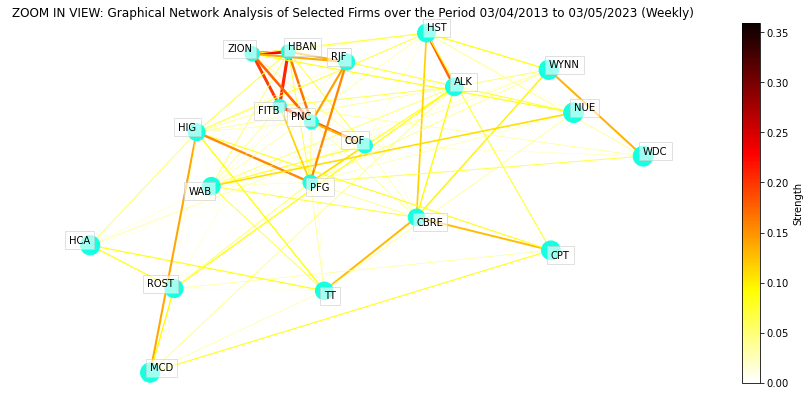

In [66]:
# Cluster 4
firms_list = ['ALK', 'CBRE', 'COF', 'CPT', 'FITB', 'HBAN', 'HCA', 'HIG', 'HST', 'MCD', 'NUE', 'PFG', 'PNC', 'RJF', 'ROST', 'TT', 'WAB', 'WDC', 'WYNN', 'ZION']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['AKAM', 'ANSS', 'CDNS', 'COST', 'CSGP', 'GOOGL', 'IDXX', 'KLAC', 'MSCI', 'SNPS', 'TMO']


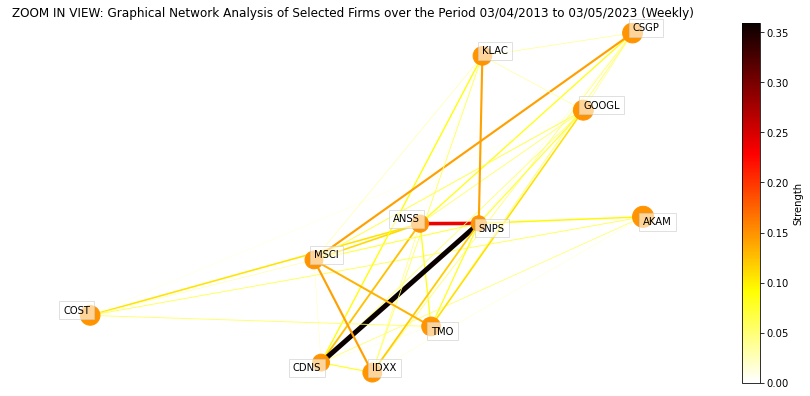

In [67]:
# Cluster 5
firms_list = ['AKAM', 'ANSS', 'CDNS', 'COST', 'CSGP', 'GOOGL', 'IDXX', 'KLAC', 'MSCI', 'SNPS', 'TMO']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [68]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 2
sortDataBySharpeRatio(data[['CHD','HRL']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['CHD', 'HRL']

In [69]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 4
sortDataBySharpeRatio(data[['ALK', 'CBRE', 'COF', 'CPT', 'FITB', 'HBAN', 'HCA', 'HIG', 'HST', 'MCD', 'NUE', 'PFG', 'PNC', 'RJF', 'ROST', 'TT', 'WAB', 'WDC', 'WYNN', 'ZION']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['TT',
 'MCD',
 'HCA',
 'NUE',
 'RJF',
 'HIG',
 'ROST',
 'PFG',
 'PNC',
 'CBRE',
 'CPT',
 'HBAN',
 'FITB',
 'ZION',
 'COF',
 'WAB',
 'ALK',
 'HST',
 'WYNN',
 'WDC']

In [70]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 5
sortDataBySharpeRatio(data[['DHI','FAST','MAS','MHK']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['DHI', 'MAS', 'FAST', 'MHK']

In [71]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 6
sortDataBySharpeRatio(data[['AZO','ORLY']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['ORLY', 'AZO']

In [72]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 7
sortDataBySharpeRatio(data[['AKAM', 'ANSS', 'CDNS', 'COST', 'CSGP', 'GOOGL', 'IDXX', 'KLAC', 'MSCI', 'SNPS', 'TMO']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['MSCI',
 'CDNS',
 'SNPS',
 'TMO',
 'COST',
 'IDXX',
 'KLAC',
 'CSGP',
 'GOOGL',
 'ANSS',
 'AKAM']

In [73]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 8
sortDataBySharpeRatio(data[['OXY','TRGP']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['TRGP', 'OXY']

In [74]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 9
sortDataBySharpeRatio(data[['CAH','LH','UNH']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['UNH', 'LH', 'CAH']

# Portafolio 7.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 7,22.1,16.93,-0.43,9.45,0.03,0.05,1.24,-25.71


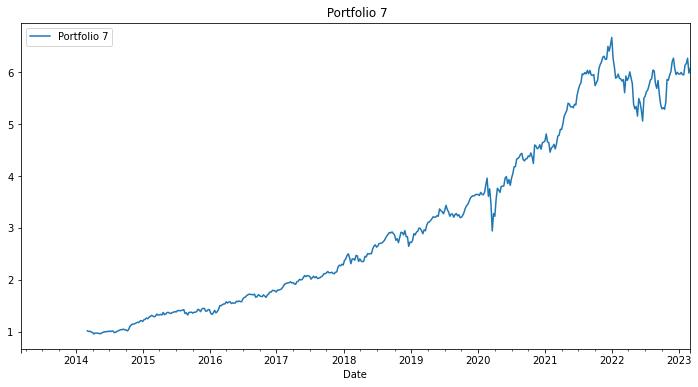

In [75]:
# vector de retornos esperados
er_p7 = annualize_rets(data[['CBOE','CHD','DPZ','TT','DHI','ORLY','MSCI','TRGP','UNH']], 52)
# matriz de covarianza
cov_p7 = data[['CBOE','CHD','DPZ','TT','DHI','ORLY','MSCI','TRGP','UNH']].cov()

weight_p7 = lambda x: weight_msr(er=er_p7, cov=cov_p7, rf=TBill['T-Bill'])
p7 = backtest_ws(data[['CBOE','CHD','DPZ','TT','DHI','ORLY','MSCI','TRGP','UNH']], estimation_window=52, weighting=weight_p7)
btr = pd.DataFrame({"Portfolio 7": p7})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 7")
summary_stats(btr.dropna())

In [76]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p7, cov=cov_p7, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio7 = pd.Series((weights_str), index = data[['CBOE','CHD','DPZ','TT','DHI','ORLY','MSCI','TRGP','UNH']].columns)
Portfolio7

CBOE    12.28
CHD     15.00
DPZ     15.00
TT      12.72
DHI      0.00
ORLY    15.00
MSCI    15.00
TRGP     0.00
UNH     15.00
dtype: object

# Portafolio 8.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 8,18.66,15.25,-0.26,10.12,0.03,0.05,1.15,-25.22


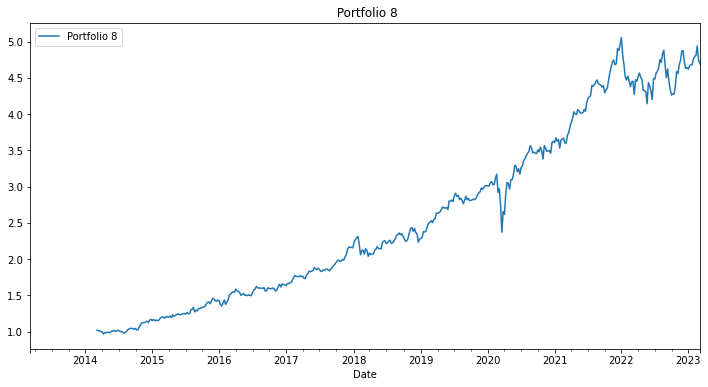

In [77]:
# vector de retornos esperados
er_p8 = annualize_rets(data[['CBOE','HRL','DPZ','MCD','MAS','AZO','CDNS','OXY','LH']], 52)
# matriz de covarianza
cov_p8 = data[['CBOE','HRL','DPZ','MCD','MAS','AZO','CDNS','OXY','LH']].cov()

weight_p8 = lambda x: weight_msr(er=er_p8, cov=cov_p8, rf=TBill['T-Bill'])
p8 = backtest_ws(data[['CBOE','HRL','DPZ','MCD','MAS','AZO','CDNS','OXY','LH']], estimation_window=52, weighting=weight_p8)
btr = pd.DataFrame({"Portfolio 8": p8})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 8")
summary_stats(btr.dropna())

In [78]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p8, cov=cov_p8, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio8 = pd.Series((weights_str), index = data[['CBOE','HRL','DPZ','MCD','MAS','AZO','CDNS','OXY','LH']].columns)
Portfolio8

CBOE    15.00
HRL     15.00
DPZ     15.00
MCD     15.00
MAS      6.73
AZO     15.00
CDNS    15.00
OXY      0.00
LH       3.27
dtype: object

# Portafolio 9.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 9,19.88,16.83,-0.41,8.56,0.03,0.05,1.12,-28.79


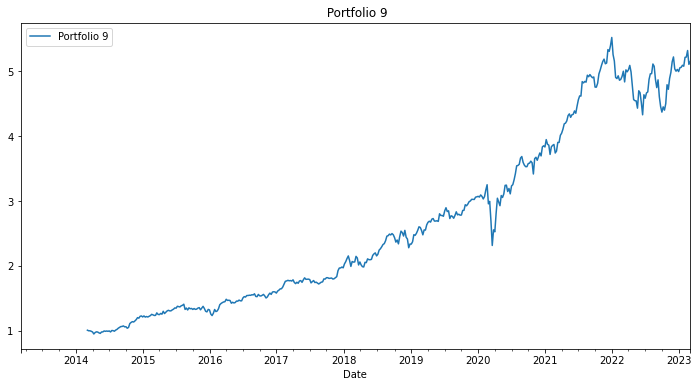

In [79]:
# vector de retornos esperados
er_p9 = annualize_rets(data[['CBOE','CHD','DPZ','HCA','FAST','ORLY','SNPS','TRGP','CAH']], 52)
# matriz de covarianza
cov_p9 = data[['CBOE','CHD','DPZ','HCA','FAST','ORLY','SNPS','TRGP','CAH']].cov()

weight_p9 = lambda x: weight_msr(er=er_p9, cov=cov_p9, rf=TBill['T-Bill'])
p9 = backtest_ws(data[['CBOE','CHD','DPZ','HCA','FAST','ORLY','SNPS','TRGP','CAH']], estimation_window=52, weighting=weight_p9)
btr = pd.DataFrame({"Portfolio 9": p9})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 9")
summary_stats(btr.dropna())

In [80]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p9, cov=cov_p9, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio9 = pd.Series((weights_str), index = data[['CBOE','CHD','DPZ','HCA','FAST','ORLY','SNPS','TRGP','CAH']].columns)
Portfolio9

CBOE    15.00
CHD     15.00
DPZ     15.00
HCA     15.00
FAST     8.60
ORLY    15.00
SNPS    15.00
TRGP     0.00
CAH      1.40
dtype: object

In [81]:
data_m3 = data

# Submuestra Aleatoria 4.-
------------

A continuación se muestra la información resumida de la cuarta submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [94]:
# SUBMUESTREO ALEATORIO 4
# Seleccionar una muestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker')

In [95]:
# Submuestra 4
Submuestra4 = firms_info 
Submuestra4

,Name,Sector
Ticker,,
ABT,Abbott,Health Care
ADM,ADM,Consumer Staples
ADBE,Adobe Inc.,Information Technology
ADP,ADP,Information Technology
AES,AES Corporation,Utilities
ADI,Analog Devices,Information Technology
AZO,AutoZone,Consumer Discretionary
BALL,Ball Corporation,Materials
BAC,Bank of America,Financials


In [96]:
# Sectores de la submuestra 4
Sectors = firms_info.Sector.unique()
print(Sectors)

['Health Care' 'Consumer Staples' 'Information Technology' 'Utilities'
 'Consumer Discretionary' 'Materials' 'Financials'
 'Communication Services' 'Industrials' 'Real Estate']


In [97]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed


In [98]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
HWM
KHC
NWS
QRVO

Number of firms examined: 46
Cluster 1: ADBE, ADI, CSGP, EPAM, ILMN, KLAC, MTD, ZBRA
Cluster 2: BAC, NTRS, RL, WFC
Cluster 3: BIIB
Cluster 4: BMY
Cluster 5: AES, CNP, NRG, WELL
Cluster 6: CAG, CL, MKC
Cluster 7: MTCH
Cluster 8: ABT, ADM, ADP, AZO, BALL, BR, BWA, CHTR, DXC, JBHT, JNPR, LEN, LH, LIN, MAS, MGM, NKE, PH, TROW, TXT, UHS, WHR
Cluster 9: TSLA
Cluster 10: TSN


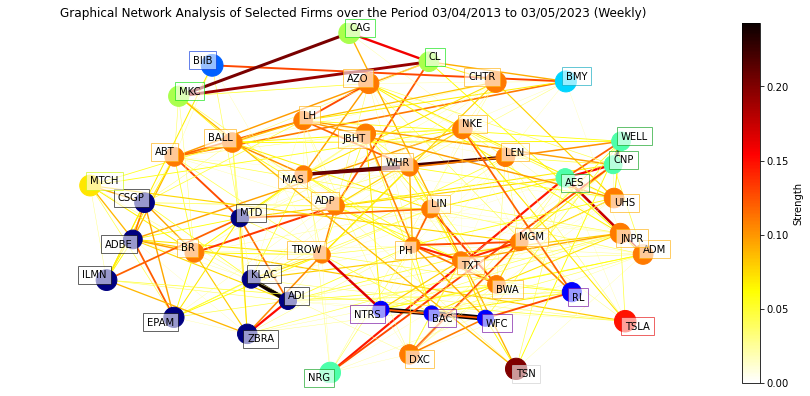

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


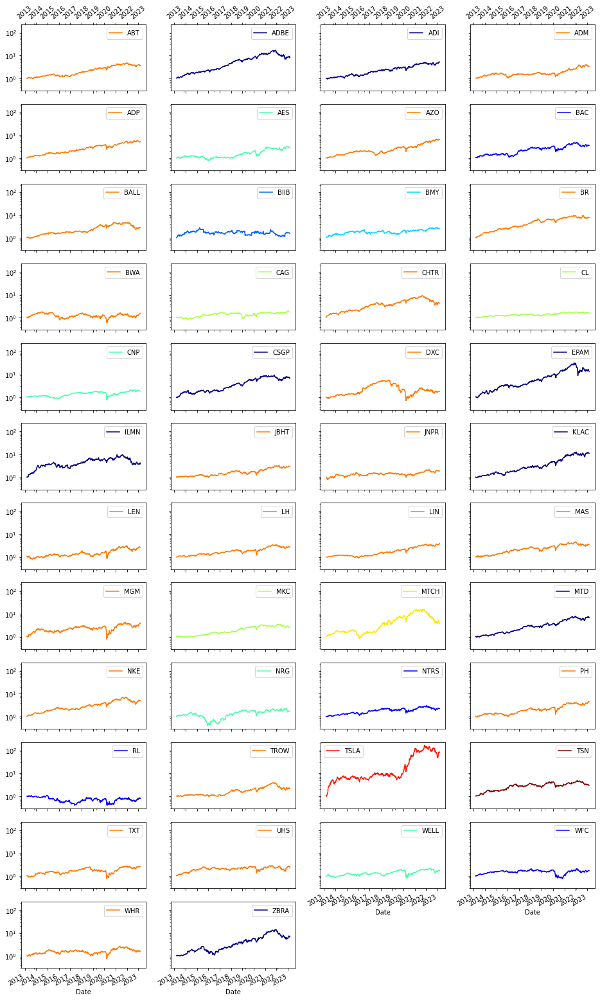

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
ABT,NaN,268.03,0.30,13.86,22.65,0.57,-31.32
ADBE,NaN,750.32,0.49,23.77,28.55,0.80,-60.02
ADI,NaN,416.25,0.38,17.76,26.39,0.64,-30.32
ADM,NaN,230.95,0.29,12.66,24.67,0.47,-39.57
ADP,NaN,417.06,0.37,17.78,22.61,0.74,-37.79
AES,NaN,182.97,0.28,10.92,29.62,0.34,-43.29
AZO,NaN,556.06,0.42,20.61,25.52,0.77,-41.06
BAC,NaN,254.30,0.33,13.43,30.25,0.41,-44.00
BALL,NaN,183.90,0.27,10.95,26.14,0.38,-50.75
BIIB,NaN,59.02,0.25,4.73,41.05,0.09,-59.32


In [99]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 4:
- **Cluster 1:** ADBE, ADI, CSGP, EPAM, ILMN, KLAC, MTD, ZBRA
- **Cluster 2:** BAC, NTRS, RL, WFC
- **Cluster 3:** BIIB
- **Cluster 4:** BMY
- **Cluster 5:** AES, CNP, NRG, WELL
- **Cluster 6:** CAG, CL, MKC
- **Cluster 7:** MTCH
- **Cluster 8:** ABT, ADM, ADP, AZO, BALL, BR, BWA, CHTR, DXC, JBHT, JNPR, LEN, LH, LIN, MAS, MGM, NKE, PH, TROW, TXT, UHS, WHR
- **Cluster 9:** TSLA
- **Cluster 10:** TSN
    
Podemos enfocarnos en los clusters 1 y 8, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['ADBE', 'ADI', 'CSGP', 'EPAM', 'ILMN', 'KLAC', 'MTD', 'ZBRA']


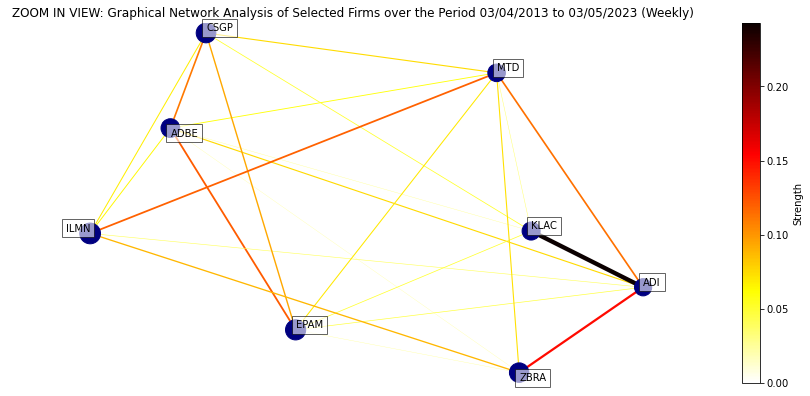

In [100]:
# Cluster 1
firms_list = ['ADBE', 'ADI', 'CSGP', 'EPAM', 'ILMN', 'KLAC', 'MTD', 'ZBRA']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['ABT', 'ADM', 'ADP', 'AZO', 'BALL', 'BR', 'BWA', 'CHTR', 'DXC', 'JBHT', 'JNPR', 'LEN', 'LH', 'LIN', 'MAS', 'MGM', 'NKE', 'PH', 'TROW', 'TXT', 'UHS', 'WHR']


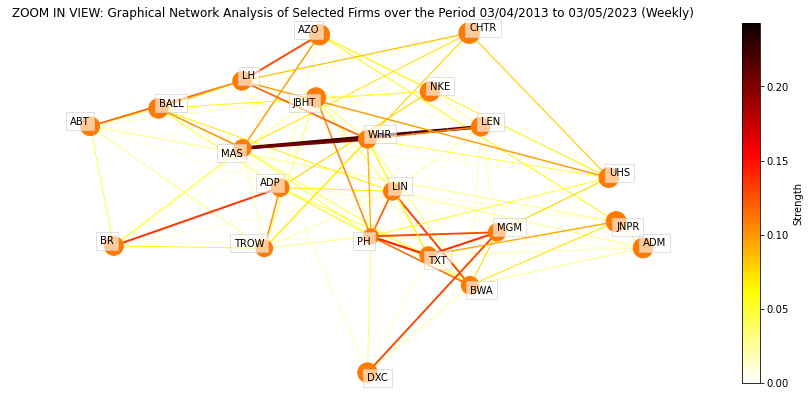

In [101]:
# Cluster 8
firms_list = ['ABT', 'ADM', 'ADP', 'AZO', 'BALL', 'BR', 'BWA', 'CHTR', 'DXC', 'JBHT', 'JNPR', 'LEN', 'LH', 'LIN', 'MAS', 'MGM', 'NKE', 'PH', 'TROW', 'TXT', 'UHS', 'WHR']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [102]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 1
sortDataBySharpeRatio(data[['ADBE', 'ADI', 'CSGP', 'EPAM', 'ILMN', 'KLAC', 'MTD', 'ZBRA']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['MTD', 'ADBE', 'KLAC', 'EPAM', 'CSGP', 'ADI', 'ZBRA', 'ILMN']

In [103]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 2
sortDataBySharpeRatio(data[['BAC', 'NTRS', 'RL', 'WFC']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['BAC', 'NTRS', 'WFC', 'RL']

In [104]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 5
sortDataBySharpeRatio(data[['AES', 'CNP', 'NRG', 'WELL']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['AES', 'CNP', 'WELL', 'NRG']

In [105]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 6
sortDataBySharpeRatio(data[['CAG', 'CL', 'MKC']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['MKC', 'CL', 'CAG']

In [106]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 8
sortDataBySharpeRatio(data[['ABT', 'ADM', 'ADP', 'AZO', 'BALL', 'BR', 'BWA', 'CHTR', 'DXC', 'JBHT', 'JNPR', 'LEN', 'LH', 'LIN', 'MAS', 'MGM', 'NKE', 'PH', 'TROW', 'TXT', 'UHS', 'WHR']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['BR',
 'AZO',
 'ADP',
 'LIN',
 'NKE',
 'ABT',
 'PH',
 'CHTR',
 'ADM',
 'MAS',
 'JBHT',
 'BALL',
 'LH',
 'MGM',
 'TXT',
 'TROW',
 'LEN',
 'UHS',
 'JNPR',
 'DXC',
 'BWA',
 'WHR']

# Portafolio 10.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 10,16.42,19.26,-0.13,6.93,0.04,0.06,0.8,-31.42


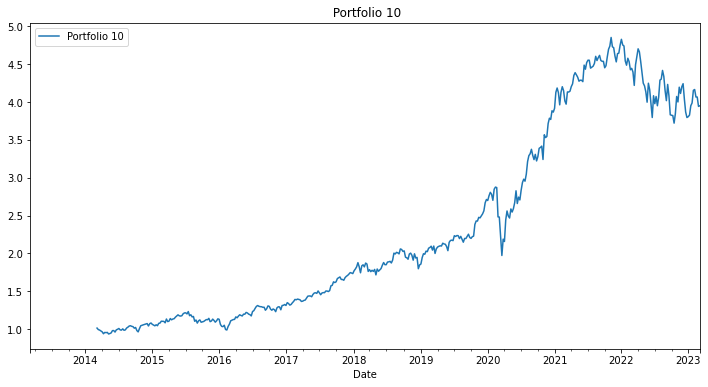

In [107]:
# vector de retornos esperados
er_p10 = annualize_rets(data[['MTD','BAC','BIIB','BMY','AES','MKC','MTCH','BR','TSLA','TSN']], 52)
# matriz de covarianza
cov_p10 = data[['MTD','BAC','BIIB','BMY','AES','MKC','MTCH','BR','TSLA','TSN']].cov()

weight_p10 = lambda x: weight_msr(er=er_p10, cov=cov_p10, rf=TBill['T-Bill'])
p10 = backtest_ws(data[['MTD','BAC','BIIB','BMY','AES','MKC','MTCH','BR','TSLA','TSN']], estimation_window=52, weighting=weight_p10)
btr = pd.DataFrame({"Portfolio 10": p10})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 10")
summary_stats(btr.dropna())

In [108]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p10, cov=cov_p10, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio10 = pd.Series((weights_str), index = data[['MTD','BAC','BIIB','BMY','AES','MKC','MTCH','BR','TSLA','TSN']].columns)
Portfolio10

MTD     10.00
BAC     10.00
BIIB    10.00
BMY     10.00
AES     10.00
MKC     10.00
MTCH    10.00
BR      10.00
TSLA    10.00
TSN     10.00
dtype: object

# Portafolio 11.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 11,14.71,19.06,-0.0,8.77,0.04,0.06,0.72,-32.24


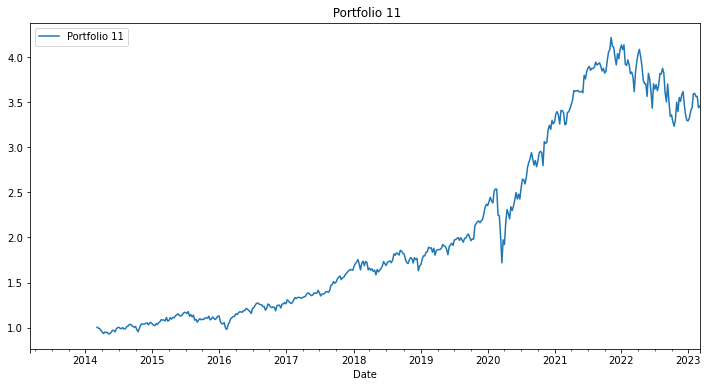

In [109]:
# vector de retornos esperados
er_p11 = annualize_rets(data[['ADBE','NTRS','BIIB','BMY','CNP','CL','MTCH','AZO','TSLA','TSN']], 52)
# matriz de covarianza
cov_p11 = data[['ADBE','NTRS','BIIB','BMY','CNP','CL','MTCH','AZO','TSLA','TSN']].cov()

weight_p11 = lambda x: weight_msr(er=er_p11, cov=cov_p11, rf=TBill['T-Bill'])
p11 = backtest_ws(data[['ADBE','NTRS','BIIB','BMY','CNP','CL','MTCH','AZO','TSLA','TSN']], estimation_window=52, weighting=weight_p11)
btr = pd.DataFrame({"Portfolio 11": p11})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 11")
summary_stats(btr.dropna())

In [110]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p11, cov=cov_p11, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio11 = pd.Series((weights_str), index = data[['ADBE','NTRS','BIIB','BMY','CNP','CL','MTCH','AZO','TSLA','TSN']].columns)
Portfolio11

ADBE    10.00
NTRS    10.00
BIIB    10.00
BMY     10.00
CNP     10.00
CL      10.00
MTCH    10.00
AZO     10.00
TSLA    10.00
TSN     10.00
dtype: object

# Portafolio 12.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 12,15.88,20.06,0.13,9.93,0.04,0.06,0.74,-35.07


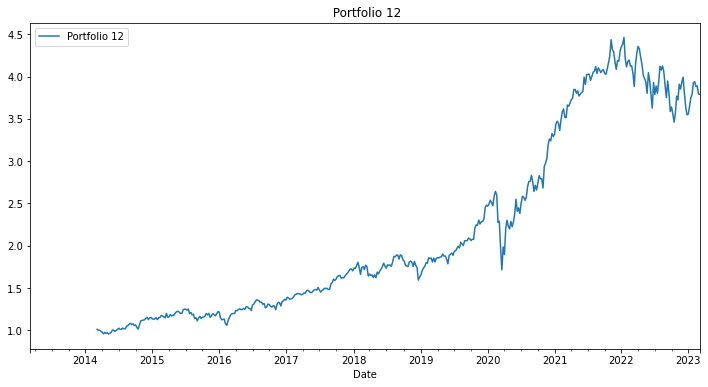

In [111]:
# vector de retornos esperados
er_p12 = annualize_rets(data[['KLAC','WFC','BIIB','BMY','WELL','CAG','MTCH','ADP','TSLA','TSN']], 52)
# matriz de covarianza
cov_p12 = data[['KLAC','WFC','BIIB','BMY','WELL','CAG','MTCH','ADP','TSLA','TSN']].cov()

weight_p12 = lambda x: weight_msr(er=er_p12, cov=cov_p12, rf=TBill['T-Bill'])
p12 = backtest_ws(data[['KLAC','WFC','BIIB','BMY','WELL','CAG','MTCH','ADP','TSLA','TSN']], estimation_window=52, weighting=weight_p12)
btr = pd.DataFrame({"Portfolio 12": p12})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 12")
summary_stats(btr.dropna())

In [112]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p12, cov=cov_p12, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio12 = pd.Series((weights_str), index = data[['KLAC','WFC','BIIB','BMY','WELL','CAG','MTCH','ADP','TSLA','TSN']].columns)
Portfolio12

KLAC    10.00
WFC     10.00
BIIB    10.00
BMY     10.00
WELL    10.00
CAG     10.00
MTCH    10.00
ADP     10.00
TSLA    10.00
TSN     10.00
dtype: object

In [113]:
data_m4 = data

# Submuestra Aleatoria 5.-
------------

A continuación se muestra la información resumida de la quinta submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [124]:
# SUBMUESTREO ALEATORIO 5
# Seleccionar una muestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker')

In [125]:
# Submuestra 5
Submuestra5 = firms_info 
Submuestra5

,Name,Sector
Ticker,,
ABBV,AbbVie,Health Care
A,Agilent Technologies,Health Care
ALB,Albemarle Corporation,Materials
ALGN,Align Technology,Health Care
GOOGL,Alphabet Inc. (Class A),Communication Services
AMCR,Amcor,Materials
AMD,AMD,Information Technology
WRB,Berkley,Financials
BRK.B,Berkshire Hathaway,Financials


In [126]:
# Sectores de la submuestra 5
Sectors = firms_info.Sector.unique()
print(Sectors)

['Health Care' 'Materials' 'Communication Services'
 'Information Technology' 'Financials' 'Real Estate' 'Consumer Staples'
 'Industrials' 'Consumer Discretionary' 'Utilities' 'Energy']


In [127]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed

2 Failed downloads:
- BF.B: No data found for this date range, symbol may be delisted
- BRK.B: No data found, symbol may be delisted


In [128]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
BF.B
BRK.B
CDAY
CZR
OGN

Number of firms examined: 45
Cluster 1: A, ILMN, INTU, MCK, MNST, NOW, TMO
Cluster 2: ABBV, HUM
Cluster 3: AMCR, CB, RE, WRB
Cluster 4: CHRW
Cluster 5: DOV, EMR, GPC, JCI, LHX, POOL, PWR, TRGP, VMC
Cluster 6: HRL, K, KMB
Cluster 7: BXP, MAA, PEG
Cluster 8: ALB, ALGN, AMD, BSX, CBRE, GM, GOOGL, HPQ, MDT, MGM, NWL, ODFL, PARA, TEL, UAL, ULTA


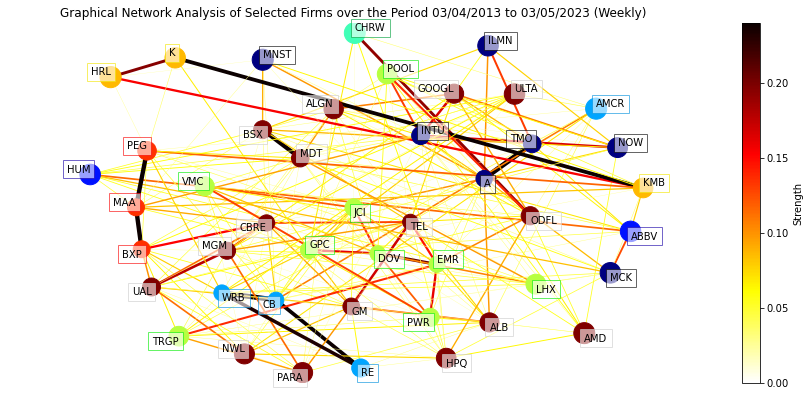

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


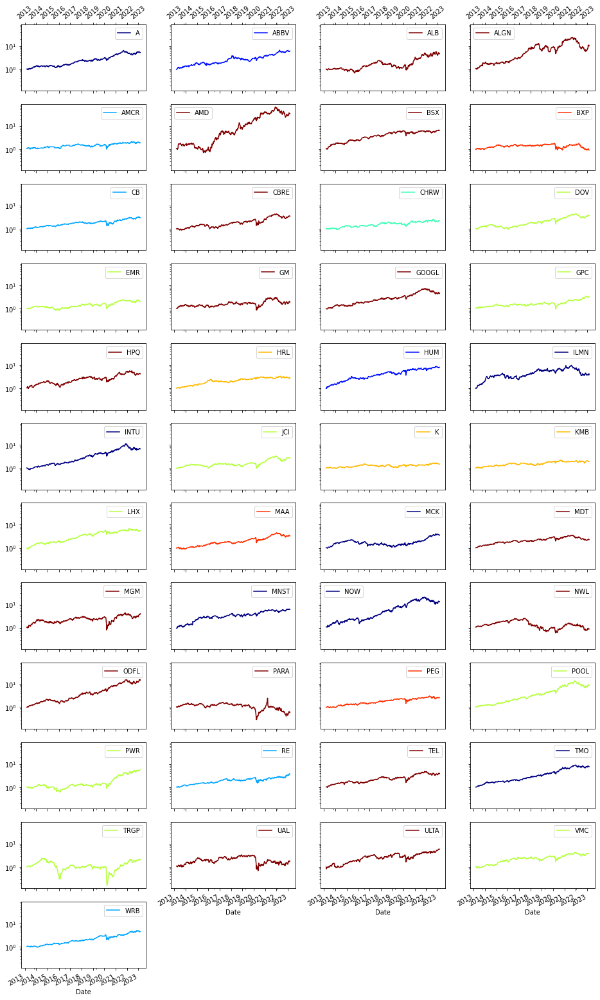

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
A,NaN,422.74,0.37,17.91,23.40,0.72,-36.87
ABBV,NaN,513.01,0.42,19.80,27.90,0.67,-43.83
ALB,NaN,372.70,0.45,16.73,40.53,0.39,-60.95
ALGN,NaN,979.57,0.66,26.74,46.62,0.55,-75.05
AMCR,NaN,83.93,0.17,6.26,23.71,0.23,-40.50
AMD,Information Technology,3296.67,0.98,42.08,56.96,0.72,-64.00
BSX,NaN,549.73,0.43,20.49,26.46,0.74,-40.35
BXP,NaN,-9.69,0.06,-1.01,28.34,-0.07,-49.47
CB,NaN,199.32,0.26,11.54,21.95,0.48,-39.08
CBRE,NaN,249.55,0.33,13.28,30.65,0.40,-46.49


In [129]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 5:
- **Cluster 1:** A, ILMN, INTU, MCK, MNST, NOW, TMO
- **Cluster 2:** ABBV, HUM
- **Cluster 3:** AMCR, CB, RE, WRB
- **Cluster 4:** CHRW
- **Cluster 5:** DOV, EMR, GPC, JCI, LHX, POOL, PWR, TRGP, VMC
- **Cluster 6:** HRL, K, KMB
- **Cluster 7:** BXP, MAA, PEG
- **Cluster 8:** ALB, ALGN, AMD, BSX, CBRE, GM, GOOGL, HPQ, MDT, MGM, NWL, ODFL, PARA, TEL, UAL, ULTA
    
Podemos enfocarnos en los clusters 1, 5 y 8, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['A', 'ILMN', 'INTU', 'MCK', 'MNST', 'NOW', 'TMO']


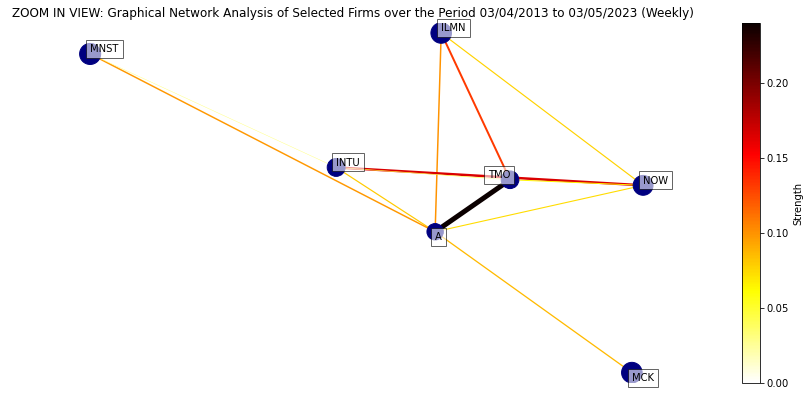

In [130]:
# Cluster 1
firms_list = ['A', 'ILMN', 'INTU', 'MCK', 'MNST', 'NOW', 'TMO']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['DOV', 'EMR', 'GPC', 'JCI', 'LHX', 'POOL', 'PWR', 'TRGP', 'VMC']


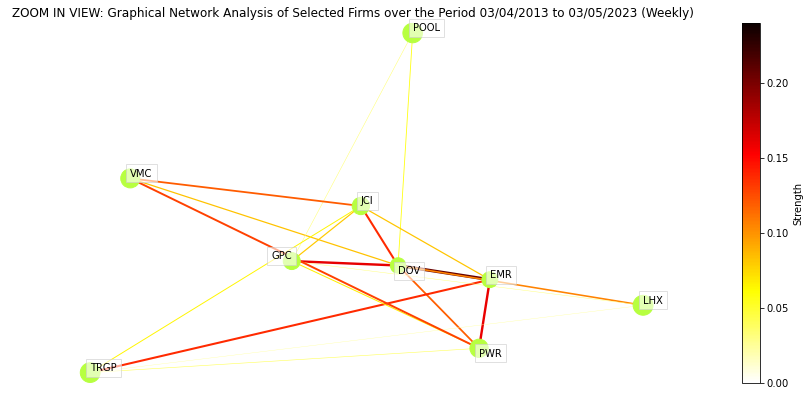

In [131]:
# Cluster 5
firms_list = ['DOV', 'EMR', 'GPC', 'JCI', 'LHX', 'POOL', 'PWR', 'TRGP', 'VMC']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['ALB', 'ALGN', 'AMD', 'BSX', 'CBRE', 'GM', 'GOOGL', 'HPQ', 'MDT', 'MGM', 'NWL', 'ODFL', 'PARA', 'TEL', 'UAL', 'ULTA']


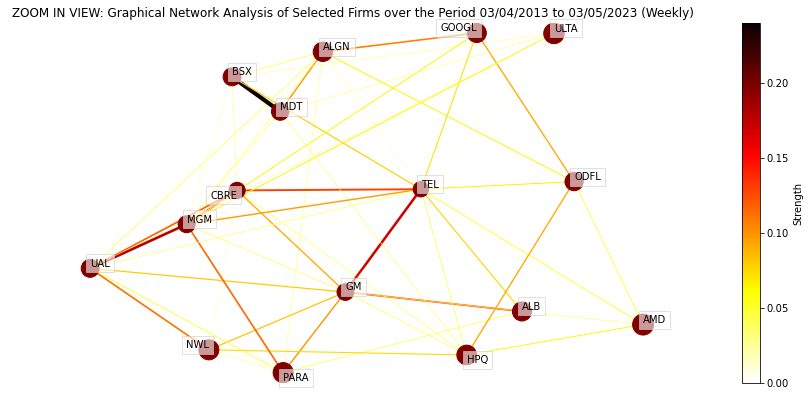

In [132]:
# Cluster 8
firms_list = ['ALB', 'ALGN', 'AMD', 'BSX', 'CBRE', 'GM', 'GOOGL', 'HPQ', 'MDT', 'MGM', 'NWL', 'ODFL', 'PARA', 'TEL', 'UAL', 'ULTA']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [133]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 1
sortDataBySharpeRatio(data[['A', 'ILMN', 'INTU', 'MCK', 'MNST', 'NOW', 'TMO']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['TMO', 'NOW', 'A', 'INTU', 'MNST', 'MCK', 'ILMN']

In [134]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 2
sortDataBySharpeRatio(data[['ABBV', 'HUM']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['HUM', 'ABBV']

In [135]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 3
sortDataBySharpeRatio(data[['AMCR', 'CB', 'RE', 'WRB']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['WRB', 'RE', 'CB', 'AMCR']

In [136]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 5
sortDataBySharpeRatio(data[['DOV', 'EMR', 'GPC', 'JCI', 'LHX', 'POOL', 'PWR', 'TRGP', 'VMC']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['POOL', 'LHX', 'PWR', 'DOV', 'VMC', 'GPC', 'JCI', 'EMR', 'TRGP']

In [137]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 6
sortDataBySharpeRatio(data[['HRL', 'K', 'KMB']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['HRL', 'KMB', 'K']

In [138]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 7
sortDataBySharpeRatio(data[['BXP', 'MAA', 'PEG']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['MAA', 'PEG', 'BXP']

In [139]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 8
sortDataBySharpeRatio(data[['ALB', 'ALGN', 'AMD', 'BSX', 'CBRE', 'GM', 'GOOGL', 'HPQ', 'MDT', 'MGM', 'NWL', 'ODFL', 'PARA', 'TEL', 'UAL', 'ULTA']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['ODFL',
 'BSX',
 'AMD',
 'GOOGL',
 'ALGN',
 'TEL',
 'ULTA',
 'HPQ',
 'CBRE',
 'ALB',
 'MDT',
 'MGM',
 'GM',
 'UAL',
 'NWL',
 'PARA']

# Portafolio 13.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 13,20.86,16.74,-0.28,7.54,0.03,0.05,1.18,-25.77


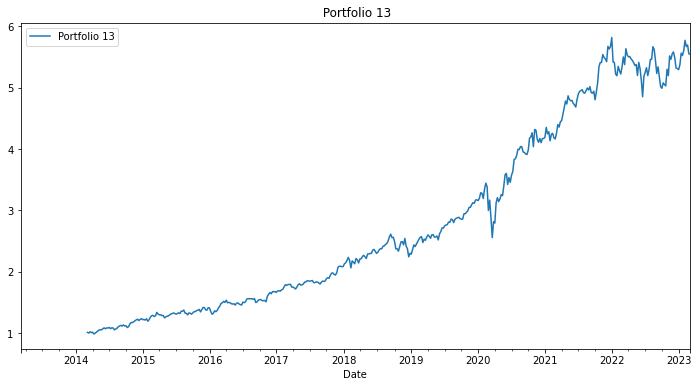

In [140]:
# vector de retornos esperados
er_p13 = annualize_rets(data[['TMO','HUM','WRB','CHRW','POOL','HRL','MAA','ODFL']], 52)
# matriz de covarianza
cov_p13 = data[['TMO','HUM','WRB','CHRW','POOL','HRL','MAA','ODFL']].cov()

weight_p13 = lambda x: weight_msr(er=er_p13, cov=cov_p13, rf=TBill['T-Bill'])
p13 = backtest_ws(data[['TMO','HUM','WRB','CHRW','POOL','HRL','MAA','ODFL']], estimation_window=52, weighting=weight_p13)
btr = pd.DataFrame({"Portfolio 13": p13})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 13")
summary_stats(btr.dropna())

In [141]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p13, cov=cov_p13, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio13 = pd.Series((weights_str), index = data[['TMO','HUM','WRB','CHRW','POOL','HRL','MAA','ODFL']].columns)
Portfolio13

TMO     15.00
HUM     15.00
WRB     15.00
CHRW     5.50
POOL    15.00
HRL     15.00
MAA      4.50
ODFL    15.00
dtype: object

# Portafolio 14.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 14,17.34,17.29,-0.29,7.11,0.04,0.05,0.94,-28.39


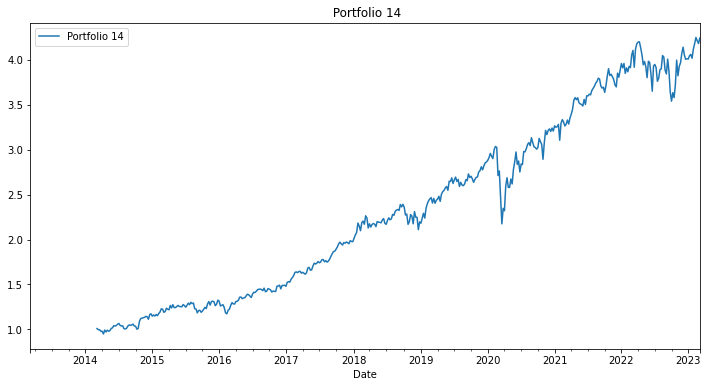

In [143]:
# vector de retornos esperados
er_p14 = annualize_rets(data[['NOW','ABBV','RE','CHRW','LHX','KMB','PEG','BSX']], 52)
# matriz de covarianza
cov_p14 = data[['NOW','ABBV','RE','CHRW','LHX','KMB','PEG','BSX']].cov()

weight_p14 = lambda x: weight_msr(er=er_p14, cov=cov_p14, rf=TBill['T-Bill'])
p14 = backtest_ws(data[['NOW','ABBV','RE','CHRW','LHX','KMB','PEG','BSX']], estimation_window=52, weighting=weight_p14)
btr = pd.DataFrame({"Portfolio 14": p14})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 14")
summary_stats(btr.dropna())

In [144]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p14, cov=cov_p14, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio14 = pd.Series((weights_str), index = data[['NOW','ABBV','RE','CHRW','LHX','KMB','PEG','BSX']].columns)
Portfolio14

NOW     15.00
ABBV    15.00
RE      15.00
CHRW     9.95
LHX     15.00
KMB      7.82
PEG      7.23
BSX     15.00
dtype: object

# Portafolio 15.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 15,21.2,19.7,-0.34,5.92,0.04,0.06,1.02,-28.32


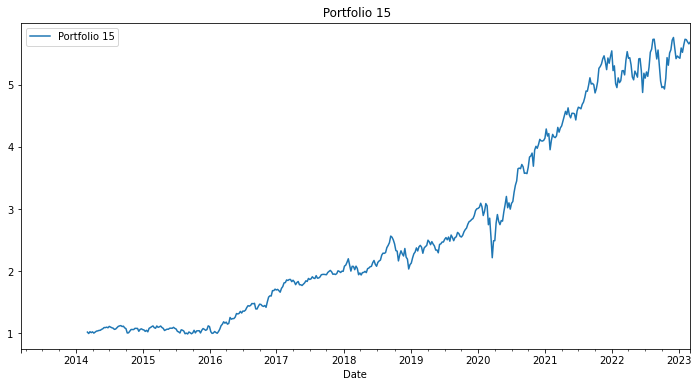

In [145]:
# vector de retornos esperados
er_p15 = annualize_rets(data[['A','HUM','CB','CHRW','PWR','K','BXP','AMD']], 52)
# matriz de covarianza
cov_p15 = data[['A','HUM','CB','CHRW','PWR','K','BXP','AMD']].cov()

weight_p15 = lambda x: weight_msr(er=er_p15, cov=cov_p15, rf=TBill['T-Bill'])
p15 = backtest_ws(data[['A','HUM','CB','CHRW','PWR','K','BXP','AMD']], estimation_window=52, weighting=weight_p15)
btr = pd.DataFrame({"Portfolio 15": p15})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 15")
summary_stats(btr.dropna())

In [146]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p15, cov=cov_p15, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio15 = pd.Series((weights_str), index = data[['A','HUM','CB','CHRW','PWR','K','BXP','AMD']].columns)
Portfolio15

A       15.00
HUM     15.00
CB      15.00
CHRW    12.44
PWR     14.82
K       12.73
BXP      0.00
AMD     15.00
dtype: object

In [147]:
data_m5 = data

# Submuestra Aleatoria 6.-
------------

A continuación se muestra la información resumida de la sexta submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [148]:
# SUBMUESTREO ALEATORIO 6
# Seleccionar una muestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker')

In [149]:
# Submuestra 6
Submuestra6 = firms_info 
Submuestra6

,Name,Sector
Ticker,,
ABBV,AbbVie,Health Care
ACN,Accenture,Information Technology
AMZN,Amazon,Consumer Discretionary
AXP,American Express,Financials
AIG,American International Group,Financials
APH,Amphenol,Information Technology
APA,APA Corporation,Energy
ACGL,Arch Capital Group,Financials
ADSK,Autodesk,Information Technology


In [150]:
# Sectores de la submuestra 6
Sectors = firms_info.Sector.unique()
print(Sectors)

['Health Care' 'Information Technology' 'Consumer Discretionary'
 'Financials' 'Energy' 'Real Estate' 'Utilities' 'Consumer Staples'
 'Industrials' 'Communication Services' 'Materials']


In [151]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed


In [152]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
CDAY
ETSY
FOXA
HWM
KHC
QRVO

Number of firms examined: 44
Cluster 1: AMZN, CRL, DHR, EQIX, HOLX, PODD, ROP
Cluster 2: BXP, CNP, EQR
Cluster 3: GEN
Cluster 4: GILD
Cluster 5: CAG, HRL
Cluster 6: INCY, VRTX
Cluster 7: KR
Cluster 8: ACGL, ACN, ADSK, AIG, APA, APH, AXP, FDX, HII, IBM, IFF, ITW, LDOS, MCHP, MU, PH, PHM, PKG, PPG, RJF, SYY, VFC
Cluster 9: ABBV, JKHY, LH, MCK, UNH


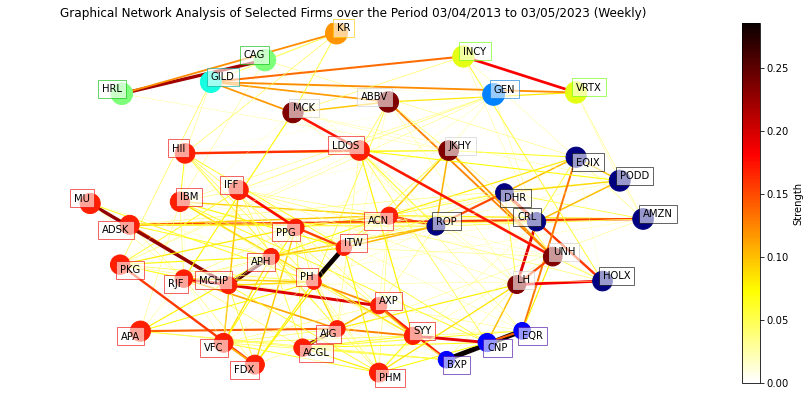

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


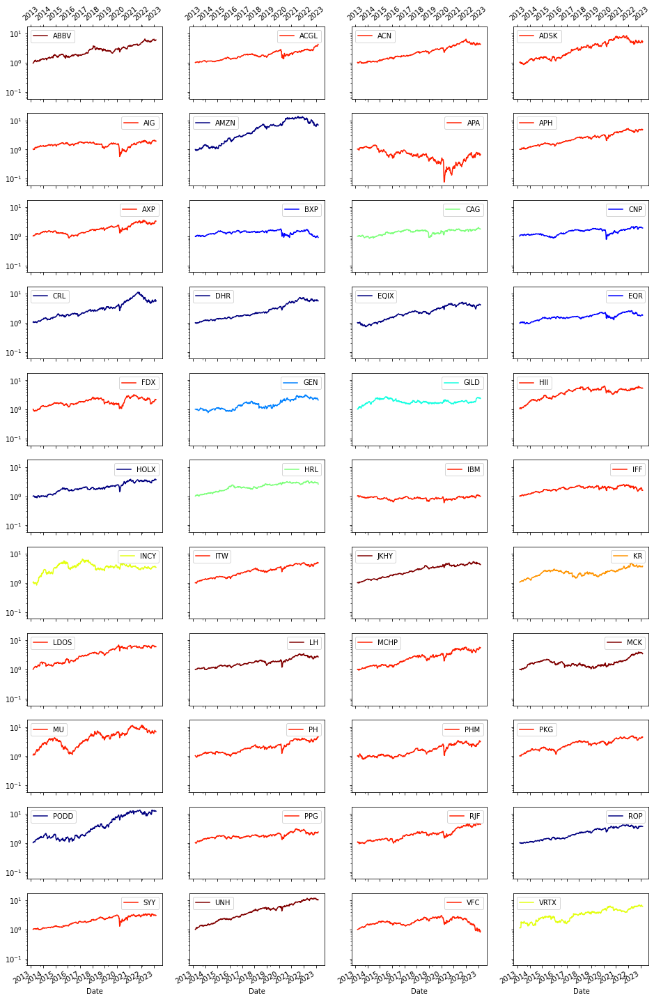

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
ABBV,NaN,513.01,0.42,19.80,27.90,0.67,-43.83
ACGL,NaN,333.00,0.35,15.72,26.87,0.55,-51.80
ACN,NaN,331.29,0.33,15.67,22.97,0.64,-38.21
ADSK,NaN,436.77,0.44,18.22,35.15,0.49,-49.83
AIG,NaN,95.19,0.23,6.89,32.63,0.18,-68.67
AMZN,NaN,594.96,0.46,21.30,30.77,0.66,-54.83
APA,Energy,-32.24,0.26,-3.80,57.32,-0.08,-94.60
APH,NaN,383.65,0.35,17.00,23.22,0.69,-37.29
AXP,NaN,228.71,0.32,12.59,30.38,0.38,-45.53
BXP,NaN,-9.69,0.06,-1.01,28.34,-0.07,-49.47


In [153]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 6:   
- **Cluster 1:** AMZN, CRL, DHR, EQIX, HOLX, PODD, ROP
- **Cluster 2:** BXP, CNP, EQR
- **Cluster 3:** GEN
- **Cluster 4:** GILD
- **Cluster 5:** CAG, HRL
- **Cluster 6:** INCY, VRTX
- **Cluster 7:** KR
- **Cluster 8:** ACGL, ACN, ADSK, AIG, APA, APH, AXP, FDX, HII, IBM, IFF, ITW, LDOS, MCHP, MU, PH, PHM, PKG, PPG, RJF, SYY, VFC
- **Cluster 9:** ABBV, JKHY, LH, MCK, UNH

Podemos enfocarnos en los clusters 1, 8 y 9, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['AMZN', 'CRL', 'DHR', 'EQIX', 'HOLX', 'PODD', 'ROP']


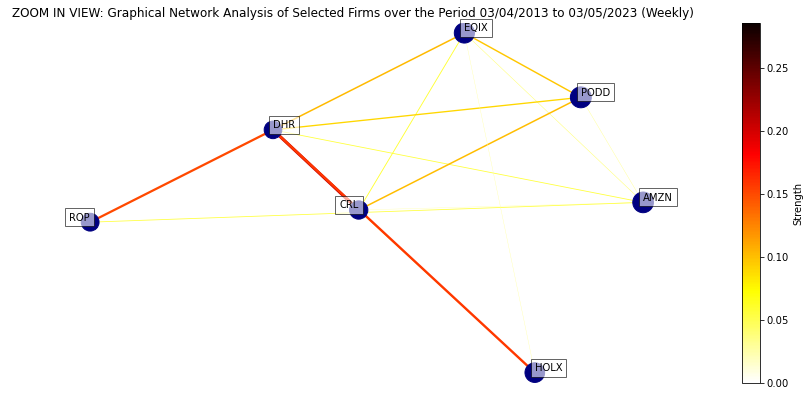

In [154]:
# Cluster 1
firms_list = ['AMZN', 'CRL', 'DHR', 'EQIX', 'HOLX', 'PODD', 'ROP']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['ACGL', 'ACN', 'ADSK', 'AIG', 'APA', 'APH', 'AXP', 'FDX', 'HII', 'IBM', 'IFF', 'ITW', 'LDOS', 'MCHP', 'MU', 'PH', 'PHM', 'PKG', 'PPG', 'RJF', 'SYY', 'VFC']


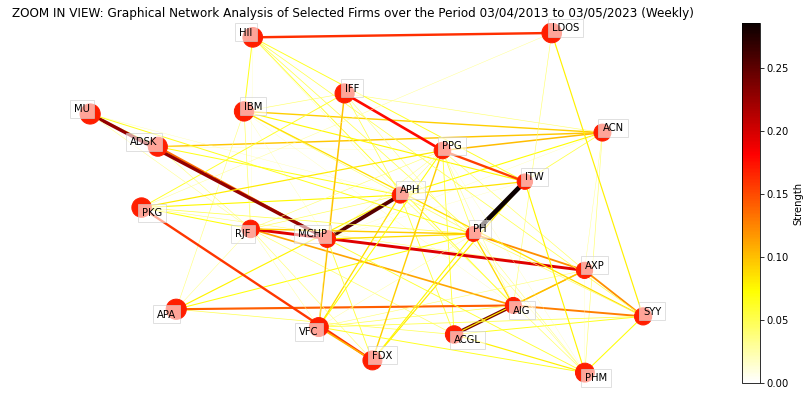

In [155]:
# Cluster 8
firms_list = ['ACGL', 'ACN', 'ADSK', 'AIG', 'APA', 'APH', 'AXP', 'FDX', 'HII', 'IBM', 'IFF', 'ITW', 'LDOS', 'MCHP', 'MU', 'PH', 'PHM', 'PKG', 'PPG', 'RJF', 'SYY', 'VFC']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['ABBV', 'JKHY', 'LH', 'MCK', 'UNH']


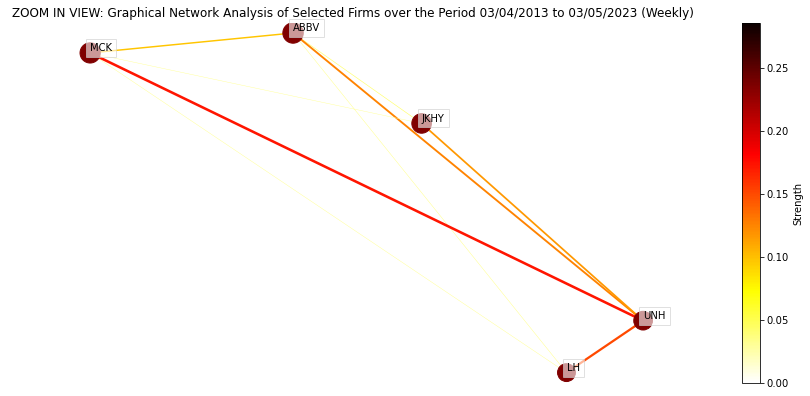

In [156]:
# Cluster 9
firms_list = ['ABBV', 'JKHY', 'LH', 'MCK', 'UNH']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [157]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 1
sortDataBySharpeRatio(data[['AMZN', 'CRL', 'DHR', 'EQIX', 'HOLX', 'PODD', 'ROP']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['DHR', 'AMZN', 'PODD', 'ROP', 'CRL', 'EQIX', 'HOLX']

In [158]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 2
sortDataBySharpeRatio(data[['BXP', 'CNP', 'EQR']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['CNP', 'EQR', 'BXP']

In [159]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 5
sortDataBySharpeRatio(data[['CAG', 'HRL']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['HRL', 'CAG']

In [160]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 6
sortDataBySharpeRatio(data[['INCY', 'VRTX']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['VRTX', 'INCY']

In [161]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 8
sortDataBySharpeRatio(data[['ACGL', 'ACN', 'ADSK', 'AIG', 'APA', 'APH', 'AXP', 'FDX', 'HII', 'IBM', 'IFF', 'ITW', 'LDOS', 'MCHP', 'MU', 'PH', 'PHM', 'PKG', 'PPG', 'RJF', 'SYY', 'VFC']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['ITW',
 'APH',
 'LDOS',
 'ACN',
 'HII',
 'PKG',
 'ACGL',
 'MCHP',
 'PH',
 'RJF',
 'ADSK',
 'MU',
 'AXP',
 'SYY',
 'PPG',
 'PHM',
 'FDX',
 'AIG',
 'IFF',
 'IBM',
 'VFC',
 'APA']

In [162]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 9
sortDataBySharpeRatio(data[['ABBV', 'JKHY', 'LH', 'MCK', 'UNH']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['UNH', 'JKHY', 'ABBV', 'MCK', 'LH']

# Portafolio 16.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 16,16.87,15.72,-0.24,4.74,0.03,0.05,1.0,-16.53


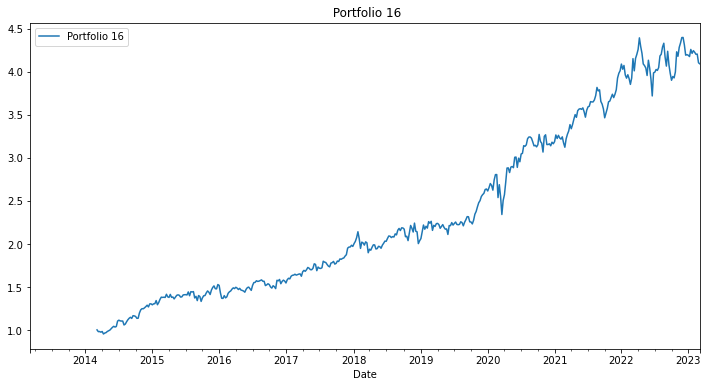

In [163]:
# vector de retornos esperados
er_p16 = annualize_rets(data[['DHR','CNP','GEN','GILD','HRL','VRTX','KR','ITW','UNH']], 52)
# matriz de covarianza
cov_p16 = data[['DHR','CNP','GEN','GILD','HRL','VRTX','KR','ITW','UNH']].cov()

weight_p16 = lambda x: weight_msr(er=er_p16, cov=cov_p16, rf=TBill['T-Bill'])
p16 = backtest_ws(data[['DHR','CNP','GEN','GILD','HRL','VRTX','KR','ITW','UNH']], estimation_window=52, weighting=weight_p16)
btr = pd.DataFrame({"Portfolio 16": p16})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 16")
summary_stats(btr.dropna())

In [164]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p16, cov=cov_p16, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio16 = pd.Series((weights_str), index = data[['DHR','CNP','GEN','GILD','HRL','VRTX','KR','ITW','UNH']].columns)
Portfolio16

DHR     15.00
CNP      1.59
GEN      4.49
GILD     5.01
HRL     15.00
VRTX    13.90
KR      15.00
ITW     15.00
UNH     15.00
dtype: object

# Portafolio 17.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 17,14.04,15.75,-0.47,4.62,0.04,0.05,0.82,-18.72


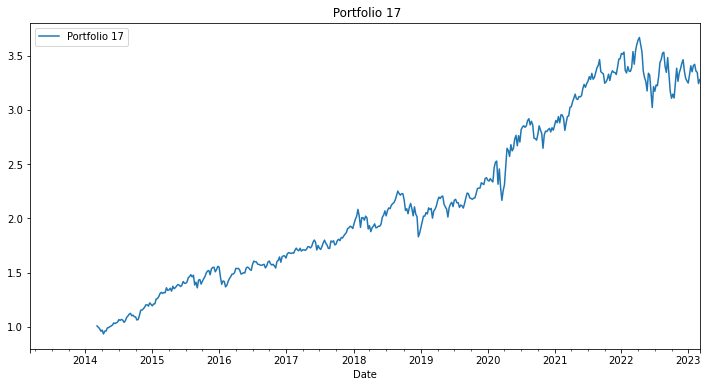

In [165]:
# vector de retornos esperados
er_p17 = annualize_rets(data[['AMZN','EQR','GEN','GILD','CAG','INCY','KR','APH','JKHY']], 52)
# matriz de covarianza
cov_p17 = data[['AMZN','EQR','GEN','GILD','CAG','INCY','KR','APH','JKHY']].cov()

weight_p17 = lambda x: weight_msr(er=er_p17, cov=cov_p17, rf=TBill['T-Bill'])
p17 = backtest_ws(data[['AMZN','EQR','GEN','GILD','CAG','INCY','KR','APH','JKHY']], estimation_window=52, weighting=weight_p17)
btr = pd.DataFrame({"Portfolio 17": p17})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 17")
summary_stats(btr.dropna())

In [166]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p17, cov=cov_p17, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio17 = pd.Series((weights_str), index = data[['AMZN','EQR','GEN','GILD','CAG','INCY','KR','APH','JKHY']].columns)
Portfolio17

AMZN    15.00
EQR      8.92
GEN      5.39
GILD    13.52
CAG      6.77
INCY     5.40
KR      15.00
APH     15.00
JKHY    15.00
dtype: object

# Portafolio 18.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 18,17.9,18.08,0.01,3.99,0.04,0.05,0.93,-18.03


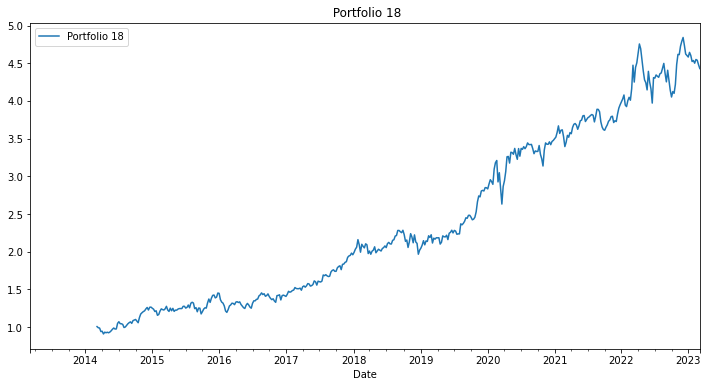

In [167]:
# vector de retornos esperados
er_p18 = annualize_rets(data[['PODD','BXP','GEN','GILD','HRL','VRTX','KR','LDOS','ABBV']], 52)
# matriz de covarianza
cov_p18 = data[['PODD','BXP','GEN','GILD','HRL','VRTX','KR','LDOS','ABBV']].cov()

weight_p18 = lambda x: weight_msr(er=er_p18, cov=cov_p18, rf=TBill['T-Bill'])
p18 = backtest_ws(data[['PODD','BXP','GEN','GILD','HRL','VRTX','KR','LDOS','ABBV']], estimation_window=52, weighting=weight_p18)
btr = pd.DataFrame({"Portfolio 18": p18})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 18")
summary_stats(btr.dropna())

In [168]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p18, cov=cov_p18, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio18 = pd.Series((weights_str), index = data[['PODD','BXP','GEN','GILD','HRL','VRTX','KR','LDOS','ABBV']].columns)
Portfolio18

PODD    15.00
BXP      0.00
GEN      6.25
GILD     3.75
HRL     15.00
VRTX    15.00
KR      15.00
LDOS    15.00
ABBV    15.00
dtype: object

In [169]:
data_m6 = data

# Submuestra Aleatoria 7.-
------------

A continuación se muestra la información resumida de la séptima submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [180]:
# SUBMUESTREO ALEATORIO 7
# Seleccionar una muestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker')

In [181]:
# Submuestra 7
Submuestra7 = firms_info 
Submuestra7

,Name,Sector
Ticker,,
ADM,ADM,Consumer Staples
AES,AES Corporation,Utilities
AFL,Aflac,Financials
ARE,Alexandria Real Estate Equities,Real Estate
AEP,American Electric Power,Utilities
AMGN,Amgen,Health Care
AAPL,Apple Inc.,Information Technology
T,AT&T,Communication Services
BA,Boeing,Industrials


In [182]:
# Sectores de la submuestra 7
Sectors = firms_info.Sector.unique()
print(Sectors)

['Consumer Staples' 'Utilities' 'Financials' 'Real Estate' 'Health Care'
 'Information Technology' 'Communication Services' 'Industrials'
 'Consumer Discretionary' 'Energy' 'Materials']


In [183]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed


In [184]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
CARR
NWS
OGN

Number of firms examined: 47
Cluster 1: ADM, AES, AFL, BA, DRI, HAS, HII, L, LMT, PNC, UAL
Cluster 2: AMGN, BMY
Cluster 3: DXCM, PODD
Cluster 4: FANG, OXY, PSX
Cluster 5: GEN
Cluster 6: LVS, WYNN
Cluster 7: BWA, CPRT, CRL, CSX, FMC, GPC, JNPR, KMX, MS, PH, PTC, RL, SYK
Cluster 8: AEP, ARE, PPL, REG, T, VTR
Cluster 9: AAPL, JKHY, MTD, ROL, ROP
Cluster 10: TMUS
Cluster 11: TSLA


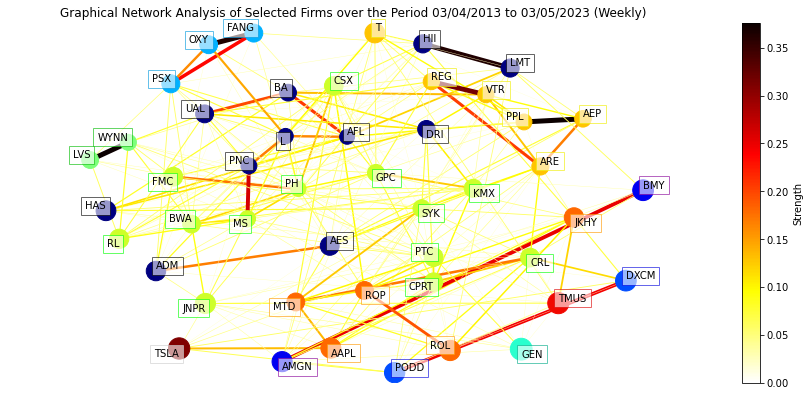

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


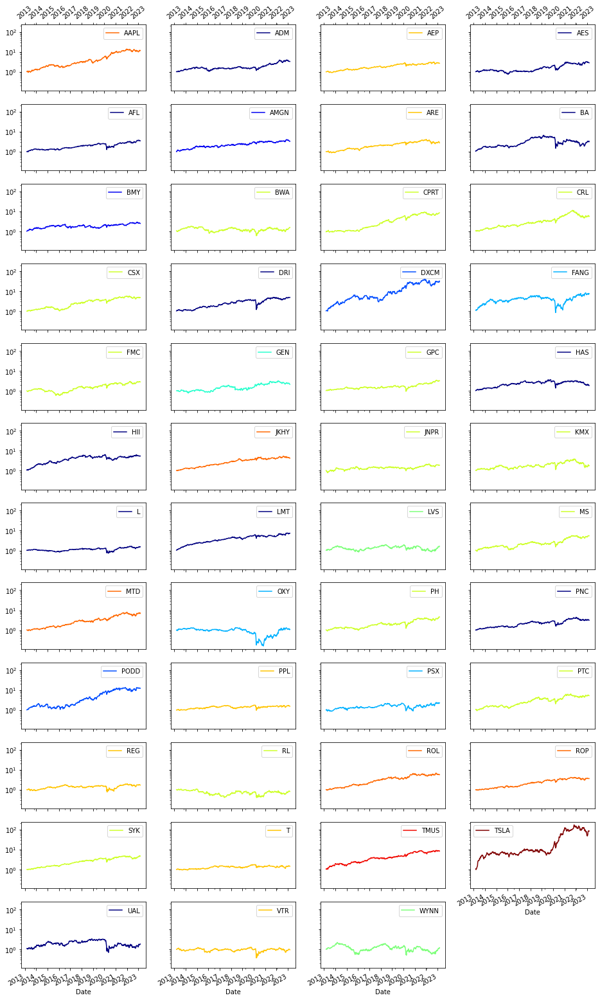

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
AAPL,NaN,1065.65,0.54,27.72,27.53,0.97,-34.64
ADM,NaN,230.95,0.29,12.66,24.67,0.47,-39.57
AEP,NaN,167.94,0.23,10.32,21.08,0.45,-31.14
AES,NaN,182.97,0.28,10.92,29.62,0.34,-43.29
AFL,NaN,247.24,0.30,13.20,25.35,0.48,-52.28
AMGN,NaN,229.12,0.28,12.60,24.23,0.48,-22.54
ARE,NaN,173.00,0.24,10.52,23.26,0.41,-40.56
BA,NaN,230.86,0.42,12.66,45.47,0.26,-77.92
BMY,NaN,149.86,0.23,9.55,23.88,0.36,-37.89
BWA,NaN,56.60,0.20,4.57,33.71,0.11,-66.80


In [185]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 7:
- **Cluster 1:** ADM, AES, AFL, BA, DRI, HAS, HII, L, LMT, PNC, UAL
- **Cluster 2:** AMGN, BMY
- **Cluster 3:** DXCM, PODD
- **Cluster 4:** FANG, OXY, PSX
- **Cluster 5:** GEN
- **Cluster 6:** LVS, WYNN
- **Cluster 7:** BWA, CPRT, CRL, CSX, FMC, GPC, JNPR, KMX, MS, PH, PTC, RL, SYK
- **Cluster 8:** AEP, ARE, PPL, REG, T, VTR
- **Cluster 9:** AAPL, JKHY, MTD, ROL, ROP
- **Cluster 10:** TMUS
- **Cluster 11:** TSLA
    
Podemos enfocarnos en los clusters 1, 7, 8 y 9, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['ADM', 'AES', 'AFL', 'BA', 'DRI', 'HAS', 'HII', 'L', 'LMT', 'PNC', 'UAL']


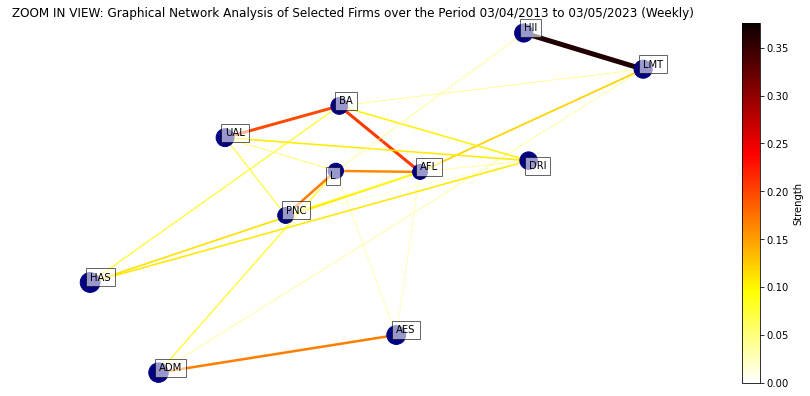

In [186]:
# Cluster 1
firms_list = ['ADM', 'AES', 'AFL', 'BA', 'DRI', 'HAS', 'HII', 'L', 'LMT', 'PNC', 'UAL']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['BWA', 'CPRT', 'CRL', 'CSX', 'FMC', 'GPC', 'JNPR', 'KMX', 'MS', 'PH', 'PTC', 'RL', 'SYK']


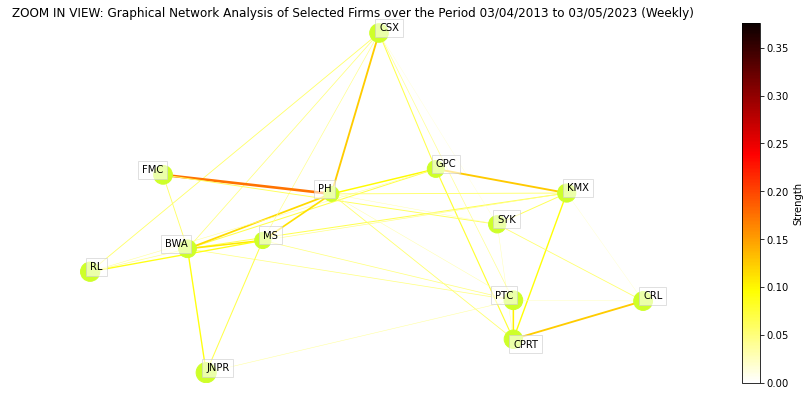

In [187]:
# Cluster 7
firms_list = ['BWA', 'CPRT', 'CRL', 'CSX', 'FMC', 'GPC', 'JNPR', 'KMX', 'MS', 'PH', 'PTC', 'RL', 'SYK']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['AEP', 'ARE', 'PPL', 'REG', 'T', 'VTR']


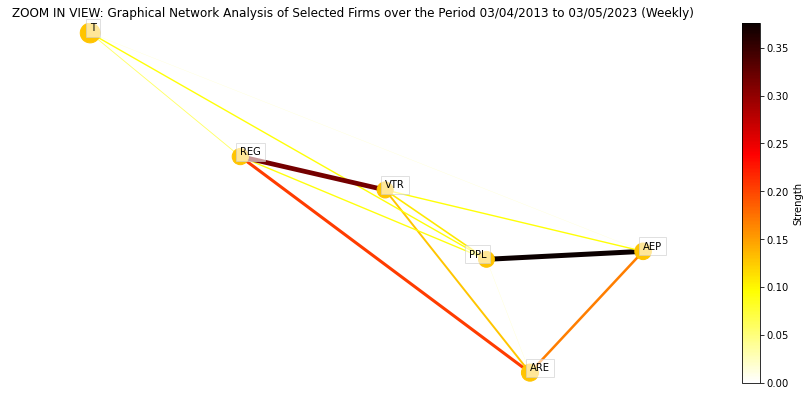

In [188]:
# Cluster 8
firms_list = ['AEP', 'ARE', 'PPL', 'REG', 'T', 'VTR']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['AAPL', 'JKHY', 'MTD', 'ROL', 'ROP']


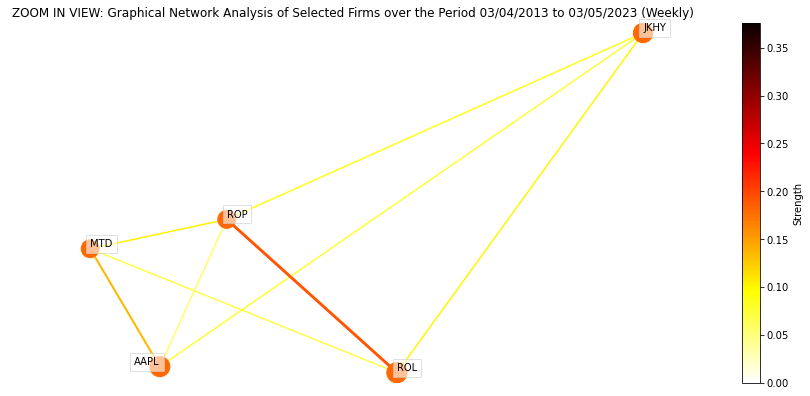

In [189]:
# Cluster 9
firms_list = ['AAPL', 'JKHY', 'MTD', 'ROL', 'ROP']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [190]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 1
sortDataBySharpeRatio(data[['ADM', 'AES', 'AFL', 'BA', 'DRI', 'HAS', 'HII', 'L', 'LMT', 'PNC', 'UAL']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['LMT', 'HII', 'AFL', 'ADM', 'DRI', 'PNC', 'AES', 'BA', 'HAS', 'L', 'UAL']

In [191]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 2
sortDataBySharpeRatio(data[['AMGN', 'BMY']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['AMGN', 'BMY']

In [192]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 3
sortDataBySharpeRatio(data[['DXCM', 'PODD']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['DXCM', 'PODD']

In [193]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 4
sortDataBySharpeRatio(data[['FANG', 'OXY', 'PSX']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['FANG', 'PSX', 'OXY']

In [194]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 6
sortDataBySharpeRatio(data[['LVS', 'WYNN']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['LVS', 'WYNN']

In [195]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 7
sortDataBySharpeRatio(data[['BWA', 'CPRT', 'CRL', 'CSX', 'FMC', 'GPC', 'JNPR', 'KMX', 'MS', 'PH', 'PTC', 'RL', 'SYK']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['CPRT',
 'SYK',
 'CSX',
 'MS',
 'CRL',
 'PTC',
 'PH',
 'GPC',
 'FMC',
 'JNPR',
 'KMX',
 'BWA',
 'RL']

In [196]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 8
sortDataBySharpeRatio(data[['AEP', 'ARE', 'PPL', 'REG', 'T', 'VTR']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['AEP', 'ARE', 'REG', 'PPL', 'T', 'VTR']

In [197]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 9
sortDataBySharpeRatio(data[['AAPL', 'JKHY', 'MTD', 'ROL', 'ROP']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['AAPL', 'MTD', 'ROL', 'JKHY', 'ROP']

# Portafolio 19.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 19,27.71,21.44,-0.17,8.01,0.04,0.06,1.24,-34.04


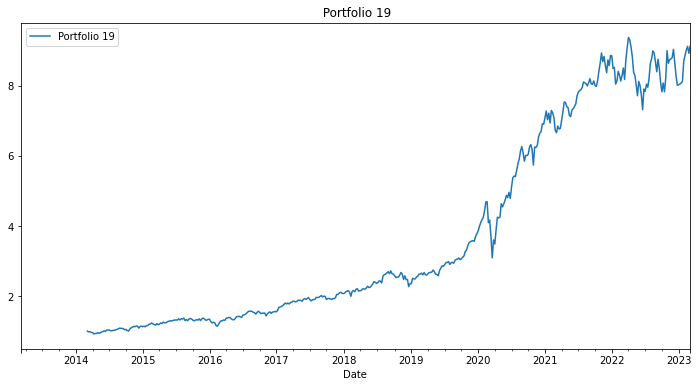

In [198]:
# vector de retornos esperados
er_p19 = annualize_rets(data[['LMT','AMGN','DXCM','FANG','GEN','LVS','CPRT','AEP','AAPL','TMUS','TSLA']], 52)
# matriz de covarianza
cov_p19 = data[['LMT','AMGN','DXCM','FANG','GEN','LVS','CPRT','AEP','AAPL','TMUS','TSLA']].cov()

weight_p19 = lambda x: weight_msr(er=er_p19, cov=cov_p19, rf=TBill['T-Bill'])
p19 = backtest_ws(data[['LMT','AMGN','DXCM','FANG','GEN','LVS','CPRT','AEP','AAPL','TMUS','TSLA']], estimation_window=52, weighting=weight_p19)
btr = pd.DataFrame({"Portfolio 19": p19})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 19")
summary_stats(btr.dropna())

In [199]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p19, cov=cov_p19, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio19 = pd.Series((weights_str), index = data[['LMT','AMGN','DXCM','FANG','GEN','LVS','CPRT','AEP','AAPL','TMUS','TSLA']].columns)
Portfolio19

LMT     15.00
AMGN     2.79
DXCM    13.20
FANG     2.33
GEN      0.00
LVS      0.00
CPRT    15.00
AEP      7.77
AAPL    15.00
TMUS    15.00
TSLA    13.91
dtype: object

# Portafolio 20.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 20,23.01,21.7,-0.04,5.95,0.04,0.06,1.01,-32.37


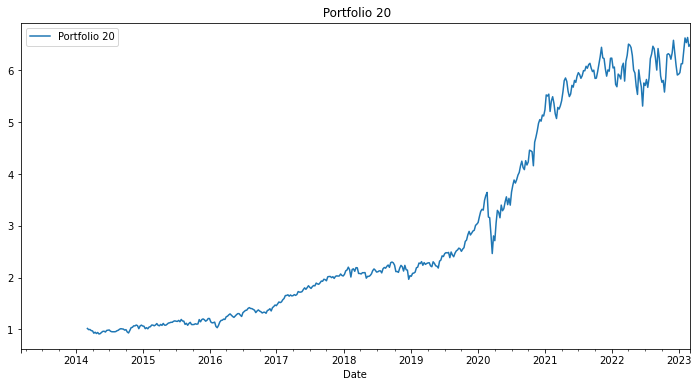

In [200]:
# vector de retornos esperados
er_p20 = annualize_rets(data[['HII','BMY','PODD','PSX','GEN','WYNN','SYK','ARE','MTD','TMUS','TSLA']], 52)
# matriz de covarianza
cov_p20 = data[['HII','BMY','PODD','PSX','GEN','WYNN','SYK','ARE','MTD','TMUS','TSLA']].cov()

weight_p20 = lambda x: weight_msr(er=er_p20, cov=cov_p20, rf=TBill['T-Bill'])
p20 = backtest_ws(data[['HII','BMY','PODD','PSX','GEN','WYNN','SYK','ARE','MTD','TMUS','TSLA']], estimation_window=52, weighting=weight_p20)
btr = pd.DataFrame({"Portfolio 20": p20})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 20")
summary_stats(btr.dropna())

In [201]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p20, cov=cov_p20, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio20 = pd.Series((weights_str), index = data[['HII','BMY','PODD','PSX','GEN','WYNN','SYK','ARE','MTD','TMUS','TSLA']].columns)
Portfolio20

HII     15.00
BMY     10.00
PODD    15.00
PSX      0.00
GEN      0.00
WYNN     0.00
SYK     15.00
ARE      0.00
MTD     15.00
TMUS    15.00
TSLA    15.00
dtype: object

# Portafolio 21.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 21,24.58,21.75,-0.02,6.04,0.04,0.06,1.08,-31.34


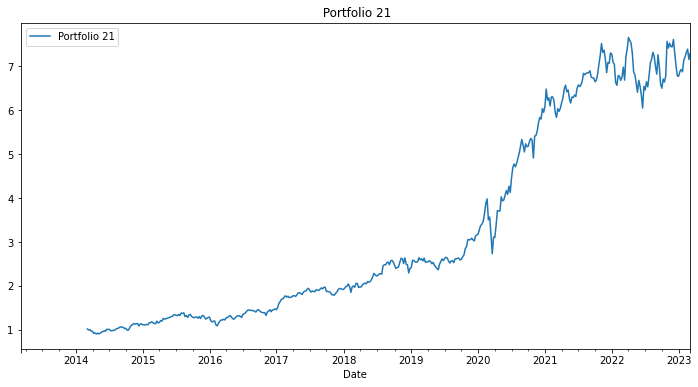

In [202]:
# vector de retornos esperados
er_p21 = annualize_rets(data[['AFL','AMGN','DXCM','OXY','GEN','LVS','CSX','REG','ROL','TMUS','TSLA']], 52)
# matriz de covarianza
cov_p21 = data[['AFL','AMGN','DXCM','OXY','GEN','LVS','CSX','REG','ROL','TMUS','TSLA']].cov()

weight_p21 = lambda x: weight_msr(er=er_p21, cov=cov_p21, rf=TBill['T-Bill'])
p21 = backtest_ws(data[['AFL','AMGN','DXCM','OXY','GEN','LVS','CSX','REG','ROL','TMUS','TSLA']], estimation_window=52, weighting=weight_p21)
btr = pd.DataFrame({"Portfolio 21": p21})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 21")
summary_stats(btr.dropna())

In [203]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p21, cov=cov_p21, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio21 = pd.Series((weights_str), index = data[['AFL','AMGN','DXCM','OXY','GEN','LVS','CSX','REG','ROL','TMUS','TSLA']].columns)
Portfolio21

AFL     10.00
AMGN    15.00
DXCM    15.00
OXY      0.00
GEN      0.00
LVS      0.00
CSX     15.00
REG      0.00
ROL     15.00
TMUS    15.00
TSLA    15.00
dtype: object

In [204]:
data_m7 = data

# Submuestra Aleatoria 8.-
------------

A continuación se muestra la información resumida de la octava submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [205]:
# SUBMUESTREO ALEATORIO 8
# Seleccionar una muestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker')

In [206]:
# Submuestra 8
Submuestra8 = firms_info 
Submuestra8

,Name,Sector
Ticker,,
GOOGL,Alphabet Inc. (Class A),Communication Services
AEP,American Electric Power,Utilities
AAPL,Apple Inc.,Information Technology
BA,Boeing,Industrials
CBRE,CBRE Group,Real Estate
COO,CooperCompanies,Health Care
EA,Electronic Arts,Communication Services
LLY,Eli Lilly and Company,Health Care
XOM,ExxonMobil,Energy


In [207]:
# Sectores de la submuestra 8
Sectors = firms_info.Sector.unique()
print(Sectors)

['Communication Services' 'Utilities' 'Information Technology'
 'Industrials' 'Real Estate' 'Health Care' 'Energy' 'Materials'
 'Consumer Staples' 'Financials' 'Consumer Discretionary']


In [208]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed


In [209]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
FTV
IQV
KEYS
KHC
WRK

Number of firms examined: 45
Cluster 1: EA
Cluster 2: FTNT
Cluster 3: HRL
Cluster 4: ILMN
Cluster 5: KDP
Cluster 6: LLY, PFE
Cluster 7: AAPL, COO, GOOGL, HCA, LH, LIN, MMC, MNST, NVR, SBUX, UNH, WTW
Cluster 8: MTCH
Cluster 9: AEP, NI, PNW, SO, VZ, WELL
Cluster 10: BA, CBRE, FDX, FLT, FMC, LYB, MLM, NSC, PNC, PRU, PSX, RJF, SPG, TRMB, UAL, URI, VFC, XOM, ZBH


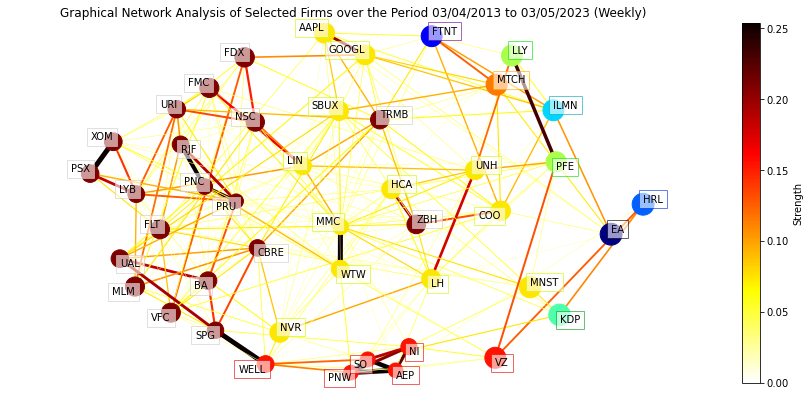

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


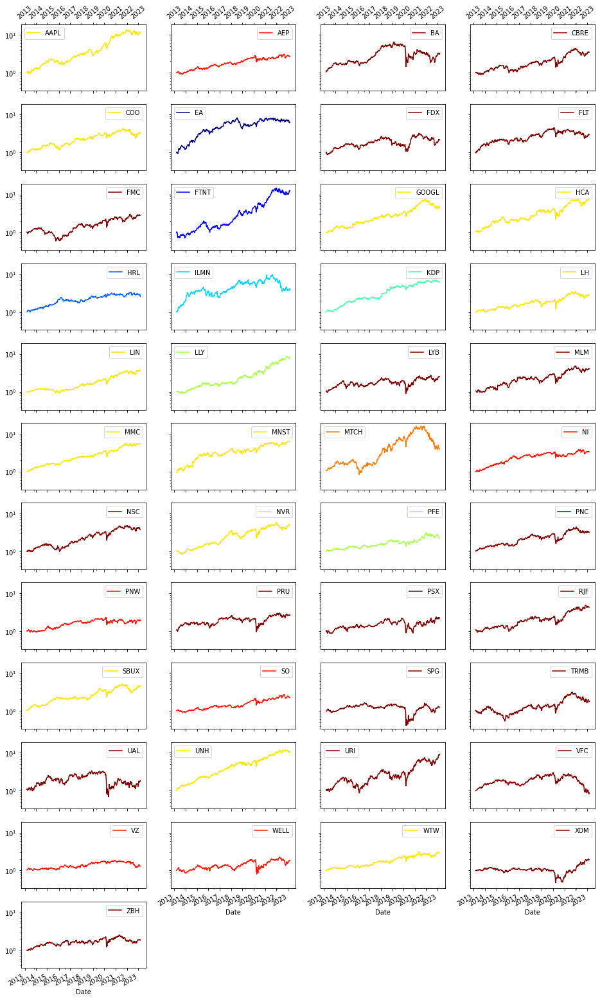

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
AAPL,NaN,1065.65,0.54,27.72,27.53,0.97,-34.64
AEP,NaN,167.94,0.23,10.32,21.08,0.45,-31.14
BA,NaN,230.86,0.42,12.66,45.47,0.26,-77.92
CBRE,NaN,249.55,0.33,13.28,30.65,0.40,-46.49
COO,NaN,235.38,0.30,12.81,25.66,0.46,-45.45
EA,NaN,530.25,0.44,20.13,29.46,0.65,-48.52
FDX,NaN,119.82,0.24,8.16,30.24,0.24,-59.90
FLT,NaN,201.66,0.30,11.63,29.91,0.36,-47.83
FMC,NaN,183.14,0.28,10.92,29.61,0.34,-55.71
FTNT,NaN,1160.15,0.62,28.71,36.85,0.75,-49.76


In [210]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 8:
- **Cluster 1:** EA
- **Cluster 2:** FTNT
- **Cluster 3:** HRL
- **Cluster 4:** ILMN
- **Cluster 5:** KDP
- **Cluster 6:** LLY, PFE
- **Cluster 7:** AAPL, COO, GOOGL, HCA, LH, LIN, MMC, MNST, NVR, SBUX, UNH, WTW
- **Cluster 8:** MTCH
- **Cluster 9:** AEP, NI, PNW, SO, VZ, WELL
- **Cluster 10:** BA, CBRE, FDX, FLT, FMC, LYB, MLM, NSC, PNC, PRU, PSX, RJF, SPG, TRMB, UAL, URI, VFC, XOM, ZBH

Podemos enfocarnos en los clusters 7,9 y 10, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['AAPL', 'COO', 'GOOGL', 'HCA', 'LH', 'LIN', 'MMC', 'MNST', 'NVR', 'SBUX', 'UNH', 'WTW']


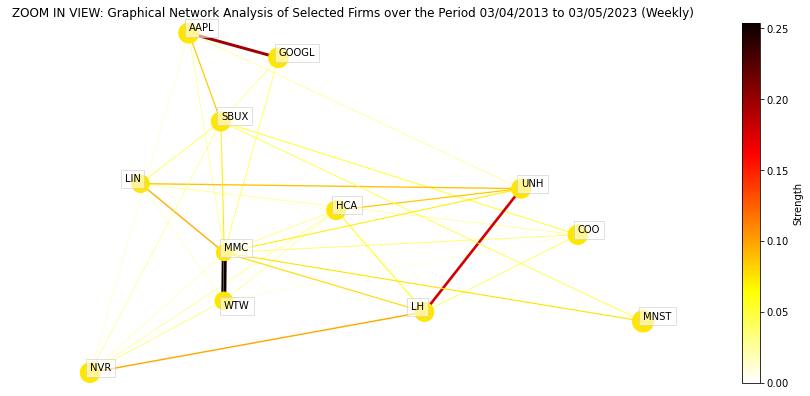

In [211]:
# Cluster 7
firms_list = ['AAPL', 'COO', 'GOOGL', 'HCA', 'LH', 'LIN', 'MMC', 'MNST', 'NVR', 'SBUX', 'UNH', 'WTW']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['AEP', 'NI', 'PNW', 'SO', 'VZ', 'WELL']


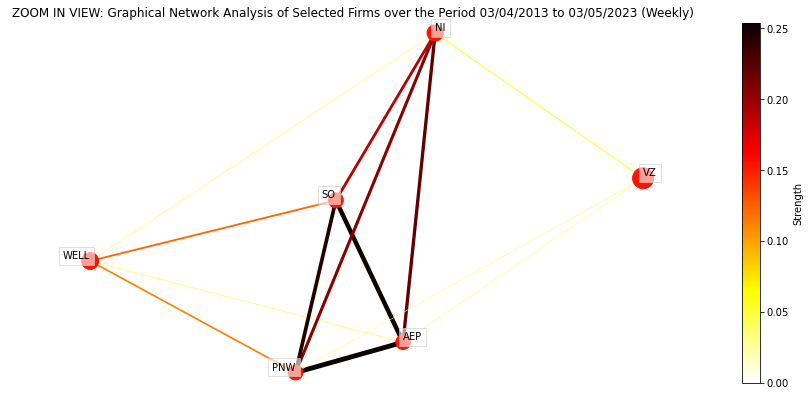

In [212]:
# Cluster 9
firms_list = ['AEP', 'NI', 'PNW', 'SO', 'VZ', 'WELL']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['BA', 'CBRE', 'FDX', 'FLT', 'FMC', 'LYB', 'MLM', 'NSC', 'PNC', 'PRU', 'PSX', 'RJF', 'SPG', 'TRMB', 'UAL', 'URI', 'VFC', 'XOM', 'ZBH']


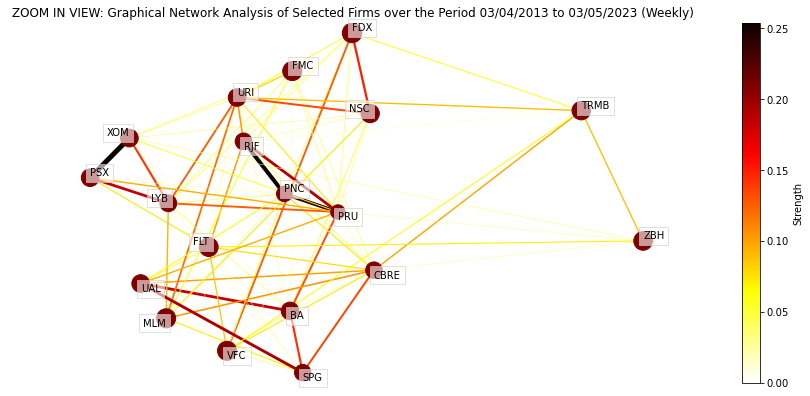

In [213]:
# Cluster 10
firms_list = ['BA', 'CBRE', 'FDX', 'FLT', 'FMC', 'LYB', 'MLM', 'NSC', 'PNC', 'PRU', 'PSX', 'RJF', 'SPG', 'TRMB', 'UAL', 'URI', 'VFC', 'XOM', 'ZBH']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [214]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 6
sortDataBySharpeRatio(data[['LLY', 'PFE']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['LLY', 'PFE']

In [215]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 7
sortDataBySharpeRatio(data[['AAPL', 'COO', 'GOOGL', 'HCA', 'LH', 'LIN', 'MMC', 'MNST', 'NVR', 'SBUX', 'UNH', 'WTW']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['UNH',
 'AAPL',
 'MMC',
 'HCA',
 'LIN',
 'MNST',
 'SBUX',
 'GOOGL',
 'NVR',
 'COO',
 'WTW',
 'LH']

In [216]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 9
sortDataBySharpeRatio(data[['AEP', 'NI', 'PNW', 'SO', 'VZ', 'WELL']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['NI', 'AEP', 'SO', 'PNW', 'WELL', 'VZ']

In [217]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 10
sortDataBySharpeRatio(data[['BA', 'CBRE', 'FDX', 'FLT', 'FMC', 'LYB', 'MLM', 'NSC', 'PNC', 'PRU', 'PSX', 'RJF', 'SPG', 'TRMB', 'UAL', 'URI', 'VFC', 'XOM', 'ZBH']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['URI',
 'NSC',
 'RJF',
 'MLM',
 'PNC',
 'CBRE',
 'FLT',
 'FMC',
 'PRU',
 'BA',
 'LYB',
 'FDX',
 'PSX',
 'XOM',
 'ZBH',
 'TRMB',
 'UAL',
 'SPG',
 'VFC']

# Portafolio 22.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 22,20.66,18.08,-0.15,6.77,0.04,0.06,1.08,-27.3


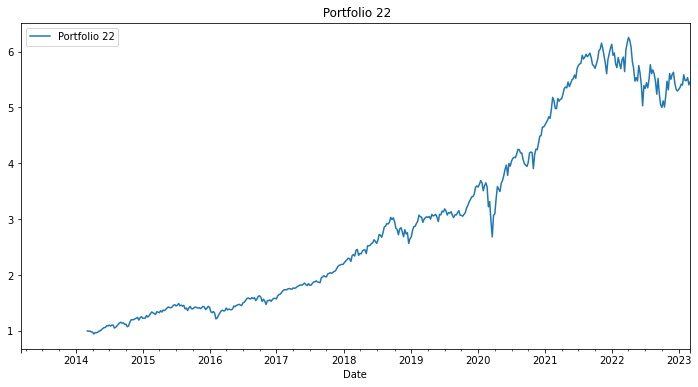

In [218]:
# vector de retornos esperados
er_p22 = annualize_rets(data[['EA','FTNT','HRL','ILMN','KDP','LLY','UNH','MTCH','NI','URI']], 52)
# matriz de covarianza
cov_p22 = data[['EA','FTNT','HRL','ILMN','KDP','LLY','UNH','MTCH','NI','URI']].cov()

weight_p22 = lambda x: weight_msr(er=er_p22, cov=cov_p22, rf=TBill['T-Bill'])
p22 = backtest_ws(data[['EA','FTNT','HRL','ILMN','KDP','LLY','UNH','MTCH','NI','URI']], estimation_window=52, weighting=weight_p22)
btr = pd.DataFrame({"Portfolio 22": p22})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 22")
summary_stats(btr.dropna())

In [222]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p22, cov=cov_p22, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio22 = pd.Series((weights_str), index = data[['EA','FTNT','HRL','ILMN','KDP','LLY','UNH','MTCH','NI','URI']].columns)
Portfolio22

EA      10.00
FTNT    10.00
HRL     10.00
ILMN    10.00
KDP     10.00
LLY     10.00
UNH     10.00
MTCH    10.00
NI      10.00
URI     10.00
dtype: object

# Portafolio 23.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 23,17.88,17.04,-0.25,5.89,0.04,0.05,0.99,-26.71


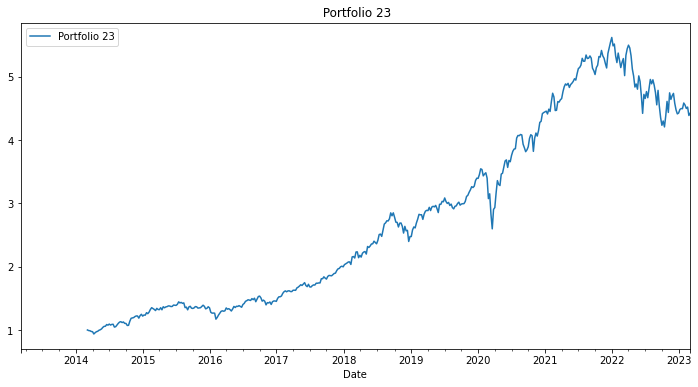

In [220]:
# vector de retornos esperados
er_p23 = annualize_rets(data[['EA','FTNT','HRL','ILMN','KDP','PFE','AAPL','MTCH','AEP','NSC']], 52)
# matriz de covarianza
cov_p23 = data[['EA','FTNT','HRL','ILMN','KDP','PFE','AAPL','MTCH','AEP','NSC']].cov()

weight_p23 = lambda x: weight_msr(er=er_p23, cov=cov_p23, rf=TBill['T-Bill'])
p23 = backtest_ws(data[['EA','FTNT','HRL','ILMN','KDP','PFE','AAPL','MTCH','AEP','NSC']], estimation_window=52, weighting=weight_p23)
btr = pd.DataFrame({"Portfolio 23": p23})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 23")
summary_stats(btr.dropna())

In [221]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p23, cov=cov_p23, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio23 = pd.Series((weights_str), index = data[['EA','FTNT','HRL','ILMN','KDP','PFE','AAPL','MTCH','AEP','NSC']].columns)
Portfolio23

EA      10.00
FTNT    10.00
HRL     10.00
ILMN    10.00
KDP     10.00
PFE     10.00
AAPL    10.00
MTCH    10.00
AEP     10.00
NSC     10.00
dtype: object

# Portafolio 24.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 24,18.59,16.89,-0.2,5.92,0.03,0.05,1.04,-25.09


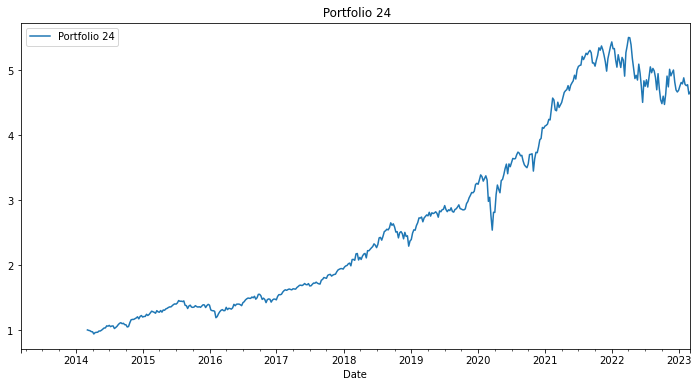

In [223]:
# vector de retornos esperados
er_p24 = annualize_rets(data[['EA','FTNT','HRL','ILMN','KDP','LLY','MMC','MTCH','SO','RJF']], 52)
# matriz de covarianza
cov_p24 = data[['EA','FTNT','HRL','ILMN','KDP','LLY','MMC','MTCH','SO','RJF']].cov()

weight_p24 = lambda x: weight_msr(er=er_p24, cov=cov_p24, rf=TBill['T-Bill'])
p24 = backtest_ws(data[['EA','FTNT','HRL','ILMN','KDP','LLY','MMC','MTCH','SO','RJF']], estimation_window=52, weighting=weight_p24)
btr = pd.DataFrame({"Portfolio 24": p24})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 24")
summary_stats(btr.dropna())

In [224]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p24, cov=cov_p24, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio24 = pd.Series((weights_str), index = data[['EA','FTNT','HRL','ILMN','KDP','LLY','MMC','MTCH','SO','RJF']].columns)
Portfolio24

EA      10.00
FTNT    10.00
HRL     10.00
ILMN    10.00
KDP     10.00
LLY     10.00
MMC     10.00
MTCH    10.00
SO      10.00
RJF     10.00
dtype: object

In [225]:
data_m8 = data

# Submuestra Aleatoria 9.-
------------

A continuación se muestra la información resumida de la novena submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [240]:
# SUBMUESTREO ALEATORIO 9
# Seleccionar una muestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker')

In [241]:
# Submuestra 9
Submuestra9 = firms_info 
Submuestra9

,Name,Sector
Ticker,,
ATVI,Activision Blizzard,Communication Services
ALGN,Align Technology,Health Care
AAL,American Airlines Group,Industrials
AIG,American International Group,Financials
AWK,American Water Works,Utilities
APTV,Aptiv,Consumer Discretionary
TECH,Bio-Techne,Health Care
BLK,BlackRock,Financials
COF,Capital One,Financials


In [242]:
# Sectores de la submuestra 9
Sectors = firms_info.Sector.unique()
print(Sectors)

['Communication Services' 'Health Care' 'Industrials' 'Financials'
 'Utilities' 'Consumer Discretionary' 'Materials' 'Consumer Staples'
 'Energy' 'Real Estate' 'Information Technology']


In [243]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed


In [244]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
IR
MRNA
NWSA

Number of firms examined: 47
Cluster 1: ATVI
Cluster 2: ALGN, BLK, COST, FDX, HD, IBM, LIN, MCD, MSI, NDSN, NXPI, PCAR, PTC, STT, SWKS
Cluster 3: CLX
Cluster 4: AAL, AIG, APTV, CE, COF, DD, GL, GPN, HST, LUMN, RL, SWK, TJX, ZION
Cluster 5: AWK, DTE, ESS, WELL
Cluster 6: DXCM
Cluster 7: FSLR
Cluster 8: HOLX, IDXX, TECH, ZTS
Cluster 9: CTRA, HES, MRO, TRGP
Cluster 10: NRG
Cluster 11: WBA


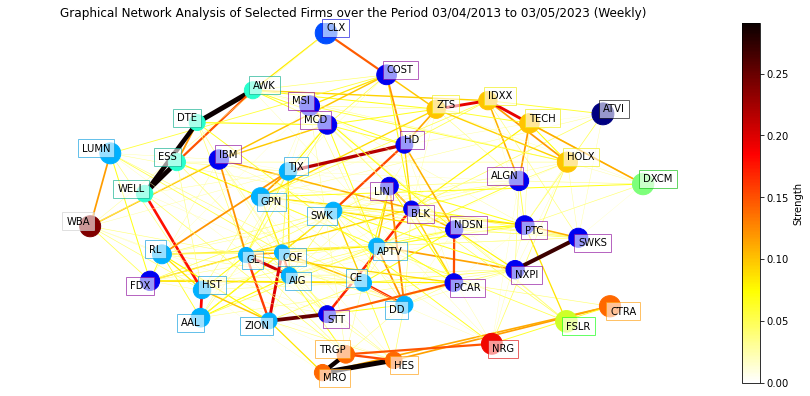

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


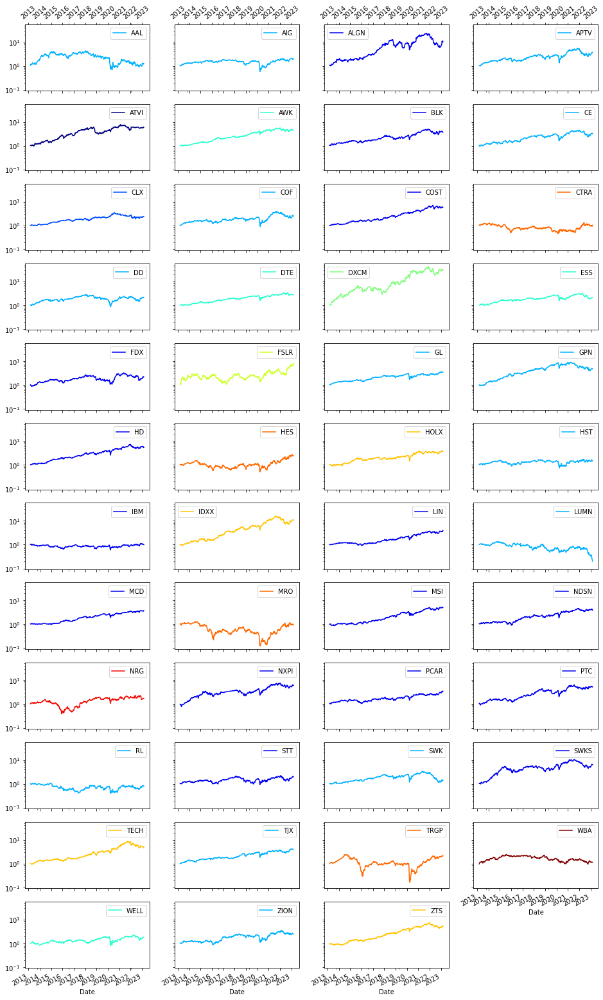

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
AAL,NaN,24.85,0.31,2.24,53.84,0.03,-84.14
AIG,NaN,95.19,0.23,6.89,32.63,0.18,-68.67
ALGN,NaN,979.57,0.66,26.74,46.62,0.55,-75.05
APTV,NaN,268.45,0.38,13.87,37.09,0.35,-57.30
ATVI,NaN,496.97,0.42,19.48,29.00,0.64,-50.11
AWK,NaN,324.03,0.33,15.48,22.55,0.64,-31.67
BLK,NaN,270.28,0.32,13.93,26.99,0.48,-41.88
CE,Materials,231.62,0.31,12.68,29.75,0.39,-48.87
CLX,NaN,142.92,0.21,9.24,20.82,0.40,-46.00
COF,NaN,147.92,0.30,9.47,36.27,0.24,-59.34


In [245]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 9:   
- **Cluster 1:** ATVI
- **Cluster 2:** ALGN, BLK, COST, FDX, HD, IBM, LIN, MCD, MSI, NDSN, NXPI, PCAR, PTC, STT, SWKS
- **Cluster 3:** CLX
- **Cluster 4:** AAL, AIG, APTV, CE, COF, DD, GL, GPN, HST, LUMN, RL, SWK, TJX, ZION
- **Cluster 5:** AWK, DTE, ESS, WELL
- **Cluster 6:** DXCM
- **Cluster 7:** FSLR
- **Cluster 8:** HOLX, IDXX, TECH, ZTS
- **Cluster 9:** CTRA, HES, MRO, TRGP
- **Cluster 10:** NRG
- **Cluster 11:** WBA

Podemos enfocarnos en los clusters 2 y 4, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['ALGN', 'BLK', 'COST', 'FDX', 'HD', 'IBM', 'LIN', 'MCD', 'MSI', 'NDSN', 'NXPI', 'PCAR', 'PTC', 'STT', 'SWKS']


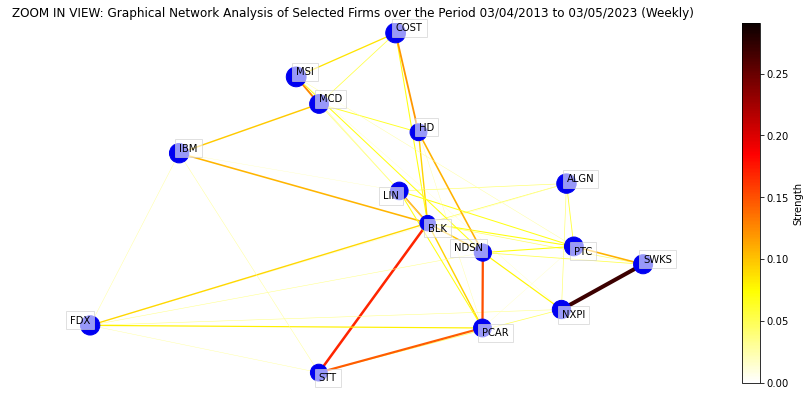

In [247]:
# Cluster 2
firms_list = ['ALGN', 'BLK', 'COST', 'FDX', 'HD', 'IBM', 'LIN', 'MCD', 'MSI', 'NDSN', 'NXPI', 'PCAR', 'PTC', 'STT', 'SWKS']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['AAL', 'AIG', 'APTV', 'CE', 'COF', 'DD', 'GL', 'GPN', 'HST', 'LUMN', 'RL', 'SWK', 'TJX', 'ZION']


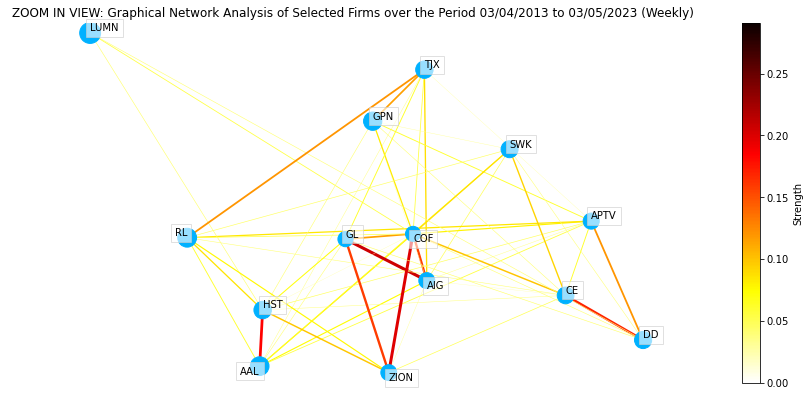

In [248]:
# Cluster 4
firms_list = ['AAL', 'AIG', 'APTV', 'CE', 'COF', 'DD', 'GL', 'GPN', 'HST', 'LUMN', 'RL', 'SWK', 'TJX', 'ZION']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [249]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 2
sortDataBySharpeRatio(data[['ALGN', 'BLK', 'COST', 'FDX', 'HD', 'IBM', 'LIN', 'MCD', 'MSI', 'NDSN', 'NXPI', 'PCAR', 'PTC', 'STT', 'SWKS']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['COST',
 'MCD',
 'HD',
 'MSI',
 'LIN',
 'ALGN',
 'SWKS',
 'PTC',
 'NXPI',
 'PCAR',
 'NDSN',
 'BLK',
 'FDX',
 'STT',
 'IBM']

In [250]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 4
sortDataBySharpeRatio(data[['AAL', 'AIG', 'APTV', 'CE', 'COF', 'DD', 'GL', 'GPN', 'HST', 'LUMN', 'RL', 'SWK', 'TJX', 'ZION']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['GL',
 'GPN',
 'TJX',
 'CE',
 'APTV',
 'ZION',
 'COF',
 'DD',
 'AIG',
 'HST',
 'SWK',
 'AAL',
 'RL',
 'LUMN']

In [251]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 5
sortDataBySharpeRatio(data[[ 'AWK', 'DTE', 'ESS', 'WELL']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['AWK', 'DTE', 'ESS', 'WELL']

In [252]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 8
sortDataBySharpeRatio(data[[ 'HOLX', 'IDXX', 'TECH', 'ZTS']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['IDXX', 'ZTS', 'TECH', 'HOLX']

In [246]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 9
sortDataBySharpeRatio(data[['CTRA', 'HES', 'MRO', 'TRGP']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['HES', 'TRGP', 'CTRA', 'MRO']

# Portafolio 25.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 25,22.44,18.16,-0.04,6.2,0.04,0.05,1.17,-25.2


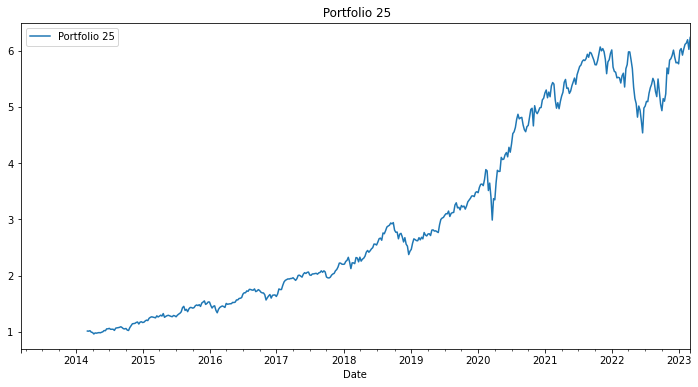

In [253]:
# vector de retornos esperados
er_p25 = annualize_rets(data[['ATVI','COST','CLX','GL','AWK','DXCM','FSLR','IDXX','HES','NRG','WBA']], 52)
# matriz de covarianza
cov_p25 = data[['ATVI','COST','CLX','GL','AWK','DXCM','FSLR','IDXX','HES','NRG','WBA']].cov()

weight_p25 = lambda x: weight_msr(er=er_p25, cov=cov_p25, rf=TBill['T-Bill'])
p25 = backtest_ws(data[['ATVI','COST','CLX','GL','AWK','DXCM','FSLR','IDXX','HES','NRG','WBA']], estimation_window=52, weighting=weight_p25)
btr = pd.DataFrame({"Portfolio 25": p25})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 25")
summary_stats(btr.dropna())

In [254]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p25, cov=cov_p25, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio25 = pd.Series((weights_str), index = data[['ATVI','COST','CLX','GL','AWK','DXCM','FSLR','IDXX','HES','NRG','WBA']].columns)
Portfolio25

ATVI    15.00
COST    15.00
CLX     13.58
GL      13.34
AWK      9.14
DXCM    15.00
FSLR     3.93
IDXX    15.00
HES      0.00
NRG      0.00
WBA      0.00
dtype: object

# Portafolio 26.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 26,21.76,18.5,-0.05,5.43,0.04,0.05,1.12,-24.95


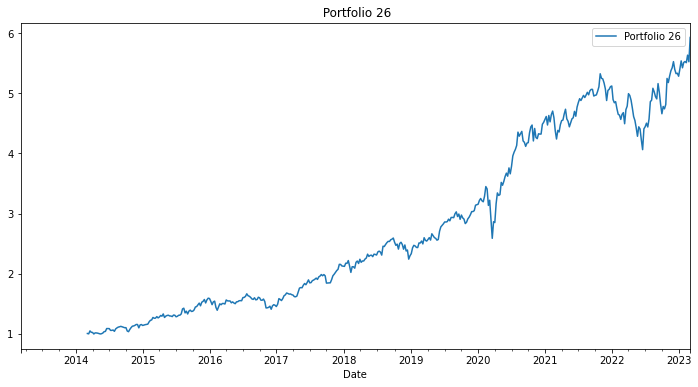

In [255]:
# vector de retornos esperados
er_p26 = annualize_rets(data[['ATVI','MCD','CLX','GPN','DTE','DXCM','FSLR','ZTS','TRGP','NRG','WBA']], 52)
# matriz de covarianza
cov_p26 = data[['ATVI','MCD','CLX','GPN','DTE','DXCM','FSLR','ZTS','TRGP','NRG','WBA']].cov()

weight_p26 = lambda x: weight_msr(er=er_p26, cov=cov_p26, rf=TBill['T-Bill'])
p26 = backtest_ws(data[['ATVI','MCD','CLX','GPN','DTE','DXCM','FSLR','ZTS','TRGP','NRG','WBA']], estimation_window=52, weighting=weight_p26)
btr = pd.DataFrame({"Portfolio 26": p26})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 26")
summary_stats(btr.dropna())

In [256]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p26, cov=cov_p26, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio26 = pd.Series((weights_str), index = data[['ATVI','MCD','CLX','GPN','DTE','DXCM','FSLR','ZTS','TRGP','NRG','WBA']].columns)
Portfolio26

ATVI    15.00
MCD     15.00
CLX     15.00
GPN      0.00
DTE     10.00
DXCM    15.00
FSLR    15.00
ZTS     15.00
TRGP     0.00
NRG      0.00
WBA      0.00
dtype: object

# Portafolio 27.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 27,21.3,19.56,0.1,6.33,0.04,0.06,1.03,-27.64


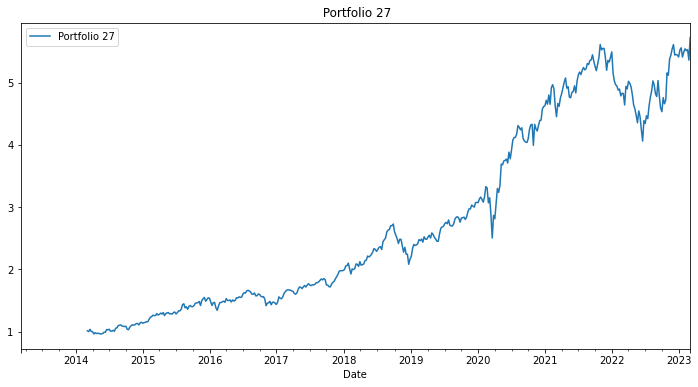

In [257]:
# vector de retornos esperados
er_p27 = annualize_rets(data[['ATVI','HD','CLX','TJX','ESS','DXCM','FSLR','TECH','CTRA','NRG','WBA']], 52)
# matriz de covarianza
cov_p27 = data[['ATVI','HD','CLX','TJX','ESS','DXCM','FSLR','TECH','CTRA','NRG','WBA']].cov()

weight_p27 = lambda x: weight_msr(er=er_p27, cov=cov_p27, rf=TBill['T-Bill'])
p27 = backtest_ws(data[['ATVI','HD','CLX','TJX','ESS','DXCM','FSLR','TECH','CTRA','NRG','WBA']], estimation_window=52, weighting=weight_p27)
btr = pd.DataFrame({"Portfolio 27": p27})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 27")
summary_stats(btr.dropna())

In [258]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p27, cov=cov_p27, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio27 = pd.Series((weights_str), index = data[['ATVI','HD','CLX','TJX','ESS','DXCM','FSLR','TECH','CTRA','NRG','WBA']].columns)
Portfolio27

ATVI    15.00
HD      15.00
CLX     15.00
TJX     15.00
ESS      0.09
DXCM    15.00
FSLR     9.91
TECH    15.00
CTRA     0.00
NRG      0.00
WBA      0.00
dtype: object

In [259]:
data_m9 = data

# Submuestra Aleatoria 10.-
------------

A continuación se muestra la información resumida de la décima submuestra aleatoria de 30 acciones (de un total de 10 submuestras que serán sometidas al análisis gráfico).

In [260]:
# SUBMUESTREO ALEATORIO 10
# Seleccionar una muestra aleatoria de empresas de la lista completa de tickers
num_stocks = 50
random_stocks = random.sample(sp500_tickers, num_stocks )

# Listar las acciones aleatorias por orden alfabetico y guardarlas en una variable para asegurarse de que no cambien durante el resto del código:
sample_stocks = sorted(random_stocks)

# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# INFORMACIÓN RESUMIDA DE LAS ACCIONES
# Seleccionar las filas de la tabla que corresponden a los tickers seleccionados aleatoriamente
firms_info = sp500_table[sp500_table['Ticker'].isin(sample_stocks)]

# Establecer Ticker como índice
firms_info = firms_info.set_index('Ticker')

In [261]:
# Submuestra 10
Submuestra10 = firms_info 
Submuestra10

,Name,Sector
Ticker,,
AFL,Aflac,Financials
ALB,Albemarle Corporation,Materials
ALLE,Allegion,Industrials
AXP,American Express,Financials
ANSS,Ansys,Information Technology
BALL,Ball Corporation,Materials
TECH,Bio-Techne,Health Care
CHRW,C.H. Robinson,Industrials
CPB,Campbell Soup Company,Consumer Staples


In [262]:
# Sectores de la submuestra 10
Sectors = firms_info.Sector.unique()
print(Sectors)

['Financials' 'Materials' 'Industrials' 'Information Technology'
 'Health Care' 'Consumer Staples' 'Energy' 'Consumer Discretionary'
 'Real Estate' 'Utilities']


In [263]:
# DESCARGA DE DATA (retornos)
# Descargar los precios de cierre ajustados por dividendo de Yahoo Finance para la muestra de acciones y calcular su retorno diario:
daily_returns = yf.download(sample_stocks, start=start_date, end=end_date)['Adj Close'].pct_change()

# Elimina el primer elemento, que es NaN
daily_returns = daily_returns[1:]

# PROCESAMIENTO DE DATOS (retornos)
# Reorganizar los datos y convertirlos a frecuencia semanal
# Se crea una lista llamada WEEKLY_DFS
WEEKLY_DFS = []
# En cada iteración de un bucle for, se selecciona una empresa del DataFrame
for i in range(len(daily_returns.columns)):
# Se eliminan las filas con valores faltantes 
    firm = daily_returns.columns[i]
    RET = daily_returns[firm].dropna(axis=0)
# Se convierte los rendimientos diarios a rendimientos semanales utilizando el método resample de Pandas
    RET_weekly = (RET+1).resample('W').prod() - 1 
# El rendimiento semanal se agrega a la lista WEEKLY_DFS.
    WEEKLY_DFS.append(RET_weekly)
    
# Se calcula el número de elementos en cada elemento de WEEKLY_DFS y se almacena en un array llamado len_WEEKLY_DFS
len_WEEKLY_DFS = np.array([len(temp) for temp in WEEKLY_DFS])
Names = daily_returns.columns
# Se crea un DataFrame que tendrá como columnas los nombres de las empresas contenidas en daily_returns. La fecha de índice de este DataFrame se establece como la fecha correspondiente al elemento de WEEKLY_DFS con el mayor número de elementos
data = pd.DataFrame(columns=Names, index=WEEKLY_DFS[np.argmax(len_WEEKLY_DFS)].index)
# Se asigna cada rendimiento semanal en WEEKLY_DFS a la columna correspondiente en data
for i in range(len(Names)):
    data[Names[i]] = WEEKLY_DFS[i]

[*********************100%***********************]  50 of 50 completed


In [264]:
# Fecha de inicio y fecha de finalización que se está considerando:
start_date = '2013-03-03'
end_date   = '2023-03-05'

# Sectores escogidos para ser testeados:
Sectors_chosen = []

# La lista de empresas que se desea eliminar:
drop_firm = []

# Si queremos mostrar las estadísticas resumidas y/o el rendimiento individual de la empresa:
display_SumStat = True
display_IndRet = True

Results over the time period  2013-03-03  to  2023-03-05 :

The "start_date" is adjusted to the earliest start_date, i.e.  2013-03-04

Dropping firms: 
ALLE
CARR
CTLT
HWM
INVH
KEYS
SYF

Number of firms examined: 43
Cluster 1: CHRW
Cluster 2: COST, WMT
Cluster 3: CPB
Cluster 4: CTRA
Cluster 5: GILD
Cluster 6: HII, LMT
Cluster 7: JNJ, PFE, PGR
Cluster 8: HSY, KO, MCD, PEP, WELL, XEL
Cluster 9: AFL, ALB, AXP, ETN, HAL, HIG, IBM, LNC, MOS, PNC, RL, SPG, TXT, VLO
Cluster 10: ANSS, BALL, GRMN, ISRG, MA, MCO, MTD, PAYX, SBAC, SPGI, TECH
Cluster 11: QCOM


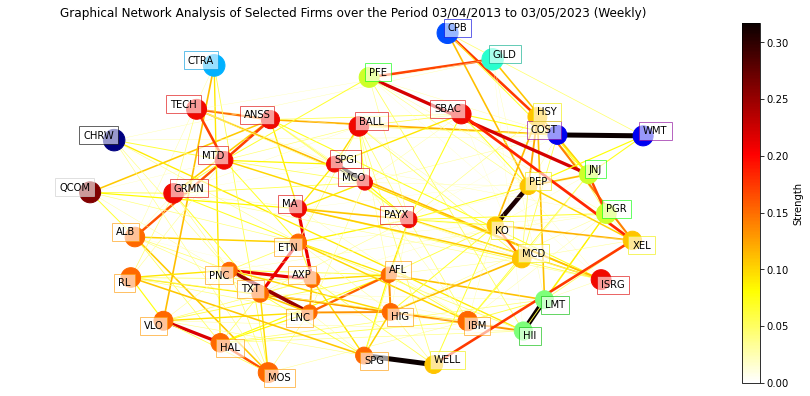

Individual Stock Performance over the Period 03/04/2013 to 03/05/2023 (Weekly):


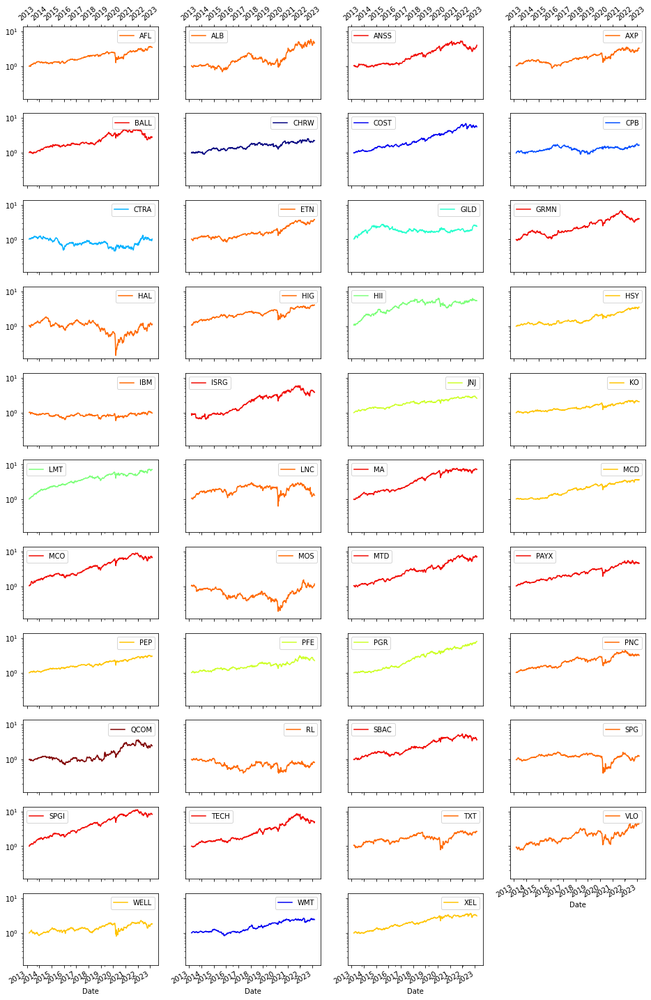

Summary Statistic Information from 03/04/2013 to 03/05/2023:


,Sector,Total Return(%),Weekly Ave Return(%),Annu. Ave Return(%),Annu. Vol(%),Sharpe Ratio,Max Drawdown(%)
AFL,NaN,247.24,0.30,13.20,25.35,0.48,-52.28
ALB,NaN,372.70,0.45,16.73,40.53,0.39,-60.95
ANSS,Information Technology,301.88,0.34,14.86,26.77,0.52,-50.03
AXP,NaN,228.71,0.32,12.59,30.38,0.38,-45.53
BALL,NaN,183.90,0.27,10.95,26.14,0.38,-50.75
CHRW,NaN,124.44,0.21,8.39,23.72,0.32,-35.30
COST,NaN,458.81,0.37,18.70,21.19,0.84,-30.49
CPB,Consumer Staples,66.99,0.15,5.24,23.74,0.18,-47.93
CTRA,NaN,3.27,0.13,0.32,35.91,-0.01,-63.43
ETN,NaN,277.22,0.32,14.14,26.19,0.50,-37.58


In [265]:
print('Results over the time period ', start_date, ' to ', end_date, ':')
print()


# Se almacena la matriz de correlación y la matriz de precisión en "est" (estimaciones)
# Se almacena la información de configuración de trazado en "con_fig" (necesaria para usar las funciones ZOOM)
## Nota: Se puede ver la matriz de correlación mirando est[0] y ver la matriz de precisión mirando est[1].
est, con_fig = graphicalAnalysis(data, start_date, end_date, 
                                 Sectors_chosen, drop_firm, 
                                 display_SumStat, display_IndRet)

El siguiente código puede ser usado para enfocarnos en un conjunto particular de empresas del grafo de red y analizar más detenidamente una lista de empresas. 
Nota: Estas empresas no necesitan ser del mismo sector, pero necesitan estar en la lista "Sectors_chosen" si "Sectors_chosen" es diferente de la configuración predeterminada).

Considerando los clusters conformados para la submuestra 10:   
- **Cluster 1:** CHRW
- **Cluster 2:** COST, WMT
- **Cluster 3:** CPB
- **Cluster 4:** CTRA
- **Cluster 5:** GILD
- **Cluster 6:** HII, LMT
- **Cluster 7:** JNJ, PFE, PGR
- **Cluster 8:** HSY, KO, MCD, PEP, WELL, XEL
- **Cluster 9:** AFL, ALB, AXP, ETN, HAL, HIG, IBM, LNC, MOS, PNC, RL, SPG, TXT, VLO
- **Cluster 10:** ANSS, BALL, GRMN, ISRG, MA, MCO, MTD, PAYX, SBAC, SPGI, TECH
- **Cluster 11:** QCOM
    
Podemos enfocarnos en los clusters 8, 9 y 10, al ser los cluster más significativos dadas las relaciones entre acciones.

ZOOM IN View of the Selected Firms:
['HSY', 'KO', 'MCD', 'PEP', 'WELL', 'XEL']


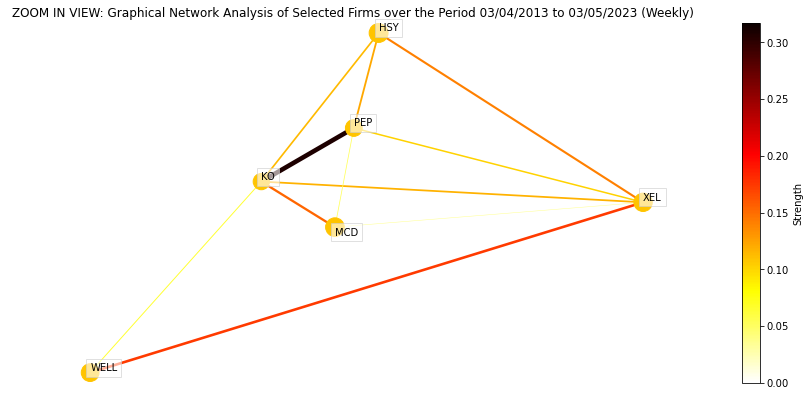

In [266]:
# Cluster 8
firms_list = ['HSY', 'KO', 'MCD', 'PEP', 'WELL', 'XEL']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['AFL', 'ALB', 'AXP', 'ETN', 'HAL', 'HIG', 'IBM', 'LNC', 'MOS', 'PNC', 'RL', 'SPG', 'TXT', 'VLO']


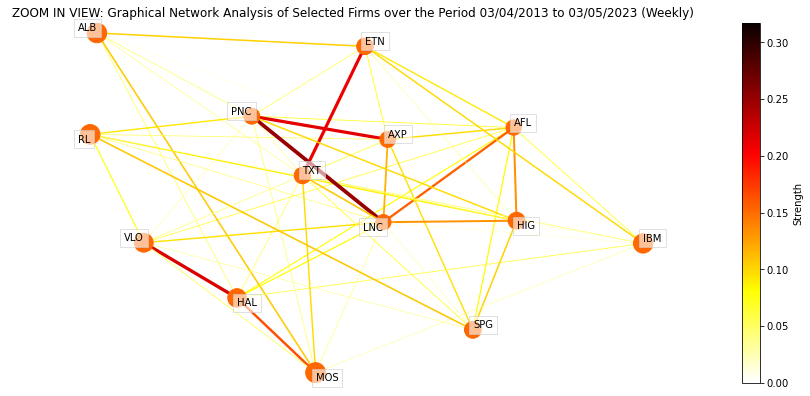

In [267]:
# Cluster 9
firms_list = ['AFL', 'ALB', 'AXP', 'ETN', 'HAL', 'HIG', 'IBM', 'LNC', 'MOS', 'PNC', 'RL', 'SPG', 'TXT', 'VLO']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

ZOOM IN View of the Selected Firms:
['ANSS', 'BALL', 'GRMN', 'ISRG', 'MA', 'MCO', 'MTD', 'PAYX', 'SBAC', 'SPGI', 'TECH']


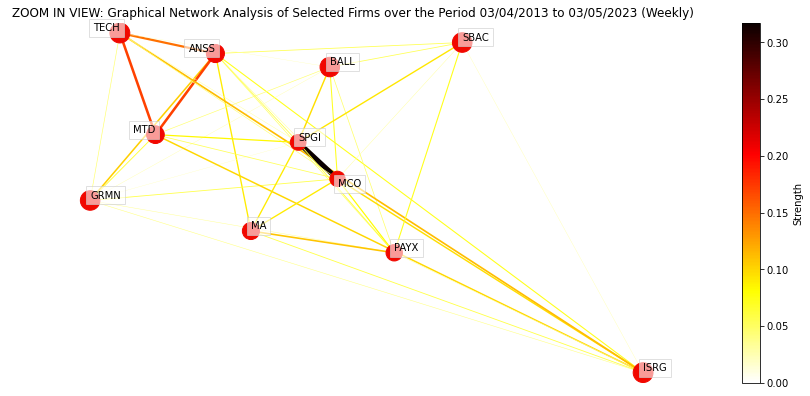

In [268]:
# Cluster 10
firms_list = ['ANSS', 'BALL', 'GRMN', 'ISRG', 'MA', 'MCO', 'MTD', 'PAYX', 'SBAC', 'SPGI', 'TECH']

print('ZOOM IN View of the Selected Firms:')
print(firms_list)
graphicalAnalysis_plot_ZOOM_byFirm(firms_list, con_fig)

In [269]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 2
sortDataBySharpeRatio(data[['COST', 'WMT']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['COST', 'WMT']

In [270]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 6
sortDataBySharpeRatio(data[['HII', 'LMT']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['LMT', 'HII']

In [271]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 7
sortDataBySharpeRatio(data[['JNJ', 'PFE', 'PGR']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['PGR', 'JNJ', 'PFE']

In [272]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 8
sortDataBySharpeRatio(data[['HSY', 'KO', 'MCD', 'PEP', 'WELL', 'XEL']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['MCD', 'HSY', 'PEP', 'XEL', 'KO', 'WELL']

In [273]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 9
sortDataBySharpeRatio(data[['AFL', 'ALB', 'AXP', 'ETN', 'HAL', 'HIG', 'IBM', 'LNC', 'MOS', 'PNC', 'RL', 'SPG', 'TXT', 'VLO']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['ETN',
 'HIG',
 'AFL',
 'PNC',
 'VLO',
 'ALB',
 'AXP',
 'TXT',
 'LNC',
 'SPG',
 'MOS',
 'HAL',
 'IBM',
 'RL']

In [274]:
# Orden de empresas según el Sharpe Ratio más alto para el cluster 10
sortDataBySharpeRatio(data[['ANSS', 'BALL', 'GRMN', 'ISRG', 'MA', 'MCO', 'MTD', 'PAYX', 'SBAC', 'SPGI', 'TECH']], rf=TBill['T-Bill'])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['SPGI',
 'MA',
 'MTD',
 'MCO',
 'PAYX',
 'TECH',
 'GRMN',
 'ANSS',
 'SBAC',
 'ISRG',
 'BALL']

# Portafolio 28.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 28,17.08,15.08,-0.18,5.55,0.03,0.05,1.06,-18.86


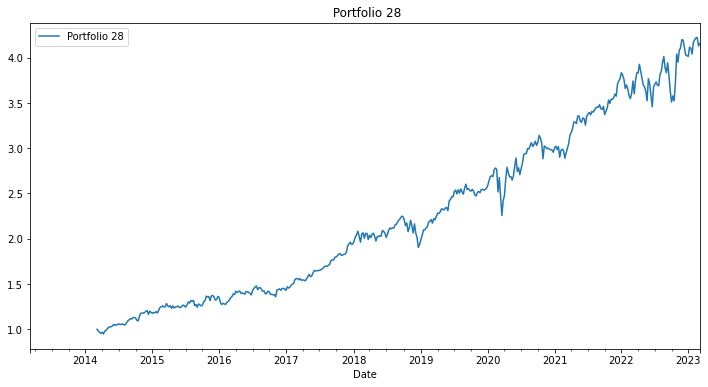

In [275]:
# vector de retornos esperados
er_p28 = annualize_rets(data[['CHRW','COST','CPB','CTRA','GILD','LMT','PGR','MCD','ETN','SPGI','QCOM']], 52)
# matriz de covarianza
cov_p28 = data[['CHRW','COST','CPB','CTRA','GILD','LMT','PGR','MCD','ETN','SPGI','QCOM']].cov()

weight_p28 = lambda x: weight_msr(er=er_p28, cov=cov_p28, rf=TBill['T-Bill'])
p28 = backtest_ws(data[['CHRW','COST','CPB','CTRA','GILD','LMT','PGR','MCD','ETN','SPGI','QCOM']], estimation_window=52, weighting=weight_p28)
btr = pd.DataFrame({"Portfolio 28": p28})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 28")
summary_stats(btr.dropna())

In [276]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p28, cov=cov_p28, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio28 = pd.Series((weights_str), index = data[['CHRW','COST','CPB','CTRA','GILD','LMT','PGR','MCD','ETN','SPGI','QCOM']].columns)
Portfolio28

CHRW    10.00
COST    15.00
CPB      0.00
CTRA     0.00
GILD    15.00
LMT     15.00
PGR     15.00
MCD     15.00
ETN      0.00
SPGI    15.00
QCOM     0.00
dtype: object

# Portafolio 29.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 29,12.95,15.21,-0.61,7.01,0.03,0.05,0.78,-24.65


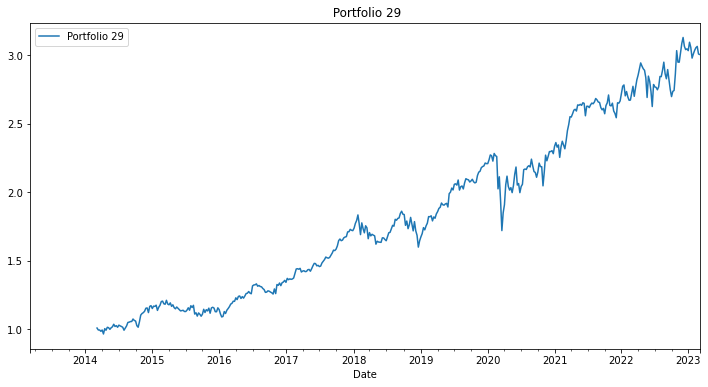

In [277]:
# vector de retornos esperados
er_p29 = annualize_rets(data[['CHRW','WMT','CPB','CTRA','GILD','HII','JNJ','HSY','HIG','MA','QCOM']], 52)
# matriz de covarianza
cov_p29 = data[['CHRW','WMT','CPB','CTRA','GILD','HII','JNJ','HSY','HIG','MA','QCOM']].cov()

weight_p29 = lambda x: weight_msr(er=er_p29, cov=cov_p29, rf=TBill['T-Bill'])
p29 = backtest_ws(data[['CHRW','WMT','CPB','CTRA','GILD','HII','JNJ','HSY','HIG','MA','QCOM']], estimation_window=52, weighting=weight_p29)
btr = pd.DataFrame({"Portfolio 29": p29})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 29")
summary_stats(btr.dropna())

In [278]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p29, cov=cov_p29, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio29 = pd.Series((weights_str), index = data[['CHRW','WMT','CPB','CTRA','GILD','HII','JNJ','HSY','HIG','MA','QCOM']].columns)
Portfolio29

CHRW     7.36
WMT     15.00
CPB      1.72
CTRA     0.00
GILD     6.07
HII     15.00
JNJ     15.00
HSY     15.00
HIG      9.85
MA      15.00
QCOM     0.00
dtype: object

# Portafolio 30.-

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 30,15.17,14.97,-0.35,6.15,0.03,0.05,0.94,-20.81


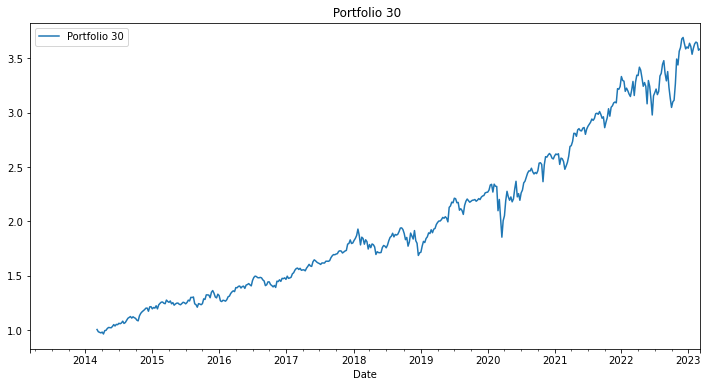

In [279]:
# vector de retornos esperados
er_p30 = annualize_rets(data[['CHRW','COST','CPB','CTRA','GILD','LMT','PFE','PEP','AFL','MTD','QCOM']], 52)
# matriz de covarianza
cov_p30 = data[['CHRW','COST','CPB','CTRA','GILD','LMT','PFE','PEP','AFL','MTD','QCOM']].cov()

weight_p30 = lambda x: weight_msr(er=er_p30, cov=cov_p30, rf=TBill['T-Bill'])
p30 = backtest_ws(data[['CHRW','COST','CPB','CTRA','GILD','LMT','PFE','PEP','AFL','MTD','QCOM']], estimation_window=52, weighting=weight_p30)
btr = pd.DataFrame({"Portfolio 30": p30})
(1+btr).cumprod().plot(figsize=(12,6), title=" Portfolio 30")
summary_stats(btr.dropna())

In [280]:
# Calculamos los pesos de cada activo en el portafolio creado
weights_scaled = np.round(weight_msr(er=er_p30, cov=cov_p30, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
Portfolio30 = pd.Series((weights_str), index = data[['CHRW','COST','CPB','CTRA','GILD','LMT','PFE','PEP','AFL','MTD','QCOM']].columns)
Portfolio30

CHRW    10.74
COST    15.00
CPB      8.43
CTRA     0.00
GILD     7.78
LMT     15.00
PFE      3.61
PEP     15.00
AFL      9.44
MTD     15.00
QCOM     0.00
dtype: object

In [281]:
data_m10 = data

# Portafolios construidos mediante técnicas de Machine Learning .-
------------

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 1,25.66,16.77,-0.23,6.14,0.03,0.05,1.46,-24.96
Portfolio 3,26.40,18.79,-0.28,6.28,0.04,0.06,1.34,-27.89
Portfolio 2,24.69,18.26,-0.15,4.97,0.04,0.06,1.29,-21.65
Portfolio 19,27.71,21.44,-0.17,8.01,0.04,0.06,1.24,-34.04
Portfolio 7,22.10,16.93,-0.43,9.45,0.03,0.05,1.24,-25.71
Portfolio 13,20.86,16.74,-0.28,7.54,0.03,0.05,1.18,-25.77
Portfolio 25,22.44,18.16,-0.04,6.20,0.04,0.05,1.17,-25.20
Portfolio 8,18.66,15.25,-0.26,10.12,0.03,0.05,1.15,-25.22
Portfolio 26,21.76,18.50,-0.05,5.43,0.04,0.05,1.12,-24.95
Portfolio 9,19.88,16.83,-0.41,8.56,0.03,0.05,1.12,-28.79


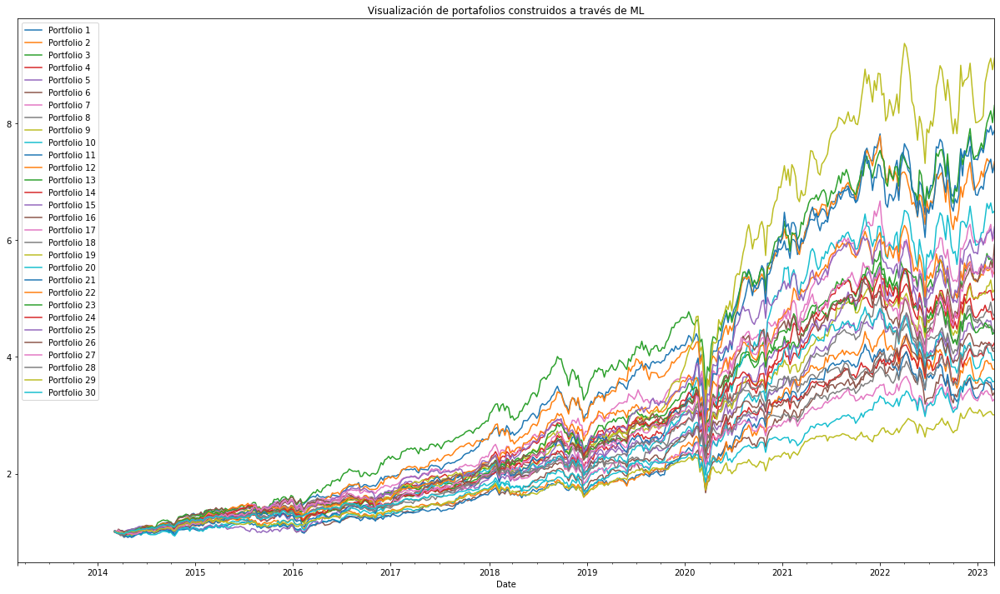

In [282]:
btr = pd.DataFrame({"Portfolio 1": p1,"Portfolio 2": p2,"Portfolio 3": p3,"Portfolio 4": p4,"Portfolio 5": p5,
                    "Portfolio 6": p6,"Portfolio 7": p7,"Portfolio 8": p8,"Portfolio 9": p9,"Portfolio 10": p10,
                    "Portfolio 11": p11,"Portfolio 12": p12,"Portfolio 13": p13,"Portfolio 14": p14,"Portfolio 15": p15,
                    "Portfolio 16": p16,"Portfolio 17": p17,"Portfolio 18": p18,"Portfolio 19": p19,"Portfolio 20": p20,
                    "Portfolio 21": p21,"Portfolio 22": p22,"Portfolio 23": p23,"Portfolio 24": p24,"Portfolio 25": p25,
                    "Portfolio 26": p26,"Portfolio 27": p27,"Portfolio 28": p28,"Portfolio 29": p29,"Portfolio 30": p30
                   })
(1+btr).cumprod().plot(figsize=(21,12), title=" Visualización de portafolios construidos a través de ML ")
summary_stats(btr.dropna()).sort_values('Sharpe Ratio', ascending=False)

Ahora, se comparará el portafolio construido a traves de ML con el Sharpe Ratio más alto (portafolio 1) con el optimizador de Maximum Sharpe Ratio (MSR) y un Portafolio "Equally Weighted" utilizando la misma submuestra de empresas. 

De igual manera, se comparará el portafolio construido a traves de ML con el segundo y tercer Sharpe Ratio más alto (portafolio 19 y portafolio 7)  con el optimizador de Maximum Sharpe Ratio (MSR) y un Portafolio "Equally Weighted" utilizando las mismas submuestra de empresas. No se consideran los portafolios 3 y 2 dado que comparten la misma muestra que el portafolio 1.

Finalmente, se construirá tres portafolios nuevos con las muestras de empresas del portafolio 1, 19 y 7, basandose esta vez en portafolios construidos con activos con la menor volatilidad anualizada para despues comparar cada portafolio de manera separada con el optimizador de Minimum Global Variance (MGV) utilizando submuestras respectivas.

# Maximum Sharpe Ratio Portfolio (MSR)  & Equally- Weighted Portfolio (EW) con submuestra del portafolio con Sharpe Ratio más alto.-
------------

In [283]:
datap1 = data_m1
datap1

,AJG,AMD,ANSS,AON,APA,BEN,CE,CPB,CTAS,DHI,...,STLD,SYF,TSCO,TTWO,TXT,URI,VICI,WBD,WDC,WYNN
Date,,,,,,,,,,,,,,,,,,,,,
2013-03-10,0.011218,0.066667,0.032500,-0.004629,0.040148,0.031687,0.035683,-0.009337,0.015106,0.035714,...,0.064753,NaN,0.009838,0.028686,0.061452,0.052834,NaN,0.030560,-0.003138,0.006864
2013-03-17,0.022703,0.015625,0.004766,-0.005148,0.000397,0.020839,-0.005284,0.005558,0.008343,0.011218,...,-0.030094,NaN,-0.035243,0.016861,0.022049,-0.038504,NaN,-0.007445,0.052455,0.022326
2013-03-24,0.021696,-0.023077,-0.008612,0.006177,-0.015988,-0.008406,-0.081810,0.041817,-0.029741,0.015612,...,0.005171,NaN,0.010890,-0.011480,-0.009662,0.021636,NaN,0.023409,-0.044457,0.017588
2013-03-31,0.020000,0.003937,0.025053,0.020409,0.036122,0.016585,0.019440,0.046366,0.017055,-0.016990,...,0.028373,NaN,0.019782,0.041935,-0.030569,0.021178,NaN,-0.004929,0.054786,0.025229
2013-04-07,-0.008715,-0.101961,-0.060673,-0.020000,-0.038362,-0.018169,-0.029285,-0.013007,-0.006118,-0.050206,...,-0.076826,NaN,0.018247,-0.045201,-0.041932,-0.056758,NaN,-0.002286,-0.009744,-0.056887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-05,-0.001651,0.141777,0.032100,-0.015991,-0.080691,0.083008,0.041079,-0.004889,0.011778,0.030564,...,0.077777,0.005852,0.012806,-0.043752,0.029884,0.048331,0.010838,0.034205,-0.038248,-0.000291
2023-02-12,0.008114,-0.053549,-0.029757,0.013327,0.036156,-0.070634,-0.044400,0.010810,0.000994,-0.006350,...,-0.045717,-0.017004,0.019426,0.016654,-0.008866,-0.010883,-0.000869,-0.077821,-0.005549,0.055167
2023-02-19,-0.033118,-0.036573,0.013931,-0.023756,-0.125574,0.013260,-0.002415,0.017888,0.005381,-0.042702,...,0.021664,-0.017847,0.025751,0.012691,0.013960,0.028084,-0.017111,0.085091,-0.033248,0.003406


In [284]:
## Equally - Weighted Portfolio (EW)
EWp1 = backtest_ws(datap1, estimation_window=52, weighting=weight_ew)

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Optimización EW: Muestra Portafolio 1,15.24,20.29,-0.17,12.48,0.04,0.07,0.70,-38.17
Optimización MSR: Muestra Portafolio 1,25.56,16.72,-0.25,6.40,0.03,0.05,1.46,-25.27
Portfolio 1,25.66,16.77,-0.23,6.14,0.03,0.05,1.46,-24.96


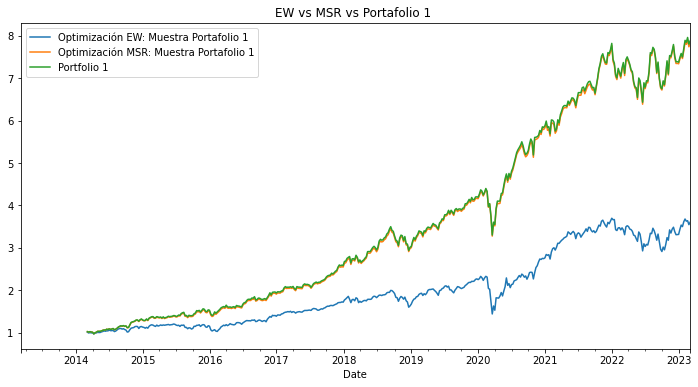

In [285]:
## Maximum Sharpe Ratio Portfolio (MSR)
# vector de retornos esperados
er_MSRp1 = annualize_rets(datap1, 52)
# matriz de covarianza
cov_MSRp1 = datap1.cov()

weight_MSRp1 = lambda x: weight_msr(er=er_MSRp1, cov=cov_MSRp1, rf=TBill['T-Bill'])
MSRp1 = backtest_ws(datap1, estimation_window=52, weighting=weight_MSRp1)
btr = pd.DataFrame({"Optimización EW: Muestra Portafolio 1": EWp1,"Optimización MSR: Muestra Portafolio 1": MSRp1, "Portfolio 1": p1})
(1+btr).cumprod().plot(figsize=(12,6), title="EW vs MSR vs Portafolio 1 ")
summary_stats(btr.dropna())

In [286]:
# Calculamos los pesos de cada activo en el portafolio EW
weights_scaled = np.round(weight_ew(datap1)*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
EquallyWeighted_Portfolio1 = pd.Series((weights_str), index = datap1.columns)
EquallyWeighted_Portfolio1

AJG     2.00
AMD     2.00
ANSS    2.00
AON     2.00
APA     2.00
BEN     2.00
CE      2.00
CPB     2.00
CTAS    2.00
DHI     2.00
DISH    2.00
DOW     2.00
ECL     2.00
EMN     2.00
FDS     2.00
FISV    2.00
GILD    2.00
HRL     2.00
K       2.00
KDP     2.00
KEY     2.00
KEYS    2.00
LEN     2.00
LH      2.00
LYB     2.00
LYV     2.00
MNST    2.00
MTD     2.00
NTAP    2.00
NUE     2.00
ODFL    2.00
ORLY    2.00
PAYC    2.00
PNC     2.00
PPG     2.00
PPL     2.00
PTC     2.00
SNPS    2.00
SPG     2.00
SRE     2.00
STLD    2.00
SYF     2.00
TSCO    2.00
TTWO    2.00
TXT     2.00
URI     2.00
VICI    2.00
WBD     2.00
WDC     2.00
WYNN    2.00
dtype: object

In [289]:
# Calculamos los pesos de cada activo en el portafolio MSR
weights_scaled = np.round(weight_msr(er=er_MSRp1, cov=cov_MSRp1, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
SharpeOpt_Portfolio1 = pd.Series((weights_str), index = datap1.columns)
SharpeOpt_Portfolio1

AJG      3.66
AMD      2.01
ANSS     0.00
AON      0.00
APA      0.00
BEN      0.00
CE       0.00
CPB      0.00
CTAS    15.00
DHI      0.00
DISH     0.00
DOW      0.00
ECL      0.00
EMN      0.00
FDS      0.00
FISV     0.00
GILD     0.00
HRL     10.66
K        0.00
KDP     15.00
KEY      0.00
KEYS     0.00
LEN      0.00
LH       0.00
LYB      0.00
LYV      0.00
MNST     1.42
MTD      0.00
NTAP     0.00
NUE      0.00
ODFL    15.00
ORLY    11.27
PAYC     0.00
PNC      0.00
PPG      0.00
PPL      0.00
PTC      0.00
SNPS    11.14
SPG      0.00
SRE      0.00
STLD     3.12
SYF      0.00
TSCO     0.00
TTWO    11.72
TXT      0.00
URI      0.00
VICI     0.00
WBD      0.00
WDC      0.00
WYNN     0.00
dtype: object

# Global Minimum Variance (GMV) con submuestra del portafolio con Sharpe Ratio más alto (Portafolio 1).-

In [291]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 1
sortDataByVolatility(datap1[['AJG', 'AON', 'CTAS', 'FDS', 'FISV']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['CTAS', 'FDS', 'AON', 'FISV', 'AJG']

In [292]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 3
sortDataByVolatility(datap1[['ANSS','MTD','PTC','SNPS']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['PTC', 'ANSS', 'SNPS', 'MTD']

In [293]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 4
sortDataByVolatility(datap1[['CPB','HRL','K']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['CPB', 'HRL', 'K']

In [294]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 5
sortDataByVolatility(datap1[['DHI','LEN']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['LEN', 'DHI']

In [295]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 6
sortDataByVolatility(datap1[['APA', 'BEN', 'CE', 'ECL', 'EMN', 'LYB', 'NTAP', 'ODFL', 'PPG', 'URI', 'WDC', 'WYNN']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['APA',
 'WYNN',
 'WDC',
 'URI',
 'LYB',
 'NTAP',
 'EMN',
 'BEN',
 'CE',
 'ODFL',
 'PPG',
 'ECL']

In [296]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 9
sortDataByVolatility(datap1[['DISH', 'KEY', 'LYV', 'PNC', 'SPG', 'TXT', 'WBD']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['WBD', 'SPG', 'DISH', 'LYV', 'KEY', 'TXT', 'PNC']

In [297]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 11
sortDataByVolatility(datap1[['NUE','STLD']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['STLD', 'NUE']

In [298]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 12
sortDataByVolatility(datap1[['LH','PPL','SRE']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['LH', 'PPL', 'SRE']

In [299]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 13
sortDataByVolatility(datap1[['ORLY','TSCO']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['TSCO', 'ORLY']

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Optimización GMV: High Sharpe Assets Portafolio 1,17.76,14.30,-0.09,5.97,0.03,0.04,1.17,-18.21
Optimización GMV: Low Vol Assets Portafolio 1,15.27,14.31,-0.19,6.89,0.03,0.04,0.99,-20.26
Optimización GMV: Muestra Portafolio 1,14.04,13.18,-0.24,4.79,0.03,0.04,0.99,-16.77


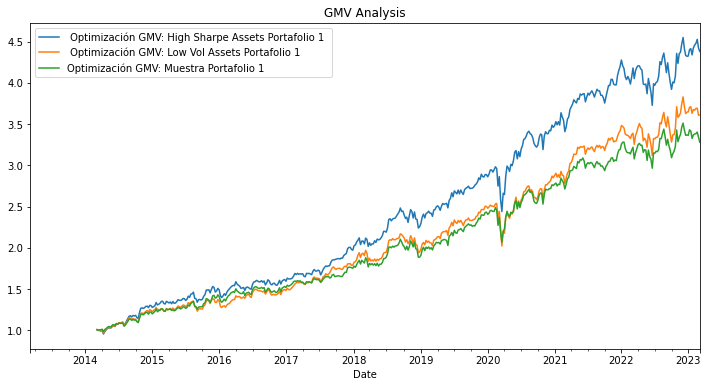

In [306]:
## GMV de activos con el Sharpe Ratio más alto del Portafolio 1
weight_GMVSharpeAssets = lambda r: weight_gmv(datap1[['CTAS','AMD','SNPS','HRL','DHI','ODFL','GILD','KDP','LYV','MNST','STLD','SRE','ORLY','TTWO']], cov_estimator=sample_cov)
GMVSharpeAssets = backtest_ws(datap1[['CTAS','AMD','SNPS','HRL','DHI','ODFL','GILD','KDP','LYV','MNST','STLD','SRE','ORLY','TTWO']], estimation_window=52, weighting=weight_GMVSharpeAssets)

## GMV de Clusters del Portafolio 1
weight_GMVVolAssets = lambda r: weight_gmv(datap1[['AJG','AMD','MTD','K','DHI','ECL','GILD','KDP','PNC','MNST','NUE','SRE','ORLY','TTWO']], cov_estimator=sample_cov)
GMVVolAssets = backtest_ws(datap1[['AJG','AMD','MTD','K','DHI','ECL','GILD','KDP','PNC','MNST','NUE','SRE','ORLY','TTWO']], estimation_window=52, weighting=weight_GMVVolAssets)

## GMV de toda la submuestra del Portafolio 1
weight_GMVp1 = lambda r: weight_gmv(datap1, cov_estimator=sample_cov)
GMVp1 = backtest_ws(datap1, estimation_window=52, weighting=weight_GMVp1)

# Back Tests
btr = pd.DataFrame({" Optimización GMV: High Sharpe Assets Portafolio 1 ": GMVSharpeAssets," Optimización GMV: Low Vol Assets Portafolio 1 ": GMVVolAssets , "Optimización GMV: Muestra Portafolio 1 ": GMVp1})
(1+btr).cumprod().plot(figsize=(12,6), title=  "GMV Analysis")
summary_stats(btr.dropna())

# Maximum Sharpe Ratio Portfolio (MSR)  & Equally- Weighted Portfolio (EW) con submuestra del Segundo portafolio con Sharpe Ratio más alto.-
------------

In [308]:
datap19 = data_m7
datap19

[*********************100%***********************]  50 of 50 completed


,AAPL,ADM,AEP,AES,AFL,AMGN,ARE,BA,BMY,BWA,...,RL,ROL,ROP,SYK,T,TMUS,TSLA,UAL,VTR,WYNN
Date,,,,,,,,,,,,,,,,,,,,,
2013-03-10,0.027782,0.016240,0.000632,0.025790,-0.001394,0.002912,0.001671,0.053704,0.012452,0.064969,...,0.017546,0.018250,0.006558,0.009989,1.242080e-02,0.066075,0.081226,0.087786,-0.008484,0.006864
2013-03-17,0.027657,0.014137,0.008633,0.013787,0.018748,-0.012796,-0.007781,0.064016,0.041711,0.003271,...,-0.034712,-0.009369,-0.008899,0.003195,-6.815682e-03,-0.039778,-0.082662,-0.013078,0.004976,0.022326
2013-03-24,0.041135,-0.006667,-0.000835,-0.007200,0.015075,0.051737,0.002800,-0.018628,0.036705,-0.041876,...,-0.016871,-0.004934,0.007295,-0.020628,2.220446e-16,0.015414,0.037687,0.030058,0.004102,0.017588
2013-03-31,-0.041675,0.028981,0.016088,0.012893,0.003279,0.061620,-0.000401,0.012143,0.019807,0.012039,...,0.007751,0.014463,0.013211,0.014542,7.136900e-03,0.034156,0.034681,0.004393,0.031276,0.025229
2013-04-07,-0.043962,-0.016603,0.001645,-0.011137,-0.048635,0.014925,-0.005495,0.003728,-0.005732,-0.053271,...,-0.003426,-0.058249,-0.036761,-0.003678,3.624942e-02,0.029358,0.091845,-0.085598,0.021038,-0.056887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-05,0.058727,-0.016142,-0.010315,-0.020922,-0.048279,-0.033432,0.044249,-0.024435,0.027605,0.035675,...,0.024996,-0.009439,-0.008684,0.113979,-6.015079e-03,-0.010495,0.067903,0.049046,0.018985,-0.000291
2023-02-12,-0.021097,0.003152,-0.007825,-0.004954,0.007062,-0.010890,-0.012575,0.033396,-0.030222,0.014913,...,-0.061006,0.010985,-0.006832,-0.066398,-3.832578e-02,-0.010262,0.036372,-0.044210,-0.030608,0.055167
2023-02-19,0.010198,-0.006091,0.020541,0.004596,-0.001392,0.000623,-0.024746,-0.005778,-0.015097,0.043667,...,0.038575,0.010017,0.000655,-0.004464,1.940225e-02,0.039318,0.058002,0.015759,-0.010394,0.003406


In [309]:
## Equally - Weighted Portfolio (EW)
EWp19 = backtest_ws(datap19, estimation_window=52, weighting=weight_ew)

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Optimización EW: Muestra Portafolio 19,14.30,19.82,-0.16,15.36,0.04,0.06,0.67,-40.40
Optimización MSR: Muestra Portafolio 19,27.10,20.39,-0.15,6.10,0.04,0.06,1.27,-29.35
Portfolio 19,27.71,21.44,-0.17,8.01,0.04,0.06,1.24,-34.04


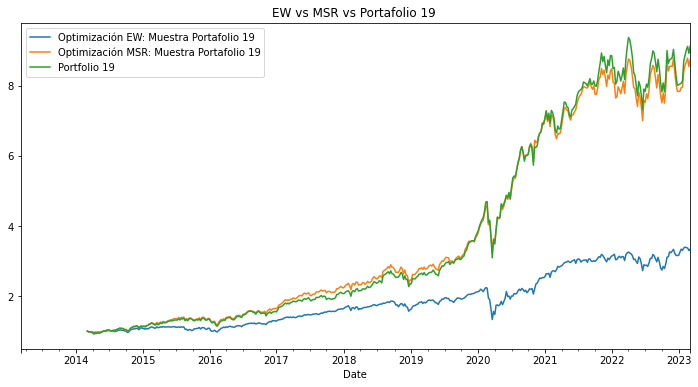

In [310]:
## Maximum Sharpe Ratio Portfolio (MSR)
# vector de retornos esperados
er_MSRp19 = annualize_rets(datap19, 52)
# matriz de covarianza
cov_MSRp19 = datap19.cov()

weight_MSRp19 = lambda x: weight_msr(er=er_MSRp19, cov=cov_MSRp19, rf=TBill['T-Bill'])
MSRp19 = backtest_ws(datap19, estimation_window=52, weighting=weight_MSRp19)
btr = pd.DataFrame({"Optimización EW: Muestra Portafolio 19": EWp19,"Optimización MSR: Muestra Portafolio 19": MSRp19, "Portfolio 19": p19})
(1+btr).cumprod().plot(figsize=(12,6), title="EW vs MSR vs Portafolio 19 ")
summary_stats(btr.dropna())

In [311]:
# Calculamos los pesos de cada activo en el portafolio EW
weights_scaled = np.round(weight_ew(datap19)*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
EquallyWeighted_Portfolio19 = pd.Series((weights_str), index = datap19.columns)
EquallyWeighted_Portfolio19

AAPL    2.00
ADM     2.00
AEP     2.00
AES     2.00
AFL     2.00
AMGN    2.00
ARE     2.00
BA      2.00
BMY     2.00
BWA     2.00
CARR    2.00
CPRT    2.00
CRL     2.00
CSX     2.00
DRI     2.00
DXCM    2.00
FANG    2.00
FMC     2.00
GEN     2.00
GPC     2.00
HAS     2.00
HII     2.00
JKHY    2.00
JNPR    2.00
KMX     2.00
L       2.00
LMT     2.00
LVS     2.00
MS      2.00
MTD     2.00
NWS     2.00
OGN     2.00
OXY     2.00
PH      2.00
PNC     2.00
PODD    2.00
PPL     2.00
PSX     2.00
PTC     2.00
REG     2.00
RL      2.00
ROL     2.00
ROP     2.00
SYK     2.00
T       2.00
TMUS    2.00
TSLA    2.00
UAL     2.00
VTR     2.00
WYNN    2.00
dtype: object

In [312]:
# Calculamos los pesos de cada activo en el portafolio MSR
weights_scaled = np.round(weight_msr(er=er_MSRp19, cov=cov_MSRp19, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
SharpeOpt_Portfolio19 = pd.Series((weights_str), index = datap19.columns)
SharpeOpt_Portfolio19

AAPL    15.00
ADM      0.00
AEP      0.00
AES      0.00
AFL      0.00
AMGN     0.00
ARE      0.00
BA       0.00
BMY      0.00
BWA      0.00
CARR     0.00
CPRT    10.50
CRL      0.00
CSX      0.00
DRI      0.00
DXCM    10.16
FANG     0.19
FMC      0.00
GEN      0.00
GPC      0.00
HAS      0.00
HII      2.76
JKHY     0.00
JNPR     0.00
KMX      0.00
L        0.00
LMT     15.00
LVS      0.00
MS       0.00
MTD      8.26
NWS      0.00
OGN      0.00
OXY      0.00
PH       0.00
PNC      0.00
PODD     0.00
PPL      0.00
PSX      0.00
PTC      0.00
REG      0.00
RL       0.00
ROL     11.91
ROP      0.00
SYK      0.00
T        0.00
TMUS    15.00
TSLA    11.21
UAL      0.00
VTR      0.00
WYNN     0.00
dtype: object

# Global Minimum Variance (GMV) con submuestra del portafolio con Segundo Sharpe Ratio más alto (Portafolio 19).-

In [314]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 1
sortDataByVolatility(datap19[['ADM', 'AES', 'AFL', 'BA', 'DRI', 'HAS', 'HII', 'L', 'LMT', 'PNC', 'UAL']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['UAL', 'BA', 'DRI', 'HAS', 'AES', 'HII', 'PNC', 'AFL', 'ADM', 'L', 'LMT']

In [315]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 2
sortDataByVolatility(datap19[['AMGN', 'BMY']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['AMGN', 'BMY']

In [316]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 3
sortDataByVolatility(datap19[['DXCM', 'PODD']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['DXCM', 'PODD']

In [317]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 4
sortDataByVolatility(datap19[['FANG', 'OXY', 'PSX']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['FANG', 'OXY', 'PSX']

In [318]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 6
sortDataByVolatility(datap19[['LVS', 'WYNN']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['WYNN', 'LVS']

In [319]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 7
sortDataByVolatility(datap19[['BWA', 'CPRT', 'CRL', 'CSX', 'FMC', 'GPC', 'JNPR', 'KMX', 'MS', 'PH', 'PTC', 'RL', 'SYK']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['KMX',
 'RL',
 'BWA',
 'CRL',
 'PTC',
 'PH',
 'MS',
 'FMC',
 'JNPR',
 'CPRT',
 'CSX',
 'GPC',
 'SYK']

In [320]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 8
sortDataByVolatility(datap19[['AEP', 'ARE', 'PPL', 'REG', 'T', 'VTR']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['VTR', 'REG', 'PPL', 'ARE', 'AEP', 'T']

In [321]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 9
sortDataByVolatility(datap19[['AAPL', 'JKHY', 'MTD', 'ROL', 'ROP']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['AAPL', 'MTD', 'ROL', 'JKHY', 'ROP']

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Optimización GMV: High Sharpe Assets Portafolio 19,17.55,16.55,-0.29,7.90,0.03,0.05,0.99,-27.55
Optimización GMV: Low Vol Assets Portafolio 19,13.25,15.98,-0.42,7.46,0.03,0.05,0.76,-27.74
Optimización GMV: Muestra Portafolio 19,13.16,14.91,-0.56,9.15,0.03,0.05,0.81,-25.07


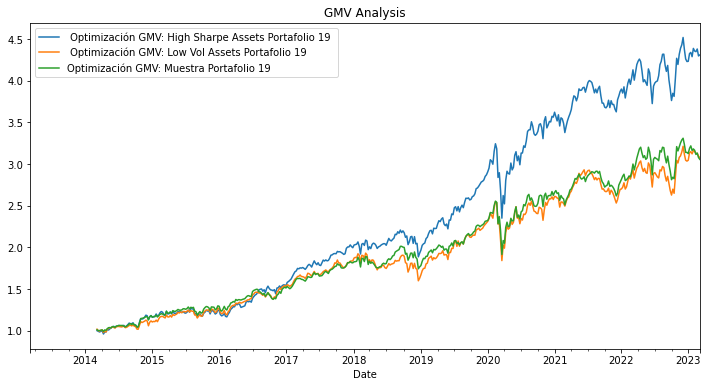

In [322]:
## GMV de activos con el Sharpe Ratio más alto del Portafolio 19
weight_GMVSharpeAssets = lambda r: weight_gmv(datap19[['LMT','AMGN','DXCM','FANG','GEN','LVS','CPRT','AEP','AAPL','TMUS','TSLA']], cov_estimator=sample_cov)
GMVSharpeAssets = backtest_ws(datap19[['LMT','AMGN','DXCM','FANG','GEN','LVS','CPRT','AEP','AAPL','TMUS','TSLA']], estimation_window=52, weighting=weight_GMVSharpeAssets)

## GMV de Clusters del Portafolio 19
weight_GMVVolAssets = lambda r: weight_gmv(datap19[['LMT','BMY','PODD','PSX','GEN','LVS','SYK','T','ROP','TMUS','TSLA']], cov_estimator=sample_cov)
GMVVolAssets = backtest_ws(datap19[['LMT','BMY','PODD','PSX','GEN','LVS','SYK','T','ROP','TMUS','TSLA']], estimation_window=52, weighting=weight_GMVVolAssets)

## GMV de toda la submuestra del Portafolio 19
weight_GMVp19 = lambda r: weight_gmv(datap19, cov_estimator=sample_cov)
GMVp19 = backtest_ws(datap19, estimation_window=52, weighting=weight_GMVp19)

# Back Tests
btr = pd.DataFrame({" Optimización GMV: High Sharpe Assets Portafolio 19 ": GMVSharpeAssets," Optimización GMV: Low Vol Assets Portafolio 19 ": GMVVolAssets , "Optimización GMV: Muestra Portafolio 19 ": GMVp19})
(1+btr).cumprod().plot(figsize=(12,6), title=  "GMV Analysis")
summary_stats(btr.dropna())

# Maximum Sharpe Ratio Portfolio (MSR)  & Equally- Weighted Portfolio (EW) con submuestra del Tercer portafolio con Sharpe Ratio más alto.-
------------

In [323]:
datap7 = data_m3
datap7

[*********************100%***********************]  50 of 50 completed


,AKAM,ALK,ANSS,AZO,CAH,CBOE,CBRE,CDNS,CDW,CFG,...,ROST,SNPS,TMO,TRGP,TT,UNH,WAB,WDC,WYNN,ZION
Date,,,,,,,,,,,,,,,,,,,,,
2013-03-10,-0.004278,0.054466,0.032500,0.012058,0.000649,-0.005300,0.002441,0.011880,NaN,NaN,...,-0.045841,0.014930,0.022700,0.000489,0.046710,0.009190,0.004078,-0.003137,0.006864,0.045023
2013-03-17,-0.068475,0.030261,0.004766,0.017236,0.006482,0.014302,0.011770,-0.038674,NaN,NaN,...,0.001424,-0.002546,0.003364,0.007816,0.019886,0.021045,0.007108,0.052455,0.022327,0.010277
2013-03-24,0.002594,0.060938,-0.008612,0.009773,-0.096393,0.006082,-0.008825,-0.043103,NaN,NaN,...,0.052061,-0.012195,-0.015424,0.057845,0.002167,-0.004933,0.013914,-0.044457,0.017588,-0.013302
2013-03-31,0.015526,0.017661,0.025053,0.002653,-0.004678,0.015114,0.021854,0.045796,NaN,NaN,...,0.023814,0.030146,0.006977,0.038032,-0.009008,0.050496,0.015414,0.054786,0.025229,-0.009120
2013-04-07,-0.032276,-0.071764,-0.060673,0.001084,0.019943,-0.014348,-0.040792,-0.047380,NaN,NaN,...,-0.021445,-0.029543,0.008760,-0.011330,-0.018178,0.085474,-0.030261,-0.009743,-0.056887,-0.044417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-05,0.021849,0.048020,0.032100,0.012311,0.028635,0.017690,0.031731,0.004432,0.040302,0.036622,...,-0.034818,0.011672,0.024633,-0.021200,0.052364,-0.028865,0.023272,-0.038248,-0.000291,0.019487
2023-02-12,-0.042875,-0.072751,-0.029757,0.048021,0.014745,0.015612,0.001836,-0.011030,0.022678,-0.029703,...,-0.001214,-0.006446,-0.027818,0.045498,-0.016962,0.047095,-0.021037,-0.005549,0.055167,-0.034920
2023-02-19,-0.095906,-0.009883,0.013931,0.036572,-0.013153,0.022900,0.016724,0.057889,0.040313,0.001391,...,0.004428,-0.012976,-0.020493,-0.036612,0.005679,0.009772,0.021101,-0.033248,0.003406,-0.012892


In [324]:
## Equally - Weighted Portfolio (EW)
EWp7 = backtest_ws(datap7, estimation_window=52, weighting=weight_ew)

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Optimización EW: Muestra Portafolio 7,15.86,20.06,-0.25,14.82,0.04,0.06,0.74,-39.06
Optimización MSR: Muestra Portafolio 7,24.26,16.49,-0.09,6.91,0.03,0.05,1.40,-21.53
Portfolio 7,22.10,16.93,-0.43,9.45,0.03,0.05,1.24,-25.71


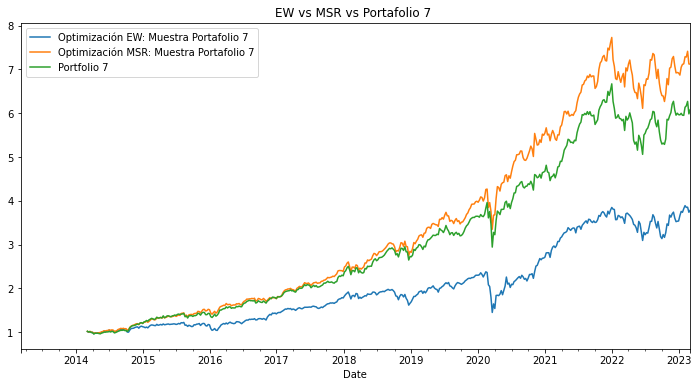

In [325]:
## Maximum Sharpe Ratio Portfolio (MSR)
# vector de retornos esperados
er_MSRp7 = annualize_rets(datap7, 52)
# matriz de covarianza
cov_MSRp7 = datap7.cov()

weight_MSRp7 = lambda x: weight_msr(er=er_MSRp7, cov=cov_MSRp7, rf=TBill['T-Bill'])
MSRp7 = backtest_ws(datap7, estimation_window=52, weighting=weight_MSRp7)
btr = pd.DataFrame({"Optimización EW: Muestra Portafolio 7": EWp7,"Optimización MSR: Muestra Portafolio 7": MSRp7, "Portfolio 7": p7})
(1+btr).cumprod().plot(figsize=(12,6), title="EW vs MSR vs Portafolio 7 ")
summary_stats(btr.dropna())

In [326]:
# Calculamos los pesos de cada activo en el portafolio EW
weights_scaled = np.round(weight_ew(datap1)*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
EquallyWeighted_Portfolio7 = pd.Series((weights_str), index = datap7.columns)
EquallyWeighted_Portfolio7

AKAM     2.00
ALK      2.00
ANSS     2.00
AZO      2.00
CAH      2.00
CBOE     2.00
CBRE     2.00
CDNS     2.00
CDW      2.00
CFG      2.00
CHD      2.00
COF      2.00
COST     2.00
CPT      2.00
CSGP     2.00
DHI      2.00
DPZ      2.00
FAST     2.00
FITB     2.00
GOOGL    2.00
HBAN     2.00
HCA      2.00
HIG      2.00
HPE      2.00
HRL      2.00
HST      2.00
IDXX     2.00
KLAC     2.00
LH       2.00
MAS      2.00
MCD      2.00
MHK      2.00
MSCI     2.00
NUE      2.00
ORLY     2.00
OTIS     2.00
OXY      2.00
PFG      2.00
PNC      2.00
RJF      2.00
ROST     2.00
SNPS     2.00
TMO      2.00
TRGP     2.00
TT       2.00
UNH      2.00
WAB      2.00
WDC      2.00
WYNN     2.00
ZION     2.00
dtype: object

In [327]:
# Calculamos los pesos de cada activo en el portafolio MSR
weights_scaled = np.round(weight_msr(er=er_MSRp7, cov=cov_MSRp7, rf=TBill['T-Bill'])*100, decimals=2)
weights_str = [format(num, '.2f') for num in weights_scaled]
SharpeOpt_Portfolio7 = pd.Series((weights_str), index = datap7.columns)
SharpeOpt_Portfolio7

AKAM      0.00
ALK       0.00
ANSS      0.00
AZO       0.00
CAH       0.00
CBOE      2.99
CBRE      0.00
CDNS     15.00
CDW       4.20
CFG       0.00
CHD       7.93
COF       0.00
COST      2.02
CPT       0.00
CSGP      0.00
DHI       0.00
DPZ       9.51
FAST      0.00
FITB      0.00
GOOGL     0.00
HBAN      0.00
HCA       0.00
HIG       0.00
HPE       0.00
HRL      11.31
HST       0.00
IDXX      0.00
KLAC      0.00
LH        0.00
MAS       0.00
MCD       0.00
MHK       0.00
MSCI     15.00
NUE       0.00
ORLY      7.07
OTIS      0.00
OXY       0.00
PFG       0.00
PNC       0.00
RJF       0.00
ROST      0.00
SNPS      0.00
TMO       9.98
TRGP      0.00
TT        0.00
UNH      15.00
WAB       0.00
WDC       0.00
WYNN      0.00
ZION      0.00
dtype: object

# Global Minimum Variance (GMV) con submuestra del portafolio con Tercer Sharpe Ratio más alto (Portafolio 7).-

In [328]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 2
sortDataByVolatility(datap7[['CHD','HRL']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['CHD', 'HRL']

In [329]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 4
sortDataByVolatility(datap7[['ALK', 'CBRE', 'COF', 'CPT', 'FITB', 'HBAN', 'HCA', 'HIG', 'HST', 'MCD', 'NUE', 'PFG', 'PNC', 'RJF', 'ROST', 'TT', 'WAB', 'WDC', 'WYNN', 'ZION']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['WYNN',
 'WDC',
 'ALK',
 'COF',
 'NUE',
 'FITB',
 'ZION',
 'HCA',
 'PFG',
 'WAB',
 'ROST',
 'HST',
 'HBAN',
 'CBRE',
 'RJF',
 'HIG',
 'PNC',
 'TT',
 'CPT',
 'MCD']

In [330]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 5
sortDataByVolatility(datap7[['DHI','FAST','MAS','MHK']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['MHK', 'DHI', 'MAS', 'FAST']

In [331]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 6
sortDataByVolatility(datap7[['AZO','ORLY']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['ORLY', 'AZO']

In [332]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 7
sortDataByVolatility(datap7[['AKAM', 'ANSS', 'CDNS', 'COST', 'CSGP', 'GOOGL', 'IDXX', 'KLAC', 'MSCI', 'SNPS', 'TMO']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['KLAC',
 'IDXX',
 'CSGP',
 'AKAM',
 'CDNS',
 'MSCI',
 'ANSS',
 'GOOGL',
 'SNPS',
 'TMO',
 'COST']

In [333]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 8
sortDataByVolatility(datap7[['OXY','TRGP']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['TRGP', 'OXY']

In [334]:
# Orden de empresas según la volatilidad anualizada más baja para el cluster 9
sortDataByVolatility(datap7[['CAH','LH','UNH']])

Summary Statistic Information from 03/04/2013 to 03/05/2023:


['CAH', 'LH', 'UNH']

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Optimización GMV: High Sharpe Assets Portafolio 7,21.56,16.75,-0.52,9.74,0.03,0.05,1.22,-26.55
Optimización GMV: Low Vol Assets Portafolio 7,16.51,14.51,-0.53,7.58,0.03,0.05,1.06,-23.51
Optimización GMV: Muestra Portafolio 7,14.84,12.79,-0.60,7.06,0.03,0.04,1.08,-20.00


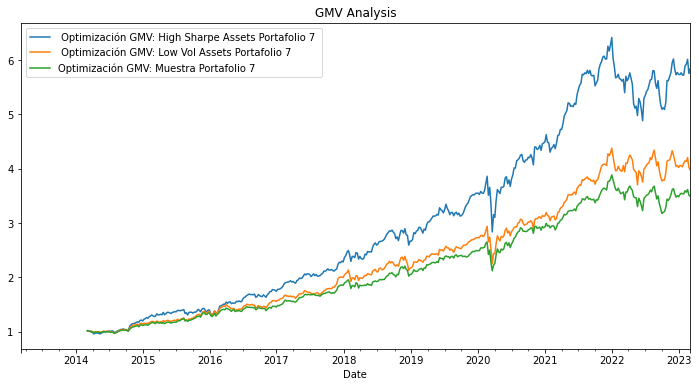

In [335]:
## GMV de activos con el Sharpe Ratio más alto del Portafolio 7
weight_GMVSharpeAssets = lambda r: weight_gmv(datap7[['CBOE','CHD','DPZ','TT','DHI','ORLY','MSCI','TRGP','UNH']], cov_estimator=sample_cov)
GMVSharpeAssets = backtest_ws(datap7[['CBOE','CHD','DPZ','TT','DHI','ORLY','MSCI','TRGP','UNH']], estimation_window=52, weighting=weight_GMVSharpeAssets)

## GMV de Clusters del Portafolio 7
weight_GMVVolAssets = lambda r: weight_gmv(datap7[['CBOE','HRL','DPZ','MCD','FAST','AZO','COST','OXY','UNH']], cov_estimator=sample_cov)
GMVVolAssets = backtest_ws(datap7[['CBOE','HRL','DPZ','MCD','FAST','AZO','COST','OXY','UNH']], estimation_window=52, weighting=weight_GMVVolAssets)

## GMV de toda la submuestra del Portafolio 7
weight_GMVp7 = lambda r: weight_gmv(datap7, cov_estimator=sample_cov)
GMVp7 = backtest_ws(datap7, estimation_window=52, weighting=weight_GMVp7)

# Back Tests
btr = pd.DataFrame({" Optimización GMV: High Sharpe Assets Portafolio 7 ": GMVSharpeAssets," Optimización GMV: Low Vol Assets Portafolio 7 ": GMVVolAssets , "Optimización GMV: Muestra Portafolio 7 ": GMVp7})
(1+btr).cumprod().plot(figsize=(12,6), title=  "GMV Analysis")
summary_stats(btr.dropna())

# Resumen de todos los Portafolios creados

,Annu. Ave Return(%),Annu. Vol(%),Skewness,Kurtosis,Cornish-Fisher VaR (5%),Historic CVaR (5%),Sharpe Ratio,Max Drawdown(%)
Portfolio 1,25.66,16.77,-0.23,6.14,0.03,0.05,1.46,-24.96
Optimización MSR: Muestra Portafolio 1,25.56,16.72,-0.25,6.40,0.03,0.05,1.46,-25.27
Optimización MSR: Muestra Portafolio 7,24.26,16.49,-0.09,6.91,0.03,0.05,1.40,-21.53
Portfolio 3,26.40,18.79,-0.28,6.28,0.04,0.06,1.34,-27.89
Portfolio 2,24.69,18.26,-0.15,4.97,0.04,0.06,1.29,-21.65
Optimización MSR: Muestra Portafolio 19,27.10,20.39,-0.15,6.10,0.04,0.06,1.27,-29.35
Portfolio 19,27.71,21.44,-0.17,8.01,0.04,0.06,1.24,-34.04
Portfolio 7,22.10,16.93,-0.43,9.45,0.03,0.05,1.24,-25.71
Portfolio 13,20.86,16.74,-0.28,7.54,0.03,0.05,1.18,-25.77
Portfolio 25,22.44,18.16,-0.04,6.20,0.04,0.05,1.17,-25.20


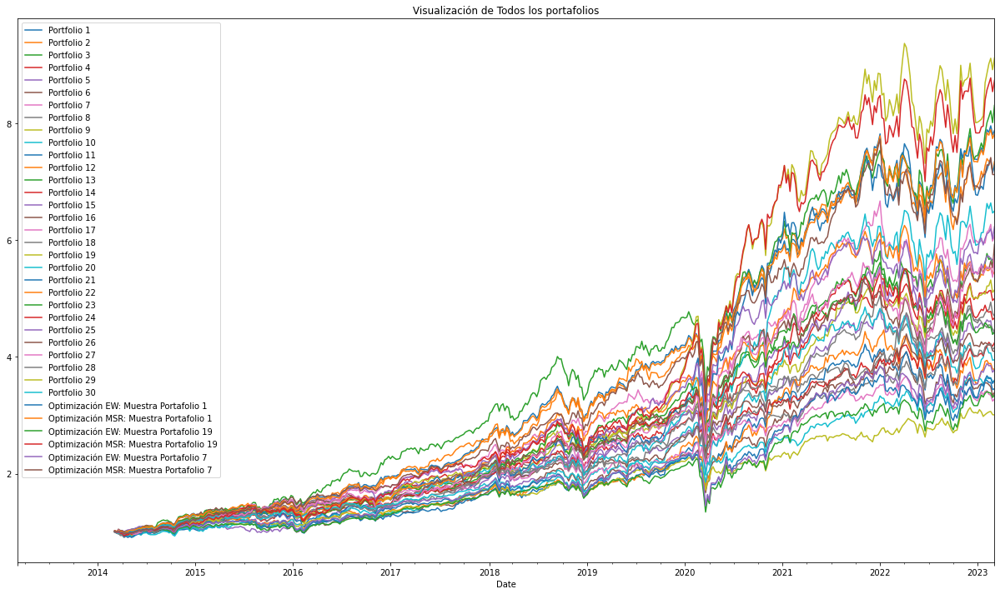

In [338]:
btr = pd.DataFrame({"Portfolio 1": p1,"Portfolio 2": p2,"Portfolio 3": p3,"Portfolio 4": p4,"Portfolio 5": p5,
                    "Portfolio 6": p6,"Portfolio 7": p7,"Portfolio 8": p8,"Portfolio 9": p9,"Portfolio 10": p10,
                    "Portfolio 11": p11,"Portfolio 12": p12,"Portfolio 13": p13,"Portfolio 14": p14,"Portfolio 15": p15,
                    "Portfolio 16": p16,"Portfolio 17": p17,"Portfolio 18": p18,"Portfolio 19": p19,"Portfolio 20": p20,
                    "Portfolio 21": p21,"Portfolio 22": p22,"Portfolio 23": p23,"Portfolio 24": p24,"Portfolio 25": p25,
                    "Portfolio 26": p26,"Portfolio 27": p27,"Portfolio 28": p28,"Portfolio 29": p29,"Portfolio 30": p30,
                    "Optimización EW: Muestra Portafolio 1": EWp1,"Optimización MSR: Muestra Portafolio 1": MSRp1,
                    "Optimización EW: Muestra Portafolio 19": EWp19,"Optimización MSR: Muestra Portafolio 19": MSRp19,
                    "Optimización EW: Muestra Portafolio 7": EWp7,"Optimización MSR: Muestra Portafolio 7": MSRp7
                   })
(1+btr).cumprod().plot(figsize=(21,12), title=" Visualización de Todos los portafolios ")
summary_stats(btr.dropna()).sort_values('Sharpe Ratio', ascending=False)